In [1]:
# Parameters (overriden by papermill)
DATASET = 'short-linkers'

In [2]:
# Parameters
DATASET = "long-linkers-enh"


In [3]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import os
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from tqdm import tqdm
sns.set_palette('Dark2')
sns.set_context('paper')
sns.set_style({'axes.axisbelow': True, 
               'axes.edgecolor': '.15',
               'axes.facecolor': 'white',
               'axes.grid': True, 
               'axes.labelcolor': '.15', 
               'figure.facecolor': 'white', 
               'grid.color': '.15',
               'grid.linestyle': ':', 
               'grid.alpha': .5, 
               'image.cmap': 'Greys', 
               'legend.frameon': False, 
               'legend.numpoints': 1, 
               'legend.scatterpoints': 1,
               'lines.solid_capstyle': 'butt', 
               'axes.spines.right': False, 
               'axes.spines.top': False,  
               'text.color': '.15',  
               'xtick.top': False, 
               'ytick.right': False, 
               'xtick.color': '.15',
               'xtick.direction': 'out', 
               'ytick.color': '.15', 
               'ytick.direction': 'out', 
              })


import matplotlib

FONT_SIZE_PT = 5
matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = FONT_SIZE_PT
matplotlib.rcParams['axes.labelsize'] = FONT_SIZE_PT
matplotlib.rcParams['axes.titlesize'] = FONT_SIZE_PT
matplotlib.rcParams['figure.titlesize'] = FONT_SIZE_PT
matplotlib.rcParams['xtick.labelsize'] = FONT_SIZE_PT
matplotlib.rcParams['ytick.labelsize'] = FONT_SIZE_PT
matplotlib.rcParams['legend.fontsize'] = FONT_SIZE_PT
matplotlib.rcParams['legend.title_fontsize'] = FONT_SIZE_PT

matplotlib.rcParams['xtick.major.size'] = matplotlib.rcParams['ytick.major.size'] = 2
matplotlib.rcParams['xtick.major.width'] = matplotlib.rcParams['ytick.major.width'] = 0.5


matplotlib.rcParams['xtick.minor.size'] = matplotlib.rcParams['ytick.minor.size'] = 1

matplotlib.rcParams['xtick.minor.width'] = matplotlib.rcParams['ytick.minor.width'] = 0.5

matplotlib.rcParams['axes.linewidth'] = 0.5
matplotlib.rcParams['lines.linewidth'] = 0.5
matplotlib.rcParams['grid.linewidth'] = 0.25
matplotlib.rcParams['patch.linewidth'] = 0.25
matplotlib.rcParams['lines.markeredgewidth'] = 0.25
matplotlib.rcParams['lines.markersize'] = 2

FIVE_MM_IN_INCH = 0.19685
DPI = 600
matplotlib.rcParams['figure.figsize'] = (10 * FIVE_MM_IN_INCH, 9 * FIVE_MM_IN_INCH)
matplotlib.rcParams['savefig.dpi'] = DPI
matplotlib.rcParams['figure.dpi'] = DPI // 4


#http://phyletica.org/matplotlib-fonts/
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# (02) Transformation and modeling

This notebook handles the core of the analysis:

Transformation of the numeric data into format that can be read by the model
Normalisation of the data
Modelling of differential enrichments

## Configuration

Input file (the numeric data from previous notebook):

In [4]:
import pathlib

INPUT_NUMERIC_DATA = pathlib.Path('outputs') / '01-extracting' / f'data_numeric.{DATASET}.csv'
assert INPUT_NUMERIC_DATA.is_file()

INPUT_METADATA = pathlib.Path('outputs') / '01-extracting' / f'data_metadata.{DATASET}.csv'
assert INPUT_METADATA.is_file()

output directory

In [5]:
import pathlib
OUTPUT_DIRECTORY = pathlib.Path('outputs') / '02-transformation-and-modelling' / DATASET

if not OUTPUT_DIRECTORY.is_dir():
    OUTPUT_DIRECTORY.mkdir(parents=True)

Parameters, constants:

In [6]:
# To do analysis, we will require that:
#- at least this many (below) values per condition are set (for the condition analysed)
MINIMUM_NUMBER_OF_OBSERVED_VALUES_PER_CONDITION = 2

# Cutoff for BH-adjusted p-values
FDR_THRESHOLD = 0.05

# FC threshold
FC_THRESHOLD = 1.0 # used to identify "strong" effects

## Reading metadata

In [7]:
data_metadata = pd.read_csv(INPUT_METADATA, index_col=0)
data_metadata.head()

,# AAs,# PSMs,# Peptides,# Peptides (by Search Engine): Mascot,# Unique Peptides,Accession,Coverage [%],Description,Gene,MW [kDa],Score Mascot: Mascot
Label,,,,,,,,,,,
MYH9,1960,20013,170,170,137,P35579,71,Myosin-9 OS=Homo sapiens OX=9606 GN=MYH9 PE=1 ...,MYH9,226.4,639499
SPTAN1,2472,11500,205,205,204,Q13813,79,"Spectrin alpha chain, non-erythrocytic 1 OS=Ho...",SPTAN1,284.4,391743
PRKDC,4128,12445,246,246,246,P78527,64,DNA-dependent protein kinase catalytic subunit...,PRKDC,468.8,377897
ACTB,375,10826,30,30,13,P60709,82,"Actin, cytoplasmic 1 OS=Homo sapiens OX=9606 G...",ACTB,41.7,369811
SPTBN1,2364,10348,180,180,166,Q01082,79,"Spectrin beta chain, non-erythrocytic 1 OS=Hom...",SPTBN1,274.4,350270


## Reading numeric data

In [8]:
data_numeric = pd.read_csv(INPUT_NUMERIC_DATA, index_col=0)
data_numeric.columns.name = 'Experiment_Linker_Replicate'
data_numeric.head()

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,2.012982e+09,2.435018e+09,2.687300e+09,2.974732e+09,2.815155e+09,2.664790e+09,2.206769e+09,2.937641e+09,1.541227e+09,2.223824e+09,...,1.625335e+09,1.808056e+09,1.905528e+09,2.050247e+09,1.285533e+09,2.407647e+09,1.993102e+09,1.377992e+09,2.111906e+09,2.361874e+09
SPTAN1,7.198720e+08,9.610952e+08,1.060747e+09,1.057862e+09,1.056938e+09,9.690962e+08,7.797758e+08,1.022564e+09,7.093685e+08,9.102410e+08,...,6.559300e+08,7.782214e+08,8.114757e+08,8.113995e+08,5.240397e+08,9.736662e+08,8.067823e+08,7.037297e+08,8.212826e+08,9.360189e+08
PRKDC,7.189680e+08,8.020305e+08,1.040543e+09,1.030530e+09,8.354429e+08,8.790567e+08,7.307067e+08,8.629810e+08,8.357701e+08,1.062908e+09,...,8.284987e+08,7.411441e+08,9.397634e+08,7.519692e+08,5.829893e+08,1.002489e+09,7.611802e+08,6.041735e+08,8.331257e+08,8.430505e+08
ACTB,1.711385e+10,2.030884e+10,2.143226e+10,1.960820e+10,2.060654e+10,1.932797e+10,1.743471e+10,2.114668e+10,1.532196e+10,2.179764e+10,...,1.425466e+10,1.813711e+10,1.933376e+10,1.845758e+10,1.222580e+10,2.127657e+10,1.772308e+10,1.732659e+10,1.504822e+10,2.033082e+10
SPTBN1,7.444007e+08,1.283232e+09,1.334341e+09,1.233183e+09,1.224636e+09,1.386340e+09,1.237537e+09,7.938937e+08,5.858394e+08,8.826573e+08,...,1.026505e+09,1.317820e+09,1.265981e+09,2.981148e+09,9.649839e+08,9.629035e+08,8.020600e+08,6.267472e+08,4.881266e+09,8.424549e+08


For this notebook it will also help to establish a set of "Headers" which describe what each column means:

In [9]:
import re

    
_df_head = []
for col in data_numeric.columns:

    # The column headers are encoded a bit inconsistently
    # we thus them here in a hacky way, but it works (see below)
    experiment_linker, __, rep = col.rpartition('_')
    experiment_linker = experiment_linker.strip('_')
    experiment, linker, __ = re.split('_(\d+bp.*)', experiment_linker)
    
    # Special case for one typo
    if rep.startswith('scr'):
        linker += '_' + rep[:3]
        rep = rep[3:]
        
    if rep.startswith('repl'):
        rep = rep[4:]

    _df_head.append([col, experiment, linker, rep])

_df_head = pd.DataFrame(_df_head, columns=[data_numeric.columns.name, 'Experiment', 'Linker', 'Replicate']).set_index(data_numeric.columns.name)

_df_head['Experiment_Linker'] = _df_head['Experiment'].str.cat(_df_head['Linker'], sep='_')

headers_full = _df_head

In [10]:
headers_full

,Experiment,Linker,Replicate,Experiment_Linker
Experiment_Linker_Replicate,,,,
H3unmod_50bp_repl1,H3unmod,50bp,1,H3unmod_50bp
H3K27ac_50bp_repl1,H3K27ac,50bp,1,H3K27ac_50bp
H3K27ac_200bp_scr_repl1,H3K27ac,200bp_scr,1,H3K27ac_200bp_scr
H3K27ac_200bp_SV40enh_repl1,H3K27ac,200bp_SV40enh,1,H3K27ac_200bp_SV40enh
H3K4me1K27ac_50bp_repl1,H3K4me1K27ac,50bp,1,H3K4me1K27ac_50bp
H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac,200bp_scr,1,H3K4me1K27ac_200bp_scr
H3K4me1K27ac_200bp_SV40enh_repl1,H3K4me1K27ac,200bp_SV40enh,1,H3K4me1K27ac_200bp_SV40enh
H3unmod_200bp_scr_repl1,H3unmod,200bp_scr,1,H3unmod_200bp_scr
H3unmod_200bp_SV40enh_repl1,H3unmod,200bp_SV40enh,1,H3unmod_200bp_SV40enh


In [11]:
headers_full['Linker'].value_counts()

50bp             12
200bp_scr        12
200bp_SV40enh    12
Name: Linker, dtype: int64

In [12]:
headers_full['Replicate'].value_counts()

1    12
2    12
3    12
Name: Replicate, dtype: int64

In [13]:
headers_full['Experiment'].value_counts()

H3unmod         9
H3K27ac         9
H3K4me1K27ac    9
H3K4me1         9
Name: Experiment, dtype: int64

The data we are loading here is MS intensities; they generally make more sense in log scale. We will therefore transform the data to log2 here and work with that from now on:

In [14]:
data_numeric_log2 = data_numeric.apply(np.log2).replace([-np.inf, np.inf], np.nan)

# EDA (log2 transformed, unnormalised, unfiltered)

### Missing values

The first thing that is very obvious is that this data has many missing values:


Distribution of missing values in the log2-transformed, unnormalised, and unfiltered data (long-linkers-enh). 
The heatmap above displays all proteins in the data in rows, and all experiments in columns. Dark values indicate the presence of a value, while white space indicates the absence of one. The sparkline on the right hand side counts the number of values per protein.



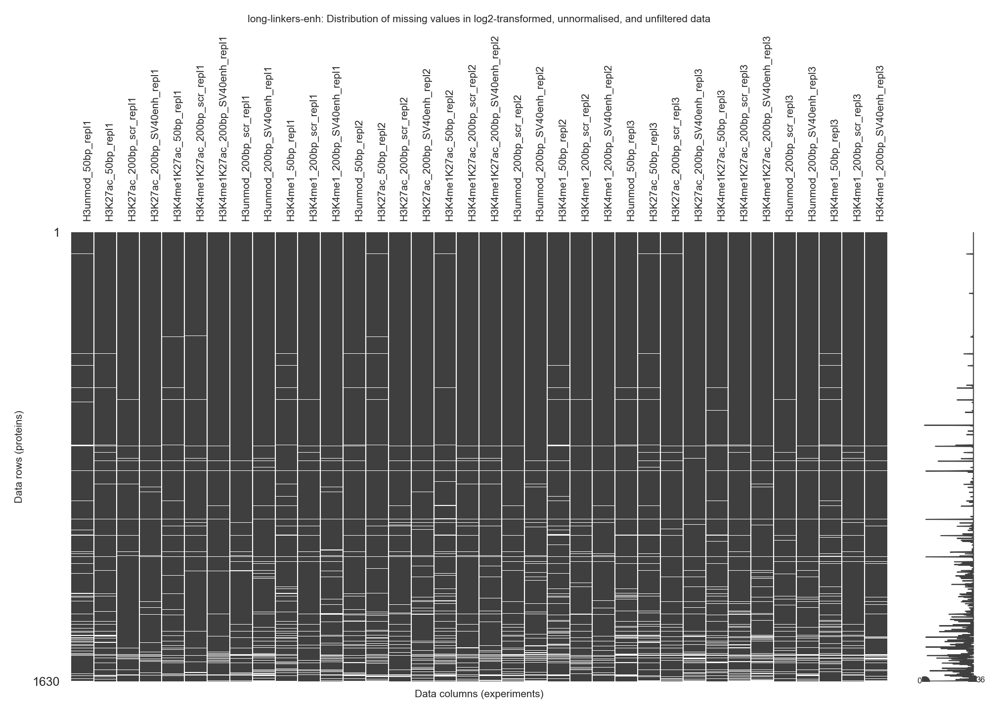

In [15]:
import missingno as msgno

msgno.matrix(data_numeric_log2, figsize=(40*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH), fontsize=5)

plt.title(f"{DATASET}: Distribution of missing values in log2-transformed, unnormalised, and unfiltered data")
plt.xlabel("Data columns (experiments)")
plt.ylabel("Data rows (proteins)")
plt.xticks(rotation=90)

_fname = OUTPUT_DIRECTORY / f'01-EDA-log2-transformed-unnormalised-unfiltered-missing-values.{DATASET}.png'
_caption = f"""
Distribution of missing values in the log2-transformed, unnormalised, and unfiltered data ({DATASET}). 
The heatmap above displays all proteins in the data in rows, and all experiments in columns. Dark values indicate the presence of a value, while white space indicates the absence of one. The sparkline on the right hand side counts the number of values per protein.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

In [16]:
data_numeric_log2.isnull().mean().sort_values(ascending=False).head()

Experiment_Linker_Replicate
H3unmod_50bp_repl1         0.060736
H3K4me1K27ac_50bp_repl2    0.060736
H3K4me1_50bp_repl2         0.055215
H3K4me1_50bp_repl1         0.053988
H3K4me1_50bp_repl3         0.052761
dtype: float64

### Normality

The analyses below will assume that the log2-transformed data is approximately normal.

We can qualititatively verify this by plotting the data distributions.

We see that the fit is not perfect but is perhaps acceptable. We will therefore not worry about the normality of the data.

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)



Distribution of non-null values of log2-transformed, unnormalised, and unfiltered dataset (long-linkers-enh). 
The rows facet the four experiment types, while the columns split the data per replicate.
The green distribution plot shows the histogram of observed log2 values in the data.
The black curve shows the corresponding normal distribution fit to the data, whose parameters are written in the top-right corner.
The black vertical line indicates the mean ($\mu$) estimate.



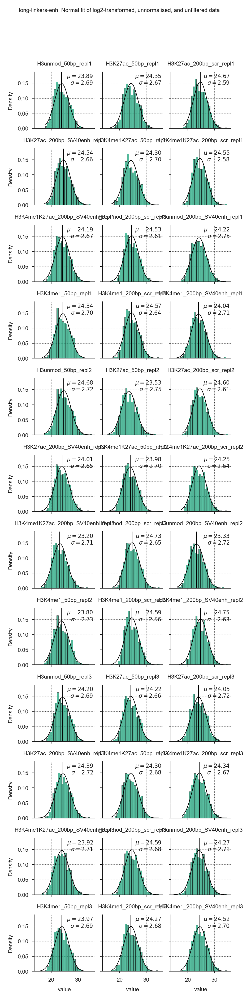

In [17]:
from scipy.stats import norm
def _plot_norm_fit(values, *args, color=None, **kwargs):
    """
    Fits a normal distribution to the data and plots its PDF
    """
    mu, std = norm.fit(values)

    min_ = values.min()
    max_ = values.max()
    
    ax = plt.gca()
    xs = np.linspace(min_, max_, 100)
    ys = norm.pdf(xs, mu, std)
    
    ax.plot(xs, ys, **kwargs, color='black', label='Normal fit')
    ax.axvline(mu, color='black')
    
    ax.text(
        0.98, 0.98, '\n'.join([r'$\mu = {:.2f}$'.format(mu),r'$\sigma = {:.2f}$'.format(std)]),
        ha='right', va='top', transform=ax.transAxes
    )
    
    

# Convert data to long format
_df = data_numeric_log2.copy()
_df = _df.stack(_df.columns.names)
_df.name = 'value'
_df = _df.reset_index()

# Plot the histograms and normal distribution fits
fgrid = sns.FacetGrid(col='Experiment_Linker_Replicate', col_wrap=3, col_order=data_numeric_log2.columns, data=_df, size=FIVE_MM_IN_INCH*5)
fgrid.map(sns.histplot, 'value', stat='density')
fgrid.map(_plot_norm_fit, 'value')
fgrid.set_titles('{col_name}')

plt.suptitle(f"{DATASET}: Normal fit of log2-transformed, unnormalised, and unfiltered data", y=1.05)

_fname = OUTPUT_DIRECTORY / f'01-EDA-log2-transformed-unnormalised-unfiltered-normal-fit.{DATASET}.pdf'
_caption = f"""
Distribution of non-null values of log2-transformed, unnormalised, and unfiltered dataset ({DATASET}). 
The rows facet the four experiment types, while the columns split the data per replicate.
The green distribution plot shows the histogram of observed log2 values in the data.
The black curve shows the corresponding normal distribution fit to the data, whose parameters are written in the top-right corner.
The black vertical line indicates the mean ($\mu$) estimate.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

## PCA

And finally the PCA of unnormalised data


Principal Component embedding of log2-transformed, unnormalised, and unfiltered dataset (long-linkers-enh), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.




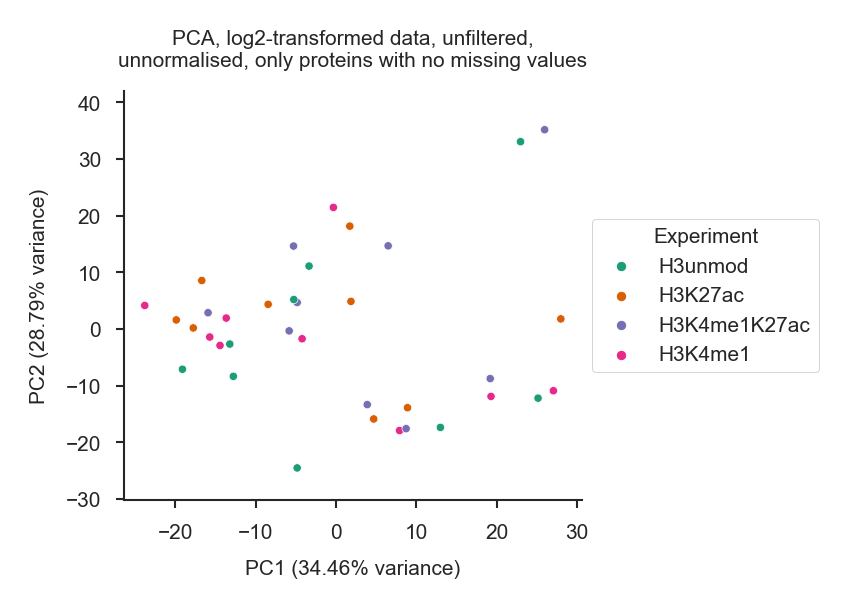

In [18]:
from adjustText import adjust_text
from sklearn.decomposition import PCA

_df = data_numeric_log2

plt.figure()
pca = PCA(n_components=2)

# Note that we only look at the rows that are all not null:
projected = pca.fit_transform(_df.dropna(axis=0).T)

projected = pd.DataFrame(projected, index=_df.columns, columns=['PC1', 'PC2'])
explained_variance = pd.Series(pca.explained_variance_ratio_, index=projected.columns)

ax = plt.gca()

sns.scatterplot(x='PC1', y='PC2', hue='Experiment', data=projected.join(headers_full))

#     texts = []
#     for ix, row in projected.iterrows():
#         texts.append(ax.text(row['PC1'], row['PC2'], ix, ha='center', va='center'))

xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Increasing ylim helps place the H3K4me3 labels
ax.set_ylim(ylim[0]*1.1, ylim[1] * 1.1)

#     adjust_text(texts, projected['PC1'].values, projected['PC2'].values, arrowprops=dict(arrowstyle='-'))

ax.set_xlabel("PC1 ({:.2%} variance)".format(explained_variance.loc['PC1']))
ax.set_ylabel("PC2 ({:.2%} variance)".format(explained_variance.loc['PC2']))
ax.grid(False)
ax.set_title("PCA, log2-transformed data, unfiltered,\nunnormalised, only proteins with no missing values")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Experiment')


_fname = OUTPUT_DIRECTORY / f'01-EDA-log2-transformed-unnormalised-unfiltered-PCA.{DATASET}.pdf'
_caption = f"""
Principal Component embedding of log2-transformed, unnormalised, and unfiltered dataset ({DATASET}), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.

"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)


Principal Component embedding of log2-transformed, unnormalised, and unfiltered dataset (long-linkers-enh), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.




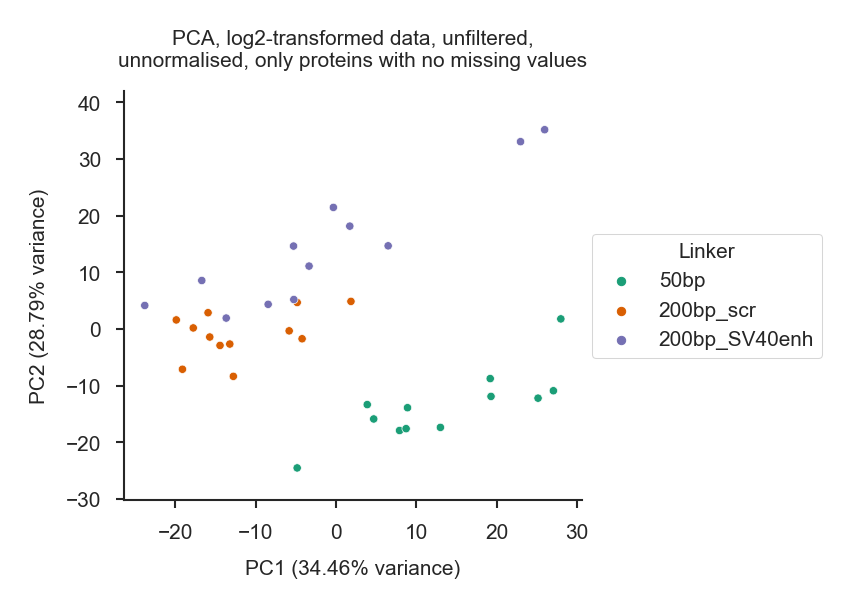

In [19]:
from adjustText import adjust_text
from sklearn.decomposition import PCA

_df = data_numeric_log2

plt.figure()
pca = PCA(n_components=2)

# Note that we only look at the rows that are all not null:
projected = pca.fit_transform(_df.dropna(axis=0).T)

projected = pd.DataFrame(projected, index=_df.columns, columns=['PC1', 'PC2'])
explained_variance = pd.Series(pca.explained_variance_ratio_, index=projected.columns)

ax = plt.gca()

sns.scatterplot(x='PC1', y='PC2', hue='Linker', data=projected.join(headers_full))

#     texts = []
#     for ix, row in projected.iterrows():
#         texts.append(ax.text(row['PC1'], row['PC2'], ix, ha='center', va='center'))

xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Increasing ylim helps place the H3K4me3 labels
ax.set_ylim(ylim[0]*1.1, ylim[1] * 1.1)

#     adjust_text(texts, projected['PC1'].values, projected['PC2'].values, arrowprops=dict(arrowstyle='-'))

ax.set_xlabel("PC1 ({:.2%} variance)".format(explained_variance.loc['PC1']))
ax.set_ylabel("PC2 ({:.2%} variance)".format(explained_variance.loc['PC2']))
ax.grid(False)
ax.set_title("PCA, log2-transformed data, unfiltered,\nunnormalised, only proteins with no missing values")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Linker')


_fname = OUTPUT_DIRECTORY / f'01-EDA-log2-transformed-unnormalised-unfiltered-PCA.Linker.{DATASET}.pdf'
_caption = f"""
Principal Component embedding of log2-transformed, unnormalised, and unfiltered dataset ({DATASET}), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.

"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

In [20]:
# Clean up memory a bit
plt.close('all')

## Normalisation

For normalisation of these intensities, it makes most sense to normalise to the histone amounts.
The histone proteins that are present in our data:

In [21]:
_df = data_metadata.reset_index()
_df = _df[['Label', 'Description']].drop_duplicates().set_index('Label')

_mask = _df['Description'].str.lower().str.contains('histone')
_mask &= ~(_df['Description'].str.lower().str.contains('transferase'))
_mask &= ~(_df['Description'].str.lower().str.contains('acetylase'))
_mask &= ~(_df['Description'].str.lower().str.contains('methylase'))
_mask &= ~(_df['Description'].str.lower().str.contains('methylation'))
_mask &= ~(_df['Description'].str.lower().str.contains('histone-binding protein'))
_mask &= ~(_df['Description'].str.lower().str.contains('non-histone'))
histone_like_proteins = _df[_mask].sort_index()
histone_like_proteins

,Description
Label,
H1-0,Histone H1.0 OS=Homo sapiens OX=9606 GN=H1-0 P...
H1-10,Histone H1.10 OS=Homo sapiens OX=9606 GN=H1-10...
H1-2,Histone H1.2 OS=Homo sapiens OX=9606 GN=H1-2 P...
H1-4,Histone H1.4 OS=Homo sapiens OX=9606 GN=H1-4 P...
H2AC7,Histone H2A type 1-D OS=Homo sapiens OX=9606 G...
H2AZ2,Histone H2A.V OS=Homo sapiens OX=9606 GN=H2AZ2...
H2BC12,Histone H2B type 1-K OS=Homo sapiens OX=9606 G...
H3-7,Histone H3-7 OS=Homo sapiens OX=9606 GN=H3-7 P...
H4C1,Histone H4 OS=Homo sapiens OX=9606 GN=H4C1 PE=...


In [22]:
HISTONES = histone_like_proteins.index

Out of which the most abundant ones are:

In [23]:
data_numeric_log2.reindex(histone_like_proteins.index).mean(axis=1).sort_values(ascending=False)

Label
H4C1         33.903880
H2BC12       31.598052
H1-10        28.162404
H1-0         27.463089
H2AZ2        26.584770
H1-2         25.803494
H3-7         25.639436
H1-4         25.417422
MACROH2A1    23.296816
H2AC7        21.074885
dtype: float64

We take a small set of core histone proteins to use for normalisation

In [24]:
# By dataset

NORMALISATION_PROTEINS_BY_DATASET = {
    'short-linkers': ['HIST1H4A', 'HIST2H2BF'],
    'long-linkers-enh': ['H4C1', 'H2BC12'],
    'long-linkers-prom': ['H4C1', 'H2BC12']
}

NORMALISATION_PROTEINS = NORMALISATION_PROTEINS_BY_DATASET[DATASET]

In [25]:
data_numeric_log2_histones = data_numeric_log2.loc[histone_like_proteins.index]

In [26]:
data_numeric_log2_histones

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
H1-0,26.327120,27.241950,28.054966,27.907870,27.253676,27.838497,27.500871,27.814211,27.896091,27.275118,...,27.633235,28.038536,27.239741,27.750178,27.503471,27.882528,27.836876,27.108437,27.850664,27.862688
H1-10,27.986020,28.473340,28.364882,28.331709,28.270382,28.164438,28.018230,28.466827,28.187125,28.376353,...,27.963687,28.489188,28.294494,28.235409,27.927468,28.544052,28.334065,27.998604,28.111694,28.643296
H1-2,24.631059,25.578073,26.502283,26.106842,25.607103,26.246672,25.825901,26.083085,26.260288,25.679637,...,25.785147,26.323200,25.601603,26.053414,25.930917,26.053499,26.103640,25.535997,25.672432,26.166570
H1-4,24.074209,25.032254,26.138851,25.799858,25.205082,25.882479,25.486889,25.610925,25.901991,25.239658,...,25.317977,25.885045,25.205080,25.618424,25.545694,25.638873,25.746035,25.152364,25.314811,25.858376
H2AC7,20.083163,20.359394,NaN,19.108727,21.358136,21.243733,20.746473,22.212594,21.587419,21.028764,...,19.298629,NaN,21.395745,20.951497,21.549640,21.646623,21.297946,20.853654,21.977658,21.656338
H2AZ2,26.102871,26.607294,26.991580,26.969655,27.023769,27.289766,27.211323,26.893702,26.418260,26.186389,...,26.247560,26.594585,26.551947,26.918533,26.692569,26.504512,26.427626,25.629001,26.384393,26.650092
H2BC12,30.769996,30.856451,32.395770,31.971752,31.915165,32.451251,32.280405,32.596463,31.877451,31.144156,...,30.734240,31.120485,30.840620,31.610412,31.150408,31.759847,31.496592,30.380054,31.491679,31.887891
H3-7,25.200166,25.810976,26.047305,25.650836,25.806189,25.994707,25.538226,26.076380,25.524023,25.929134,...,25.283357,25.443958,25.779888,25.757211,25.001634,25.845361,25.510815,25.828677,25.528511,25.707862
H4C1,33.036830,33.599756,34.354526,34.276221,33.696585,34.244138,34.118051,34.328402,34.231291,33.669322,...,33.719010,34.193672,33.475728,33.977864,33.788919,34.228588,34.105497,33.179232,34.033112,34.348553



Boxplot showing the unnormalised log2 data for histone proteins only (long-linkers-enh).
The proteins are plotted on the Y axis, and the experiments on the X.

Proteins selected as normalisation factors are highlighted in red.



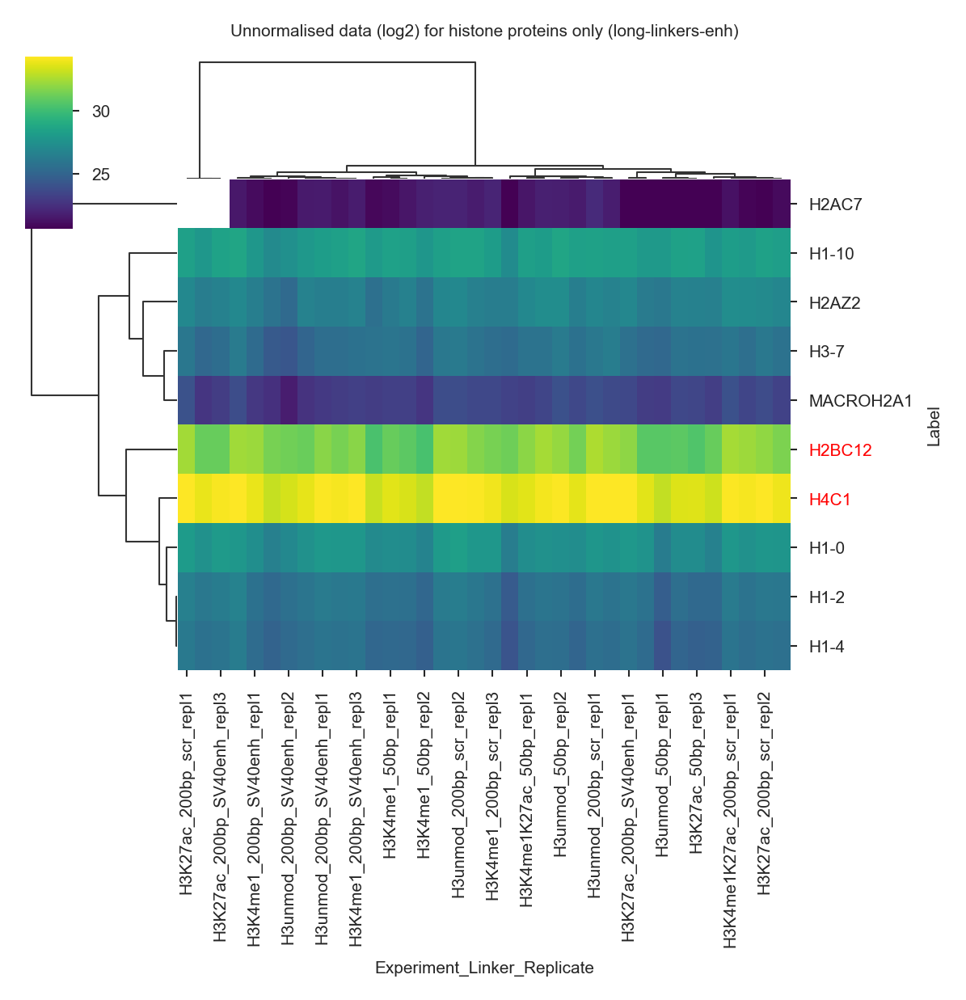

In [27]:
_cmap = sns.clustermap(
    data_numeric_log2_histones.fillna(0),
    mask=data_numeric_log2_histones.isnull(),
    cmap='viridis', robust=True, 
    figsize=(20*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH),
    metric='correlation',
    method='complete',
)
_cmap.ax_col_dendrogram.set_title(f"Unnormalised data (log2) for histone proteins only ({DATASET})")

for tick in _cmap.ax_heatmap.get_yticklabels():
    tick_text = tick.get_text()
    if tick_text in NORMALISATION_PROTEINS:
        tick.set_color('red')

_fname = OUTPUT_DIRECTORY / f'02-normalisation-histones-heatmap-unnormalised.{DATASET}.pdf'
_caption = f"""
Boxplot showing the unnormalised log2 data for histone proteins only ({DATASET}).
The proteins are plotted on the Y axis, and the experiments on the X.

Proteins selected as normalisation factors are highlighted in red.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

Let's Mark NORMALISATION_PROTEINS as "Used for normalisation"

In [28]:
comments_norm = pd.Series(None, dtype=object, index=data_numeric_log2.index)
for norm_prot in NORMALISATION_PROTEINS:
    try:
        comments_norm.loc[norm_prot] = 'Used for normalisation'
    except KeyError:
        continue

To normalise we will take a median of M-offsets from the data, the M-offsets can obtained by subtracting the row-wise mean from the data:

In [29]:
data_numeric_log2.sub(data_numeric_log2.mean(axis=1), axis=0)

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,-0.064349,0.210248,0.352474,0.499076,0.419530,0.340338,0.068252,0.480974,-0.449605,0.079358,...,-0.372947,-0.219245,-0.143493,-0.037886,-0.711317,0.193940,-0.078668,-0.611117,0.004862,0.166248
SPTAN1,-0.189311,0.227628,0.369957,0.366028,0.364767,0.239588,-0.073992,0.317067,-0.210516,0.149197,...,-0.323510,-0.076871,-0.016504,-0.016639,-0.647375,0.246376,-0.024872,-0.222030,0.000827,0.189486
PRKDC,-0.108994,0.048735,0.424342,0.410393,0.107619,0.181034,-0.085630,0.154407,0.108184,0.455023,...,0.095578,-0.065168,0.277376,-0.044248,-0.411453,0.370593,-0.026684,-0.359959,0.103612,0.120697
ACTB,-0.034187,0.212756,0.290433,0.162106,0.233751,0.141339,-0.007389,0.271080,-0.193751,0.314820,...,-0.297918,0.049593,0.141771,0.074862,-0.519423,0.279914,0.016277,-0.016364,-0.219758,0.214317
SPTBN1,-0.409512,0.376118,0.432463,0.318723,0.308689,0.487617,0.323807,-0.316646,-0.755087,-0.163738,...,0.054076,0.414489,0.356591,1.592204,-0.035087,-0.038201,-0.301882,-0.657708,2.303592,-0.230992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NFKBIL1,-0.066301,0.236477,0.500034,-0.235976,0.638845,0.404329,-0.101780,0.593946,-0.215788,0.857610,...,-0.175125,-0.193853,0.669559,0.154833,NaN,0.272522,-0.143663,0.930629,-0.269292,0.393245
NOS1AP,-0.517410,0.090412,0.609571,-0.537737,-0.400048,-0.015526,NaN,0.839146,-1.004222,0.172861,...,-0.318258,-0.067149,-0.838370,1.172662,-0.334476,0.818105,-0.169330,-0.660338,-0.224810,-0.125060
MBOAT7,0.849066,-0.172042,-0.438595,-0.787778,-0.826995,-0.515799,NaN,NaN,NaN,1.920859,...,NaN,NaN,-0.807299,NaN,NaN,1.548202,NaN,0.456102,NaN,NaN


## Normalisation factors calculation

We will now compute the MA statistics from the unnormalised data.

MA statistics are simply row-wise averages of the data (avg column, the A part) And the log2 offsets from this average (log2_diff column, the M part)

In [30]:
data_numeric_log2_row_averages = data_numeric_log2.mean(axis=1)
data_numeric_log2_row_averages.name = 'avg'
    
data_numeric_log2_row_averages

Label
MYH9       30.971037
SPTAN1     29.612476
PRKDC      29.530347
ACTB       34.028632
SPTBN1     29.881017
             ...    
NFKBIL1    19.918030
NOS1AP     20.524763
MBOAT7     20.244433
KANK2            NaN
ASPM       19.428757
Name: avg, Length: 1630, dtype: float64

In [31]:
data_numeric_log2.head()

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,30.906687,31.181285,31.323510,31.470113,31.390567,31.311375,31.039288,31.452011,30.521432,31.050395,...,30.598090,30.751792,30.827543,30.933151,30.259720,31.164977,30.892368,30.359920,30.975899,31.137285
SPTAN1,29.423165,29.840104,29.982433,29.978504,29.977243,29.852065,29.538484,29.929543,29.401960,29.761673,...,29.288967,29.535605,29.595973,29.595837,28.965101,29.858852,29.587604,29.390446,29.613304,29.801962
PRKDC,29.421352,29.579082,29.954689,29.940740,29.637966,29.711381,29.444717,29.684754,29.638531,29.985370,...,29.625924,29.465179,29.807722,29.486098,29.118894,29.900940,29.503663,29.170388,29.633959,29.651044
ACTB,33.994446,34.241389,34.319065,34.190738,34.262383,34.169971,34.021243,34.299712,33.834881,34.343453,...,33.730714,34.078226,34.170403,34.103494,33.509210,34.308547,34.044910,34.012269,33.808874,34.242949
SPTBN1,29.471504,30.257135,30.313480,30.199740,30.189706,30.368634,30.204824,29.564371,29.125930,29.717278,...,29.935093,30.295506,30.237608,31.473221,29.845930,29.842816,29.579135,29.223308,32.184608,29.650024


In [32]:
data_numeric_log2_diffs = data_numeric_log2.sub(data_numeric_log2_row_averages, axis=0)
data_numeric_log2_diffs

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,-0.064349,0.210248,0.352474,0.499076,0.419530,0.340338,0.068252,0.480974,-0.449605,0.079358,...,-0.372947,-0.219245,-0.143493,-0.037886,-0.711317,0.193940,-0.078668,-0.611117,0.004862,0.166248
SPTAN1,-0.189311,0.227628,0.369957,0.366028,0.364767,0.239588,-0.073992,0.317067,-0.210516,0.149197,...,-0.323510,-0.076871,-0.016504,-0.016639,-0.647375,0.246376,-0.024872,-0.222030,0.000827,0.189486
PRKDC,-0.108994,0.048735,0.424342,0.410393,0.107619,0.181034,-0.085630,0.154407,0.108184,0.455023,...,0.095578,-0.065168,0.277376,-0.044248,-0.411453,0.370593,-0.026684,-0.359959,0.103612,0.120697
ACTB,-0.034187,0.212756,0.290433,0.162106,0.233751,0.141339,-0.007389,0.271080,-0.193751,0.314820,...,-0.297918,0.049593,0.141771,0.074862,-0.519423,0.279914,0.016277,-0.016364,-0.219758,0.214317
SPTBN1,-0.409512,0.376118,0.432463,0.318723,0.308689,0.487617,0.323807,-0.316646,-0.755087,-0.163738,...,0.054076,0.414489,0.356591,1.592204,-0.035087,-0.038201,-0.301882,-0.657708,2.303592,-0.230992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NFKBIL1,-0.066301,0.236477,0.500034,-0.235976,0.638845,0.404329,-0.101780,0.593946,-0.215788,0.857610,...,-0.175125,-0.193853,0.669559,0.154833,NaN,0.272522,-0.143663,0.930629,-0.269292,0.393245
NOS1AP,-0.517410,0.090412,0.609571,-0.537737,-0.400048,-0.015526,NaN,0.839146,-1.004222,0.172861,...,-0.318258,-0.067149,-0.838370,1.172662,-0.334476,0.818105,-0.169330,-0.660338,-0.224810,-0.125060
MBOAT7,0.849066,-0.172042,-0.438595,-0.787778,-0.826995,-0.515799,NaN,NaN,NaN,1.920859,...,NaN,NaN,-0.807299,NaN,NaN,1.548202,NaN,0.456102,NaN,NaN


In [33]:

data_numeric_log2_ma = data_numeric_log2_diffs.stack()
data_numeric_log2_ma.name = 'log2_diff'
data_numeric_log2_ma = data_numeric_log2_ma.reset_index().join(data_numeric_log2_row_averages, on='Label')
data_numeric_log2_ma

,Label,Experiment_Linker_Replicate,log2_diff,avg
0,MYH9,H3unmod_50bp_repl1,-0.064349,30.971037
1,MYH9,H3K27ac_50bp_repl1,0.210248,30.971037
2,MYH9,H3K27ac_200bp_scr_repl1,0.352474,30.971037
3,MYH9,H3K27ac_200bp_SV40enh_repl1,0.499076,30.971037
4,MYH9,H3K4me1K27ac_50bp_repl1,0.419530,30.971037
...,...,...,...,...
56444,ASPM,H3K4me1K27ac_50bp_repl3,-0.042408,19.428757
56445,ASPM,H3unmod_200bp_scr_repl3,0.385713,19.428757
56446,ASPM,H3unmod_200bp_SV40enh_repl3,0.501389,19.428757
56447,ASPM,H3K4me1_50bp_repl3,-0.321653,19.428757


We will now compute the normalisation factors from the NORMALISATION_PROTEINS.

We take the median of the M offsets of the NORMALISATION_PROTEINS

In [34]:
# Get the normfactors from MA offsets
_ma_data_for_normalisation_proteins = data_numeric_log2_ma[
    data_numeric_log2_ma['Label'].isin(NORMALISATION_PROTEINS)
]

normalisation_factors = _ma_data_for_normalisation_proteins.groupby('Experiment_Linker_Replicate')['log2_diff'].median()


In [35]:
normalisation_factors

Experiment_Linker_Replicate
H3K27ac_200bp_SV40enh_repl1         0.373020
H3K27ac_200bp_SV40enh_repl2        -0.260001
H3K27ac_200bp_SV40enh_repl3        -0.093887
H3K27ac_200bp_scr_repl1             0.624182
H3K27ac_200bp_scr_repl2             0.451445
H3K27ac_200bp_scr_repl3            -0.524341
H3K27ac_50bp_repl1                 -0.522862
H3K27ac_50bp_repl2                 -0.368080
H3K27ac_50bp_repl3                 -0.669526
H3K4me1K27ac_200bp_SV40enh_repl1    0.448262
H3K4me1K27ac_200bp_SV40enh_repl2   -0.442266
H3K4me1K27ac_200bp_SV40enh_repl3   -0.281302
H3K4me1K27ac_200bp_scr_repl1        0.596729
H3K4me1K27ac_200bp_scr_repl2        0.496801
H3K4me1K27ac_200bp_scr_repl3        0.043172
H3K4me1K27ac_50bp_repl1             0.054909
H3K4me1K27ac_50bp_repl2            -0.558786
H3K4me1K27ac_50bp_repl3            -0.592792
H3K4me1_200bp_SV40enh_repl1         0.306604
H3K4me1_200bp_SV40enh_repl2         0.674117
H3K4me1_200bp_SV40enh_repl3         0.367256
H3K4me1_200bp_scr_repl1    

## Plots (before)

## MA

To illustrate the normalisation behaviour it is helpful to make some MA plots:

In [36]:
# Clean up memory a bit
plt.close('all')

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


(10, 4)


(10, 4)


(9, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(9, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(9, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)



MA-like plot for log2-transformed, unnormalised and unfiltered data (long-linkers-enh).

X axis plots mean(log2_intensity) across data rows (proteins). X axis is the same in every plot.
Y axis plots log2_intensity - mean(log2_intensity) offsets for individual samples

Histone proteins are highlighted in green.
Red line indicates the normalisation factor estimate.



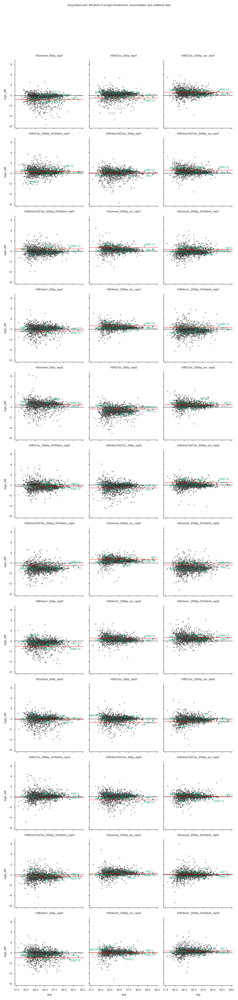

In [37]:
from adjustText import adjust_text
def annotate_histones(x, y, *, color=None, data=None):
    data_histones = data[data['Label'].isin(HISTONES)]
    ax = plt.gca()
    
    print(data_histones.shape)
    ax.scatter(data_histones[x], data_histones[y], color=color)
    
    texts = []
    for __, row in data_histones.iterrows():
        texts.append(ax.text(row[x], row[y], row['Label'], color=color))
        
    adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)
    
def add_horizontal_line(*args, color=None, data=None):
    ax = plt.gca()
    ax.axhline(0, linestyle='-',color='black', zorder=1)

    
fgrid = sns.FacetGrid(col='Experiment_Linker_Replicate', col_wrap=3,
                      size=FIVE_MM_IN_INCH*10,
                      col_order=data_numeric_log2.columns, data=data_numeric_log2_ma)
fgrid.map(sns.scatterplot, 'avg', 'log2_diff', alpha=.4, color='black', rasterized=True)
fgrid.map_dataframe(annotate_histones, 'avg', 'log2_diff')
fgrid.map_dataframe(add_horizontal_line)
fgrid.set_titles('{col_name}')

for experiment, ax in fgrid.axes_dict.items():
    ax.axhline(normalisation_factors.loc[experiment], color='r', linestyle='-')
    ax.grid(False)

plt.suptitle(f"{DATASET}: MA plots of of log2-transformed, unnormalised, and unfiltered data", y=1.05)

_fname = OUTPUT_DIRECTORY / f'02-normalisation-log2-transformed-unnormalised-unfiltered-ma-plot.{DATASET}.pdf'
_caption = f"""
MA-like plot for log2-transformed, unnormalised and unfiltered data ({DATASET}).

X axis plots mean(log2_intensity) across data rows (proteins). X axis is the same in every plot.
Y axis plots log2_intensity - mean(log2_intensity) offsets for individual samples

Histone proteins are highlighted in green.
Red line indicates the normalisation factor estimate.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

# Boxplot

Alternatively, we can plot all of this in a boxplot format:


Boxplot showing the distribution of signal intensities for non-histone proteins (green), and the histone proteins (orange), prior to normalisation (long-linkers-enh).
The intensity is plotted on the X axis, while the samples are facetted on the Y. The outliers ("fliers") are hidden.

Black line shows the estimated normalisation offsets centred around the mean of normalisation proteins.



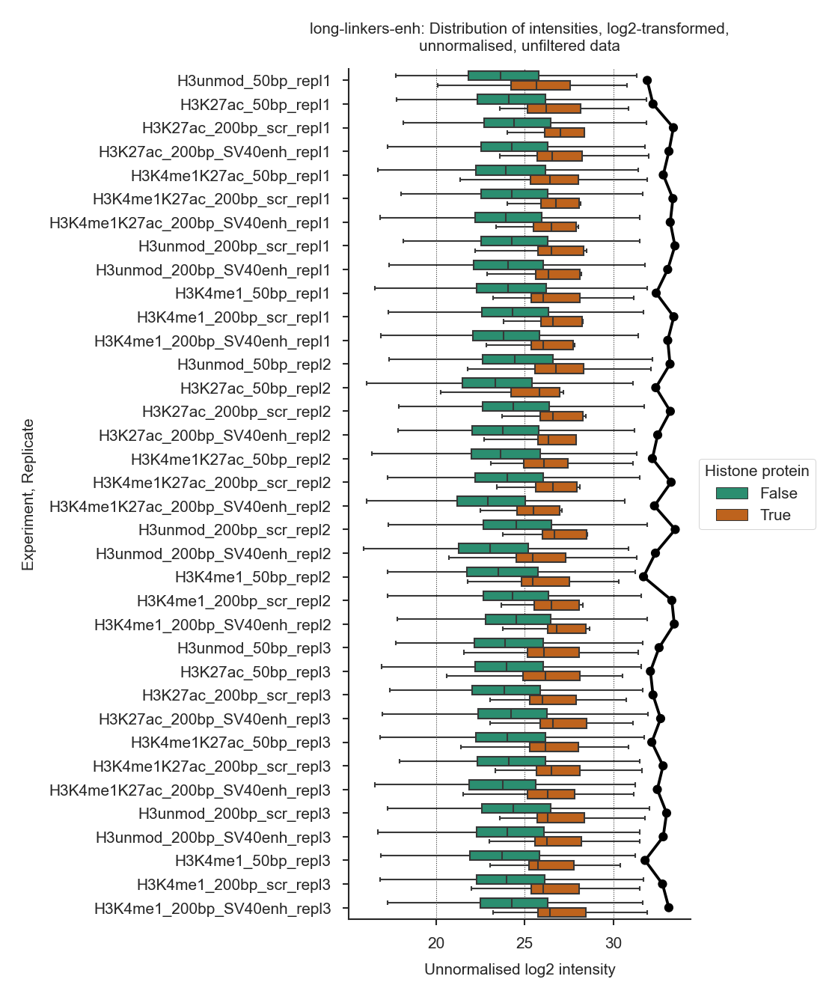

In [38]:

_df = data_numeric_log2.stack(list(data_numeric_log2.columns.names)).copy()
_df.name = 'log2_intensity_unnormalised'
_df = _df.reset_index()

_df['is_histone'] = False
_df.loc[_df['Label'].isin(HISTONES), 'is_histone'] = True

_df_cov = pd.DataFrame(
    # The + below recentres the normalisation factors around the mean of normalisation proteins
    {'normalisation_factors': normalisation_factors + data_numeric_log2.reindex(NORMALISATION_PROTEINS).mean(axis=1).mean()}, 
)

fig = plt.figure(figsize=(10*FIVE_MM_IN_INCH, 25*FIVE_MM_IN_INCH))
ax = plt.gca()

sns.pointplot(
    y='Experiment_Linker_Replicate', x='normalisation_factors', 
    data=_df_cov.reset_index(),
    order=data_numeric_log2.columns,
    marker='.',
    color='black',
    label="Estimated covariates",
)

sns.boxplot(
    y='Experiment_Linker_Replicate', x='log2_intensity_unnormalised', 
    data=_df, hue='is_histone', showfliers=False,
    order=data_numeric_log2.columns,
)


ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Histone protein")
ax.set_xlabel("Unnormalised log2 intensity")
ax.set_ylabel("Experiment, Replicate")
ax.set_title(f"{DATASET}: Distribution of intensities, log2-transformed,\nunnormalised, unfiltered data")

_fname = OUTPUT_DIRECTORY / f'02-normalisation-boxplot.{DATASET}.pdf'
_caption = f"""
Boxplot showing the distribution of signal intensities for non-histone proteins (green), and the histone proteins (orange), prior to normalisation ({DATASET}).
The intensity is plotted on the X axis, while the samples are facetted on the Y. The outliers ("fliers") are hidden.

Black line shows the estimated normalisation offsets centred around the mean of normalisation proteins.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

## The bit where normalisation is performed

To perform the normalisation we simply subtract the normalisation factors from the dataset.

Note that as we are using (zero-centred) offsets for the normalisation, the intuitive meaning of the normalised intensities stays more or less the same.

In [39]:
data_numeric_log2_normalised = data_numeric_log2 - normalisation_factors
# In the row below we need to make sure column order stays the same
data_numeric_log2_normalised = data_numeric_log2_normalised[data_numeric_log2.columns]

Sanity check:

In [40]:
from numpy.testing import assert_array_equal

# The minus operator above works columnwise, we can confirm this
for col in data_numeric_log2_normalised:
    assert_array_equal(data_numeric_log2_normalised[col], data_numeric_log2[col] - normalisation_factors.loc[col])

    

The normalisation has the effect of making the normalisation protein M-offsets constant (though not necessarily zero, as median is used, not mean):

In [41]:
data_numeric_log2_normalised.sub(data_numeric_log2_normalised.mean(axis=1), axis=0).reindex(NORMALISATION_PROTEINS).dropna(how='all')

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
H4C1,-0.019497,0.218738,-0.173536,-0.00068,-0.262204,-0.25647,-0.234091,-0.286944,0.024007,0.109669,...,0.339471,0.38368,0.16464,0.030812,0.166342,0.081457,0.151538,0.246675,0.117802,0.077417
H2BC12,0.019497,-0.218738,0.173536,0.00068,0.262204,0.25647,0.234091,0.286944,-0.024007,-0.109669,...,-0.339471,-0.38368,-0.16464,-0.030812,-0.166342,-0.081457,-0.151538,-0.246675,-0.117802,-0.077417


In [42]:
data_numeric_log2_normalised.sub(data_numeric_log2_normalised.mean(axis=1), axis=0).reindex(NORMALISATION_PROTEINS).dropna(how='all').median()

Experiment_Linker_Replicate
H3unmod_50bp_repl1                  1.776357e-15
H3K27ac_50bp_repl1                  0.000000e+00
H3K27ac_200bp_scr_repl1            -1.776357e-15
H3K27ac_200bp_SV40enh_repl1         1.776357e-15
H3K4me1K27ac_50bp_repl1             0.000000e+00
H3K4me1K27ac_200bp_scr_repl1        1.776357e-15
H3K4me1K27ac_200bp_SV40enh_repl1    0.000000e+00
H3unmod_200bp_scr_repl1            -1.776357e-15
H3unmod_200bp_SV40enh_repl1         0.000000e+00
H3K4me1_50bp_repl1                  0.000000e+00
H3K4me1_200bp_scr_repl1             0.000000e+00
H3K4me1_200bp_SV40enh_repl1         0.000000e+00
H3unmod_50bp_repl2                  0.000000e+00
H3K27ac_50bp_repl2                 -1.776357e-15
H3K27ac_200bp_scr_repl2             1.776357e-15
H3K27ac_200bp_SV40enh_repl2        -1.776357e-15
H3K4me1K27ac_50bp_repl2             0.000000e+00
H3K4me1K27ac_200bp_scr_repl2       -1.776357e-15
H3K4me1K27ac_200bp_SV40enh_repl2    0.000000e+00
H3unmod_200bp_scr_repl2             0.000

## Plots (After)


Boxplot showing the distribution of signal intensities for non-histone proteins (green), and the histone proteins (orange), after  normalisation by the mean of histone protein intensities (long-linkers-enh).
The intensity is plotted on the X axis, while the samples are facetted on the Y. The outliers ("fliers") are hidden.



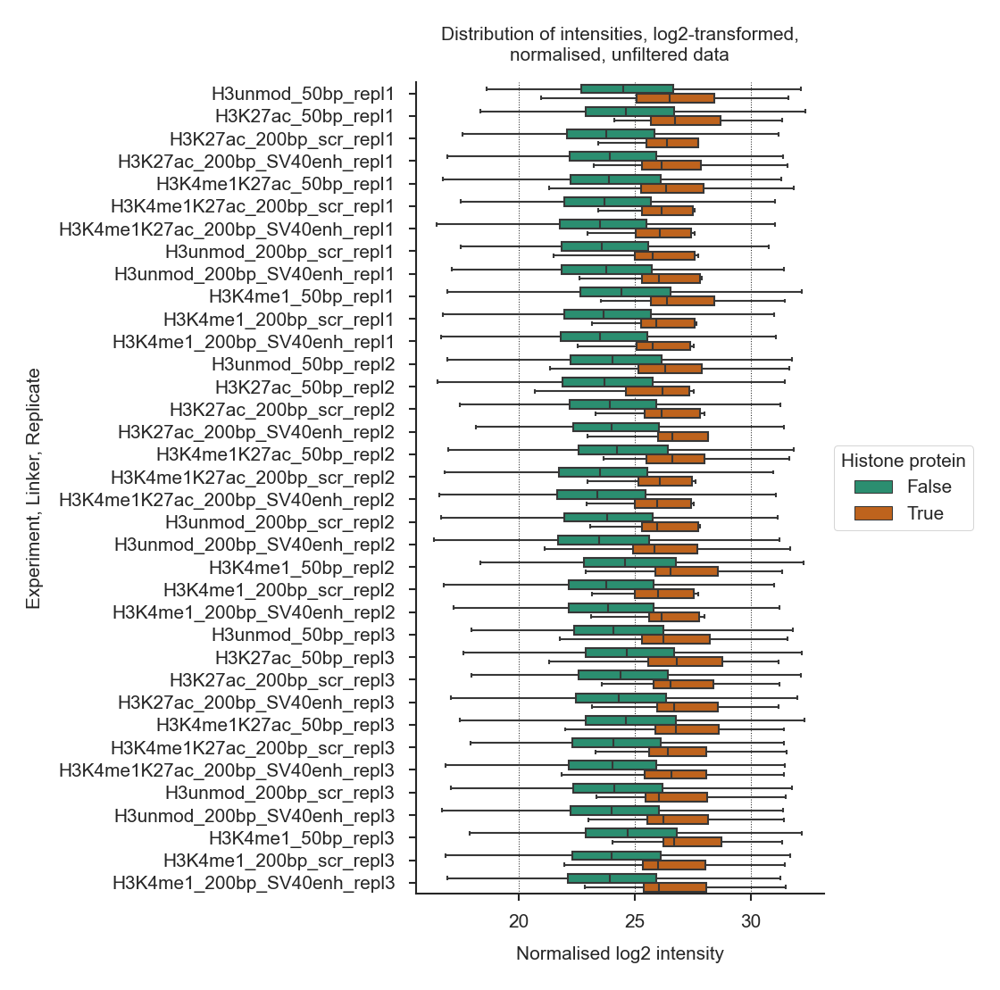

In [43]:

_df = data_numeric_log2_normalised.stack(list(data_numeric_log2.columns.names)).copy()
_df.name = 'log2_intensity_normalised'
_df = _df.reset_index()

_df['is_histone'] = False
_df.loc[_df['Label'].isin(HISTONES), 'is_histone'] = True


fig = plt.figure(figsize=(10*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH))
ax = plt.gca()

sns.boxplot(
    y='Experiment_Linker_Replicate', x='log2_intensity_normalised', 
    data=_df, hue='is_histone', showfliers=False,
    order=data_numeric_log2.columns,
)


ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Histone protein")
ax.set_xlabel("Normalised log2 intensity")
ax.set_ylabel("Experiment, Linker, Replicate")
ax.set_title("Distribution of intensities, log2-transformed,\nnormalised, unfiltered data")

_fname = OUTPUT_DIRECTORY / f'02-normalisation-boxplot-post-normalisation.{DATASET}.pdf'
_caption = f"""
Boxplot showing the distribution of signal intensities for non-histone proteins (green), and the histone proteins (orange), after  normalisation by the mean of histone protein intensities ({DATASET}).
The intensity is plotted on the X axis, while the samples are facetted on the Y. The outliers ("fliers") are hidden.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

#### Histone heatmap
Let's replot histone heatmap after normalisation


Boxplot showing the unnormalised log2 data for histone proteins only (long-linkers-enh).
The proteins are plotted on the Y axis, and the experiments on the X.

Proteins selected as normalisation factors are highlighted in red.



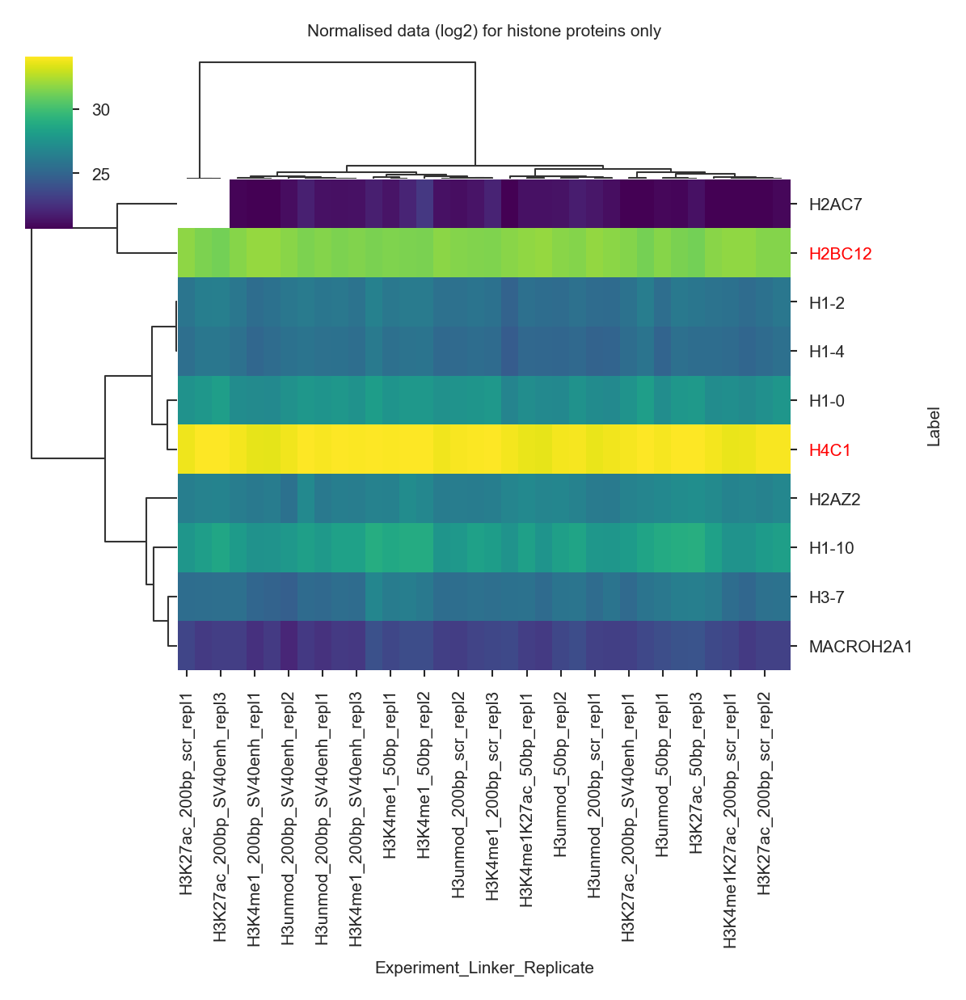

In [44]:
_mtrix = data_numeric_log2_normalised.reindex(HISTONES).dropna(how='all')
_cmap = sns.clustermap(
    _mtrix.fillna(0),
    mask=_mtrix.isnull(),
    cmap='viridis', robust=True, 
    figsize=(20*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH),
    metric='correlation',
    method='complete',
)
_cmap.ax_col_dendrogram.set_title("Normalised data (log2) for histone proteins only")

for tick in _cmap.ax_heatmap.get_yticklabels():
    tick_text = tick.get_text()
    if tick_text in NORMALISATION_PROTEINS:
        tick.set_color('red')

_fname = OUTPUT_DIRECTORY / f'02-normalisation-histones-heatmap-post-normalisation.{DATASET}.pdf'
_caption = f"""
Boxplot showing the unnormalised log2 data for histone proteins only ({DATASET}).
The proteins are plotted on the Y axis, and the experiments on the X.

Proteins selected as normalisation factors are highlighted in red.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

#### MA 

In [45]:
data_numeric_log2_normalised_row_averages = data_numeric_log2_normalised.mean(axis=1)
data_numeric_log2_normalised_row_averages.name = 'avg'
  

In [46]:
data_numeric_log2_normalised_row_averages

Label
MYH9       30.971037
SPTAN1     29.612476
PRKDC      29.530347
ACTB       34.028632
SPTBN1     29.881017
             ...    
NFKBIL1    19.896749
NOS1AP     20.524939
MBOAT7     20.237522
KANK2            NaN
ASPM       19.355079
Name: avg, Length: 1630, dtype: float64

In [47]:
data_numeric_log2_normalised_diffs = data_numeric_log2_normalised.sub(data_numeric_log2_normalised_row_averages, axis=0)


In [48]:

data_numeric_log2_normalised_ma = data_numeric_log2_normalised_diffs.stack()
data_numeric_log2_normalised_ma.name = 'log2_diff'
data_numeric_log2_normalised_ma = data_numeric_log2_normalised_ma.reset_index().join(data_numeric_log2_normalised_row_averages, on='Label')


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


(10, 4)


(10, 4)


(9, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(9, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(9, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)


(10, 4)



MA-like plot for log2-transformed, normalised and unfiltered data (long-linkers-enh)

X axis plots mean(log2_intensity) across data rows (proteins). X axis is the same in every plot.
Y axis plots log2_intensity - mean(log2_intensity) offsets for individual samples

Histone proteins are highlighted in green.

Red line indicates x=0 line around which the data is centered now.



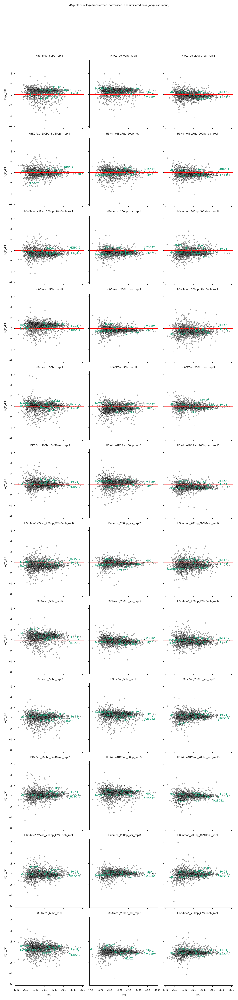

In [49]:
fgrid = sns.FacetGrid(col='Experiment_Linker_Replicate', col_wrap=3,
                      size=FIVE_MM_IN_INCH*10,
                      col_order=data_numeric_log2.columns, data=data_numeric_log2_normalised_ma)
fgrid.map(sns.scatterplot, 'avg', 'log2_diff', alpha=.4, color='black')
fgrid.map_dataframe(annotate_histones, 'avg', 'log2_diff')
# fgrid.map_dataframe(add_horizontal_line)
fgrid.set_titles('{col_name}')
for experiment, ax in fgrid.axes_dict.items():
    ax.axhline(0, linestyle='-', color='red', zorder=1)
    ax.grid(False)

plt.suptitle(f"MA plots of of log2-transformed, normalised, and unfiltered data ({DATASET})", y=1.05)

_fname = OUTPUT_DIRECTORY / f'02-normalisation-log2-transformed-normalised-unfiltered-ma-plot.{DATASET}.pdf'
_caption = f"""
MA-like plot for log2-transformed, normalised and unfiltered data ({DATASET})

X axis plots mean(log2_intensity) across data rows (proteins). X axis is the same in every plot.
Y axis plots log2_intensity - mean(log2_intensity) offsets for individual samples

Histone proteins are highlighted in green.

Red line indicates x=0 line around which the data is centered now.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

#### Correlation matrix


A Pearson correlation matrix showing the coerrelation coefficient estimate,
for the datasets, after normalisation (long-linkers-enh). 



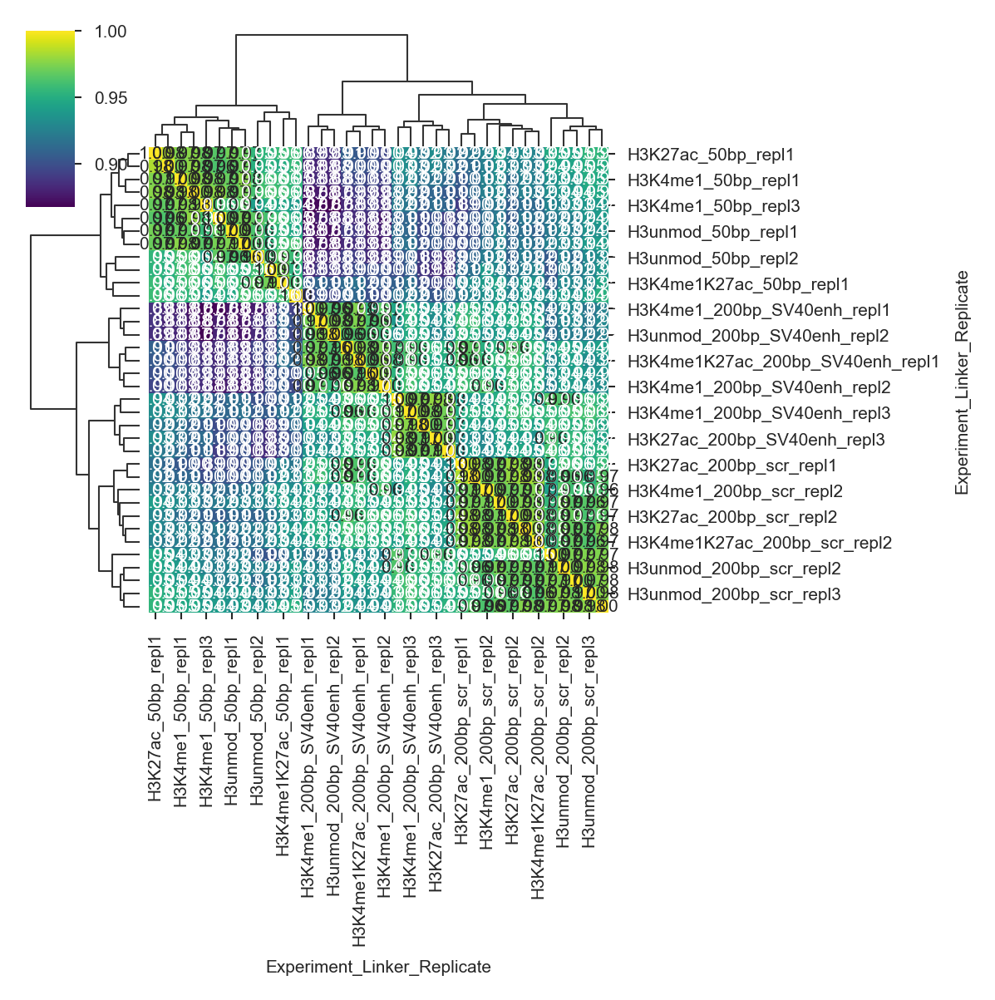

In [50]:
sns.clustermap(data_numeric_log2_normalised.corr(), 
           cmap='viridis', 
           annot=True, fmt='.2f',
           figsize=(FIVE_MM_IN_INCH*20, FIVE_MM_IN_INCH*20))

_fname = OUTPUT_DIRECTORY / f'02-correlation-matrix-of-normalised-data.{DATASET}.pdf'
_caption = f"""
A Pearson correlation matrix showing the coerrelation coefficient estimate,
for the datasets, after normalisation ({DATASET}). 
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

#### PCA

We can also observe how the PCA plot changes after the normalisation


Principal Component embedding of log2-transformed, normalised, and unfiltered dataset (long-linkers-enh), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.



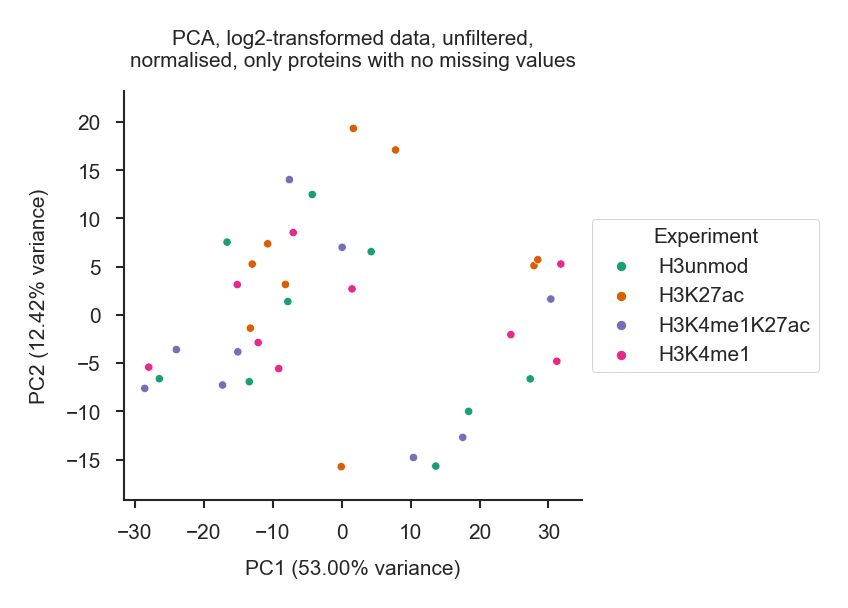

In [51]:
from adjustText import adjust_text
from sklearn.decomposition import PCA

    
plt.figure()
pca = PCA(n_components=2)

# Note that we only look at the rows that are all not null:
projected = pca.fit_transform(data_numeric_log2_normalised.dropna(axis=0).T)

projected = pd.DataFrame(projected, index=data_numeric_log2_normalised.columns, columns=['PC1', 'PC2'])
explained_variance = pd.Series(pca.explained_variance_ratio_, index=projected.columns)

ax = plt.gca()

sns.scatterplot(x='PC1', y='PC2', hue='Experiment', data=projected.join(headers_full))

texts = []
#     for ix, row in projected.iterrows():
#         texts.append(ax.text(row['PC1'], row['PC2'], ix, ha='center', va='center'))

xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Increasing ylim helps place the H3K4me3 labels
ax.set_ylim(ylim[0]*1.1, ylim[1] * 1.1)

adjust_text(texts, projected['PC1'].values, projected['PC2'].values, arrowprops=dict(arrowstyle='-'))

ax.set_xlabel("PC1 ({:.2%} variance)".format(explained_variance.loc['PC1']))
ax.set_ylabel("PC2 ({:.2%} variance)".format(explained_variance.loc['PC2']))
ax.grid(False)
ax.set_title("PCA, log2-transformed data, unfiltered,\nnormalised, only proteins with no missing values")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Experiment')


_fname = OUTPUT_DIRECTORY / f'02-normalisation-PCA-post-normalisation.{DATASET}.pdf'
_caption = f"""
Principal Component embedding of log2-transformed, normalised, and unfiltered dataset ({DATASET}), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)


Principal Component embedding of log2-transformed, normalised, and unfiltered dataset (long-linkers-enh), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.



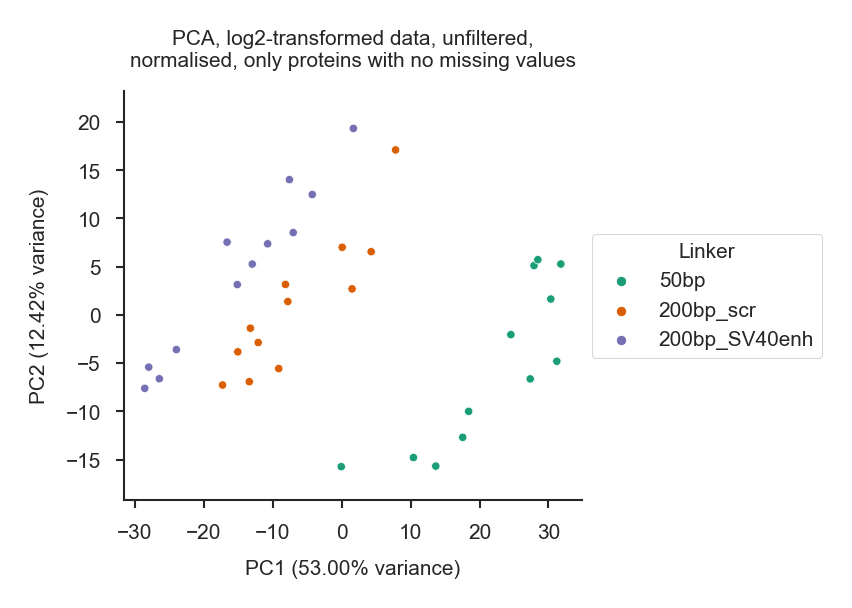

In [52]:
from adjustText import adjust_text
from sklearn.decomposition import PCA

    
plt.figure()
pca = PCA(n_components=2)

# Note that we only look at the rows that are all not null:
projected = pca.fit_transform(data_numeric_log2_normalised.dropna(axis=0).T)

projected = pd.DataFrame(projected, index=data_numeric_log2_normalised.columns, columns=['PC1', 'PC2'])
explained_variance = pd.Series(pca.explained_variance_ratio_, index=projected.columns)

ax = plt.gca()

sns.scatterplot(x='PC1', y='PC2', hue='Linker', data=projected.join(headers_full))

texts = []
#     for ix, row in projected.iterrows():
#         texts.append(ax.text(row['PC1'], row['PC2'], ix, ha='center', va='center'))

xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Increasing ylim helps place the H3K4me3 labels
ax.set_ylim(ylim[0]*1.1, ylim[1] * 1.1)

adjust_text(texts, projected['PC1'].values, projected['PC2'].values, arrowprops=dict(arrowstyle='-'))

ax.set_xlabel("PC1 ({:.2%} variance)".format(explained_variance.loc['PC1']))
ax.set_ylabel("PC2 ({:.2%} variance)".format(explained_variance.loc['PC2']))
ax.grid(False)
ax.set_title("PCA, log2-transformed data, unfiltered,\nnormalised, only proteins with no missing values")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Linker')


_fname = OUTPUT_DIRECTORY / f'02-normalisation-PCA-post-normalisation.Linker.{DATASET}.pdf'
_caption = f"""
Principal Component embedding of log2-transformed, normalised, and unfiltered dataset ({DATASET}), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

In [53]:
# Clean up memory a bit
plt.close('all')

## Reference-normalised data

For some visualisations it will also be beneficial to have data normalised to the reference experiment as well.

The reference experiment will be:

In [54]:
headers_full

,Experiment,Linker,Replicate,Experiment_Linker
Experiment_Linker_Replicate,,,,
H3unmod_50bp_repl1,H3unmod,50bp,1,H3unmod_50bp
H3K27ac_50bp_repl1,H3K27ac,50bp,1,H3K27ac_50bp
H3K27ac_200bp_scr_repl1,H3K27ac,200bp_scr,1,H3K27ac_200bp_scr
H3K27ac_200bp_SV40enh_repl1,H3K27ac,200bp_SV40enh,1,H3K27ac_200bp_SV40enh
H3K4me1K27ac_50bp_repl1,H3K4me1K27ac,50bp,1,H3K4me1K27ac_50bp
H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac,200bp_scr,1,H3K4me1K27ac_200bp_scr
H3K4me1K27ac_200bp_SV40enh_repl1,H3K4me1K27ac,200bp_SV40enh,1,H3K4me1K27ac_200bp_SV40enh
H3unmod_200bp_scr_repl1,H3unmod,200bp_scr,1,H3unmod_200bp_scr
H3unmod_200bp_SV40enh_repl1,H3unmod,200bp_SV40enh,1,H3unmod_200bp_SV40enh


In [55]:
REFS = {
    'long-linkers-prom': ('unmodH3_unmodH4', '50bp'),
    'long-linkers-enh': ('H3unmod', '50bp'),
    'short-linkers': ('H3unmod', '50bp'),
}

ref_experiment, ref_linker = REFS[DATASET]
ref_experiment_linker = '_'.join([ref_experiment, ref_linker])

In [56]:
ref_experiment_linker

'H3unmod_50bp'

Particularly we will normalise to the mean of the following experiments:

In [57]:
reference_experiment_names = list(headers_full[headers_full['Experiment_Linker'] == ref_experiment_linker].index)
reference_experiment_names

['H3unmod_50bp_repl1', 'H3unmod_50bp_repl2', 'H3unmod_50bp_repl3']

In [58]:
mean_reference_experiments = data_numeric_log2_normalised[reference_experiment_names].mean(axis=1)
mean_reference_experiments

Label
MYH9       31.423479
SPTAN1     30.012531
PRKDC      30.088277
ACTB       34.449212
SPTBN1     29.836607
             ...    
NFKBIL1    20.497694
NOS1AP     20.666097
MBOAT7     20.785042
KANK2            NaN
ASPM       18.935378
Length: 1630, dtype: float64

In [59]:
data_numeric_log2_normalised_reference_normalised = data_numeric_log2_normalised.sub(mean_reference_experiments, axis=0)

Sanity check

In [60]:
assert np.isclose(data_numeric_log2_normalised_reference_normalised.iloc[0], data_numeric_log2_normalised.iloc[0] - mean_reference_experiments.iloc[0]).all()

In [61]:
data_numeric_log2_normalised_reference_normalised

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,0.330762,0.280669,-0.724150,-0.326386,-0.087821,-0.708833,-0.832452,-0.682934,-1.205452,-0.028856,...,-0.301048,-0.577799,-0.003143,-0.533500,-0.882457,-0.501753,-0.581189,-0.092235,-0.459009,-0.653450
SPTAN1,0.258187,0.350435,-0.654280,-0.407048,-0.090197,-0.757195,-0.922309,-0.794454,-0.913976,0.093369,...,-0.199224,-0.383038,0.176233,-0.459866,-0.766128,-0.396931,-0.475006,0.349238,-0.410657,-0.577825
PRKDC,0.180628,0.013667,-0.757770,-0.520558,-0.505220,-0.973625,-1.091822,-1.114990,-0.753151,0.241320,...,0.061988,-0.529211,0.312237,-0.645351,-0.688081,-0.430589,-0.634693,0.053434,-0.465748,-0.804490
ACTB,0.392787,0.315039,-0.754329,-0.631494,-0.241738,-0.875970,-0.876231,-0.860966,-0.917736,0.238468,...,-0.194157,-0.277099,0.313983,-0.388890,-0.658700,-0.383917,-0.454381,0.534380,-0.651768,-0.573519
SPTBN1,0.482451,0.943390,-0.147309,-0.009887,0.298190,-0.064702,-0.080045,-0.983702,-1.014082,0.224899,...,0.622827,0.552787,0.993793,1.593442,0.290625,-0.237042,-0.307550,0.358025,2.336572,-0.553839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NFKBIL1,0.201589,0.179676,-0.703812,-1.188660,0.004272,-0.772063,-1.129706,-0.697184,-1.098857,0.622173,...,-0.230448,-0.679630,0.682687,-0.468002,NaN,-0.550393,-0.773405,1.322289,-0.860385,-0.553675
NOS1AP,0.188809,0.471940,-0.155945,-1.052091,-0.596291,-0.753589,NaN,-0.013654,-1.448961,0.375754,...,0.064749,-0.114596,-0.386912,0.988156,-0.194507,0.433519,-0.360742,0.169651,-0.377573,-0.633651
MBOAT7,1.156010,-0.189789,-1.603387,-1.701408,-1.422514,-1.653138,NaN,NaN,NaN,1.724476,...,NaN,NaN,-0.755116,NaN,NaN,0.764341,NaN,0.886816,NaN,NaN


# Filtering

It is counterproductive to throw all of the data into the model. 

Some datasets are clear outliers in our experimental set. We will not consider them:

In [62]:
COLUMNS_TO_DROP = {
    'short-linkers': {'H3K27me3_35bp__2'},
    'long-linkers-enh': {},
    'long-linkers-prom': {},
}

In [63]:
_blacklist = COLUMNS_TO_DROP[DATASET]

print("Dropping these columns: {}".format(_blacklist))
data_to_model_pre = data_numeric_log2_normalised[[c for c in data_numeric_log2_normalised.columns if c not in _blacklist]]
headers_pre = headers_full.loc[[ix for ix in headers_full.index if ix not in _blacklist]]
data_to_model_pre.head()

Dropping these columns: {}


Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,31.754240,31.704148,30.699328,31.097092,31.335658,30.714646,30.591026,30.740545,30.218027,31.394622,...,31.122431,30.845679,31.420335,30.889979,30.541022,30.921725,30.842290,31.331243,30.964469,30.770028
SPTAN1,30.270718,30.362967,29.358251,29.605484,29.922334,29.255336,29.090222,29.218077,29.098555,30.105900,...,29.813308,29.629493,30.188765,29.552665,29.246403,29.615601,29.537525,30.361769,29.601874,29.434706
PRKDC,30.268905,30.101944,29.330507,29.567720,29.583057,29.114652,28.996455,28.973287,29.335126,30.329597,...,30.150265,29.559066,30.400514,29.442927,29.400197,29.657688,29.453584,30.141711,29.622529,29.283787
ACTB,34.841999,34.764251,33.694883,33.817718,34.207474,33.573242,33.572981,33.588246,33.531476,34.687680,...,34.255055,34.172113,34.763195,34.060322,33.790512,34.065295,33.994831,34.983592,33.797445,33.875693
SPTBN1,30.319057,30.779997,29.689298,29.826720,30.134797,29.771905,29.756562,28.852904,28.822525,30.061505,...,30.459434,30.389393,30.830400,31.430049,30.127232,29.599565,29.529056,30.194632,32.173179,29.282768


In [64]:
headers_pre

,Experiment,Linker,Replicate,Experiment_Linker
Experiment_Linker_Replicate,,,,
H3unmod_50bp_repl1,H3unmod,50bp,1,H3unmod_50bp
H3K27ac_50bp_repl1,H3K27ac,50bp,1,H3K27ac_50bp
H3K27ac_200bp_scr_repl1,H3K27ac,200bp_scr,1,H3K27ac_200bp_scr
H3K27ac_200bp_SV40enh_repl1,H3K27ac,200bp_SV40enh,1,H3K27ac_200bp_SV40enh
H3K4me1K27ac_50bp_repl1,H3K4me1K27ac,50bp,1,H3K4me1K27ac_50bp
H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac,200bp_scr,1,H3K4me1K27ac_200bp_scr
H3K4me1K27ac_200bp_SV40enh_repl1,H3K4me1K27ac,200bp_SV40enh,1,H3K4me1K27ac_200bp_SV40enh
H3unmod_200bp_scr_repl1,H3unmod,200bp_scr,1,H3unmod_200bp_scr
H3unmod_200bp_SV40enh_repl1,H3unmod,200bp_SV40enh,1,H3unmod_200bp_SV40enh


For better performance we will also filter out some of the proteins.

Particularly, we will only keep the proteins which have at least MINIMUM_NUMBER_OF_OBSERVED_VALUES_PER_CONDITION in any of the  experimental conditions

In [65]:
MINIMUM_NUMBER_OF_OBSERVED_VALUES_PER_CONDITION

2

First count how many non-null values does each protein have:

In [66]:
# Make a long-format DF with non-null values
_df = (~data_to_model_pre.isnull()).stack()
_df.name = 'is_not_null'

# Join with headers
_df = _df.reset_index().join(headers_pre, on='Experiment_Linker_Replicate')

# Groupby label and experiment and count
number_non_null_per_condition = _df.groupby(['Label', 'Experiment_Linker'])['is_not_null'].sum().unstack(['Experiment_Linker'])


In [67]:
number_non_null_per_condition.mean()

Experiment_Linker
H3K27ac_200bp_SV40enh         2.896933
H3K27ac_200bp_scr             2.919018
H3K27ac_50bp                  2.865031
H3K4me1K27ac_200bp_SV40enh    2.896319
H3K4me1K27ac_200bp_scr        2.908589
H3K4me1K27ac_50bp             2.855828
H3K4me1_200bp_SV40enh         2.898160
H3K4me1_200bp_scr             2.915337
H3K4me1_50bp                  2.838037
H3unmod_200bp_SV40enh         2.882209
H3unmod_200bp_scr             2.906135
H3unmod_50bp                  2.849693
dtype: float64

Now check which labels match our condition:

In [68]:
sufficient_number_of_values = (number_non_null_per_condition >= MINIMUM_NUMBER_OF_OBSERVED_VALUES_PER_CONDITION).any(axis=1)


We will throw away all of the proteins which have the value set to False, in hte series above. There are this many of them:

In [69]:
sufficient_number_of_values.value_counts()

True     1621
False       9
dtype: int64

In order to stay civilised we will create a new series called "Comment" and mark the reason of filtering out in there:

In [70]:
data_comment = pd.Series(None, index=data_numeric_log2_normalised.index, name='Comment', dtype=str)
data_comment.loc[~sufficient_number_of_values] = "Insufficient number of non-null values"

In [71]:
data_comment.value_counts()

Insufficient number of non-null values    9
Name: Comment, dtype: int64

# Modelling
Now we can move to modelling

### The inputs

We will model the only the normalised data which has a sufficient number of values:

In [72]:
data_to_model = data_to_model_pre.loc[sufficient_number_of_values]
headers = headers_pre
data_to_model

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,31.754240,31.704148,30.699328,31.097092,31.335658,30.714646,30.591026,30.740545,30.218027,31.394622,...,31.122431,30.845679,31.420335,30.889979,30.541022,30.921725,30.842290,31.331243,30.964469,30.770028
SPTAN1,30.270718,30.362967,29.358251,29.605484,29.922334,29.255336,29.090222,29.218077,29.098555,30.105900,...,29.813308,29.629493,30.188765,29.552665,29.246403,29.615601,29.537525,30.361769,29.601874,29.434706
PRKDC,30.268905,30.101944,29.330507,29.567720,29.583057,29.114652,28.996455,28.973287,29.335126,30.329597,...,30.150265,29.559066,30.400514,29.442927,29.400197,29.657688,29.453584,30.141711,29.622529,29.283787
ACTB,34.841999,34.764251,33.694883,33.817718,34.207474,33.573242,33.572981,33.588246,33.531476,34.687680,...,34.255055,34.172113,34.763195,34.060322,33.790512,34.065295,33.994831,34.983592,33.797445,33.875693
SPTBN1,30.319057,30.779997,29.689298,29.826720,30.134797,29.771905,29.756562,28.852904,28.822525,30.061505,...,30.459434,30.389393,30.830400,31.430049,30.127232,29.599565,29.529056,30.194632,32.173179,29.282768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NSMCE2,21.924747,20.199191,21.343562,22.112130,21.623493,20.109014,21.974365,19.946215,21.228410,19.874120,...,20.183399,21.206090,20.183755,18.908143,20.503345,19.646043,21.060579,19.103313,22.230317,20.109641
NFKBIL1,20.699282,20.677369,19.793881,19.309033,20.501966,19.725630,19.367988,19.800509,19.398837,21.119867,...,20.267246,19.818064,21.180381,20.029691,NaN,19.947301,19.724289,21.819983,19.637308,19.944019
NOS1AP,20.854906,21.138037,20.510152,19.614006,20.069806,19.912508,NaN,20.652443,19.217136,21.041851,...,20.730846,20.551501,20.279185,21.654253,20.471590,21.099616,20.305355,20.835748,20.288524,20.032446



Distribution of missing values in the log2-transformed, normalised, and filtered data which will be used for modelling. 
The heatmap above displays all  929 proteins remaining in the data after filtering in rows, and all experiments in columns. 
Dark values indicate the presence of a value, while white space indicates the absence of one. 
The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.



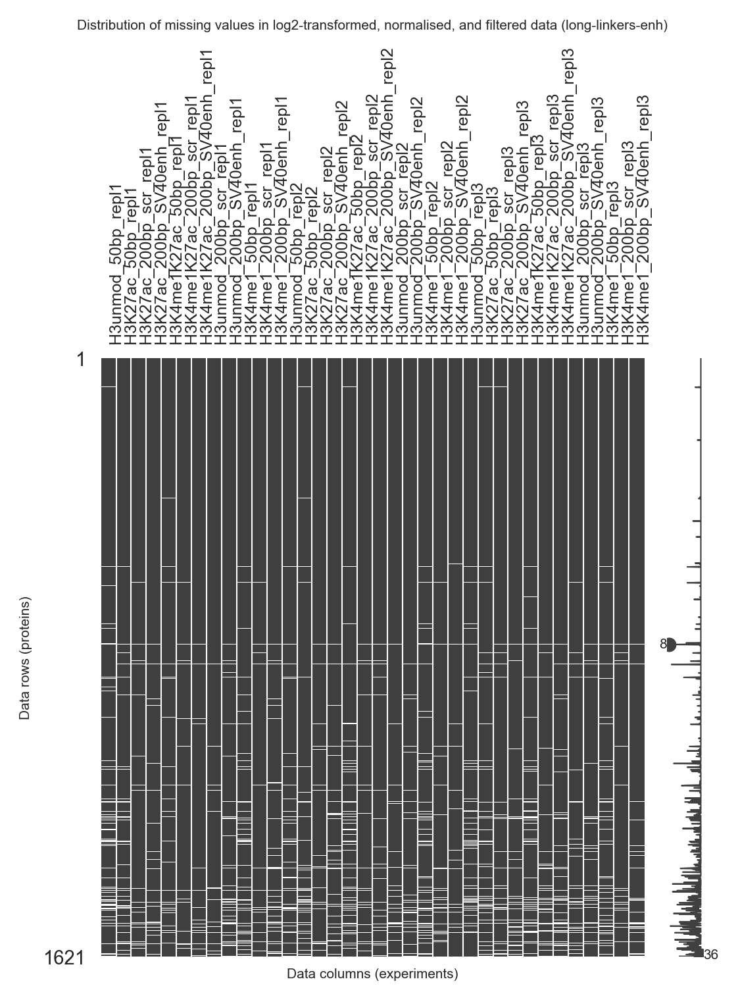

In [73]:
import missingno as msgno
msgno.matrix(data_to_model, figsize=(20*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH), fontsize=6)

plt.title(f"Distribution of missing values in log2-transformed, normalised, and filtered data ({DATASET})")
plt.xlabel("Data columns (experiments)")
plt.ylabel("Data rows (proteins)")
plt.xticks(rotation=90)

_fname = OUTPUT_DIRECTORY / f'03-modelling-log2-transformed-normalised-filtered-missing-values.{DATASET}.png'
_caption = """
Distribution of missing values in the log2-transformed, normalised, and filtered data which will be used for modelling. 
The heatmap above displays all  929 proteins remaining in the data after filtering in rows, and all experiments in columns. 
Dark values indicate the presence of a value, while white space indicates the absence of one. 
The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

The special cases here are the proteins which have all zero values in some of the conditions:

In [74]:
all_zero_in_some_condition = (number_non_null_per_condition == 0).any(axis=1)
all_zero_in_some_condition = all_zero_in_some_condition.loc[data_to_model.index]
all_zero_in_some_condition.value_counts()

False    1550
True       71
dtype: int64

These proteins are special cases. To visualise them better let's establish a consistent sort order which is based on which condition is missing

In [75]:
all_zero_in_some_condition_sort_order = number_non_null_per_condition.loc[
    all_zero_in_some_condition[all_zero_in_some_condition].index
].sort_values(by=list(number_non_null_per_condition.columns)).index



Let's plot these special cases


Distribution of missing values in the log2-transformed, normalised, and filtered data of proteins that correspond to "special cases" in the modeling as they have all zero values in at least one of the conditions.
The heatmap above displays all of such proteins, sorted by their missing value pattern. 
Dark values indicate the presence of a value, while white space indicates the absence of one. 
The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.



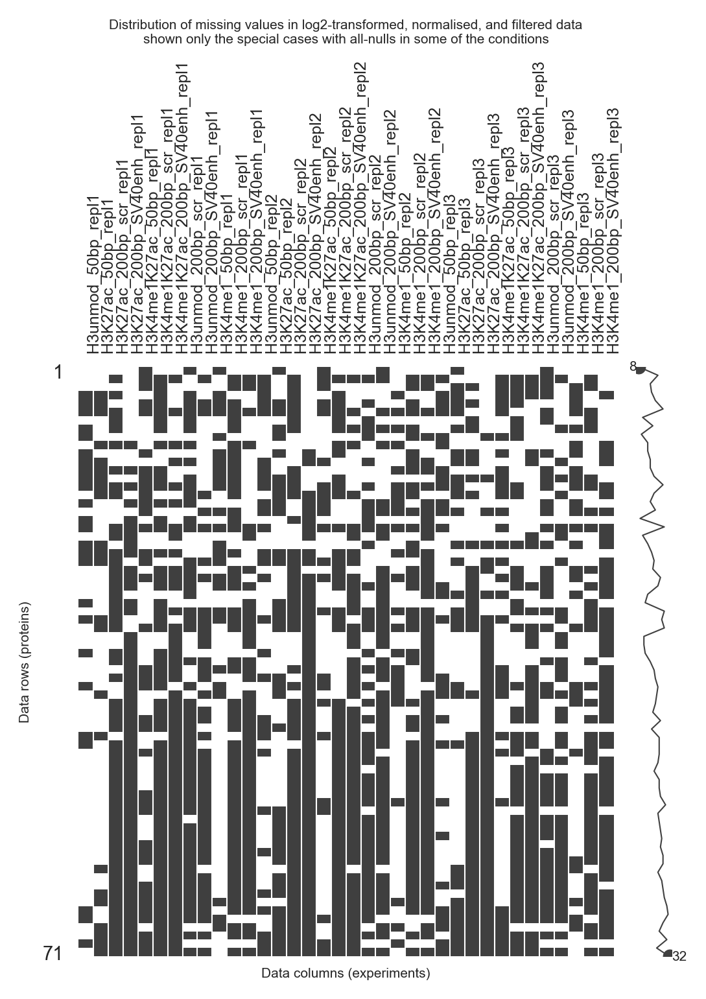

In [76]:
import missingno as msgno
msgno.matrix(
    data_to_model.loc[all_zero_in_some_condition_sort_order], figsize=(20*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH), fontsize=6)

plt.title("Distribution of missing values in log2-transformed, normalised, and filtered data\nshown only the special cases with all-nulls in some of the conditions")
plt.xlabel("Data columns (experiments)")
plt.ylabel("Data rows (proteins)")
plt.xticks(rotation=90)

# For some reason this plot does not rasterize well..
_fname = OUTPUT_DIRECTORY / f'03-modelling-log2-transformed-normalised-filtered-missing-values-all_zero_in_some_condition.{DATASET}.png'
_caption = """
Distribution of missing values in the log2-transformed, normalised, and filtered data of proteins that correspond to "special cases" in the modeling as they have all zero values in at least one of the conditions.
The heatmap above displays all of such proteins, sorted by their missing value pattern. 
Dark values indicate the presence of a value, while white space indicates the absence of one. 
The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

We can also get a few representative special cases of proteins from that list

In [77]:
import numpy as np

In [78]:
REPRESENTATIVE_NULLS = np.random.RandomState(42).choice(all_zero_in_some_condition_sort_order, 5)

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)



Distribution of non-null values of log2-transformed, normalised, and filtered dataset. 
The rows facet the four experiment types, while the columns split the data per replicate.
The green distribution plot shows the histogram of observed log2 values in the data.
The black curve shows the corresponding normal distribution fit to the data, whose parameters are written in the top-right corner.
The black vertical line indicates the mean ($\mu$) estimate.



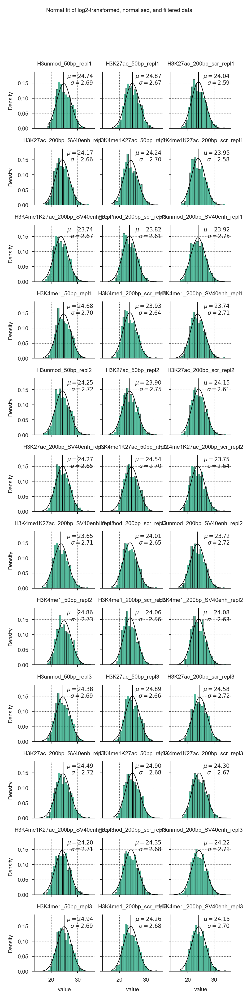

In [79]:
# Convert data to long format
_df = data_to_model.copy()
_df = _df.stack(_df.columns.names)
_df.name = 'value'
_df = _df.reset_index()

# Plot the histograms and normal distribution fits
fgrid = sns.FacetGrid(col='Experiment_Linker_Replicate', col_wrap=3, col_order=data_to_model.columns, data=_df, size=FIVE_MM_IN_INCH*5)
fgrid.map(sns.histplot, 'value', stat='density')
fgrid.map(_plot_norm_fit, 'value')
fgrid.set_titles('{col_name}')

plt.suptitle("Normal fit of log2-transformed, normalised, and filtered data", y=1.05)

_fname = OUTPUT_DIRECTORY / '03-modelling-log2-transformed-normalised-filtered-normal-fit.pdf'
_caption = """
Distribution of non-null values of log2-transformed, normalised, and filtered dataset. 
The rows facet the four experiment types, while the columns split the data per replicate.
The green distribution plot shows the histogram of observed log2 values in the data.
The black curve shows the corresponding normal distribution fit to the data, whose parameters are written in the top-right corner.
The black vertical line indicates the mean ($\mu$) estimate.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

### Design matrix

For modeling we will use limma and encode the data as a "means" model.

We first need to load the limma into rpy2 environment:

In [80]:
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri, numpy2ri

%load_ext rpy2.ipython

Time to load data into R, we will use limma for most tastks:

In [81]:
%%R

library("limma")
packageVersion("limma")

[1]

 ‘3.50.1’

Now we load the header data and make sure that it's columns are interpreted as factors correctly:

In [82]:
assert headers.index.equals(data_to_model.columns), "Make sure that headers_to_model index matches data_to_model columns!"

In [83]:
headers

,Experiment,Linker,Replicate,Experiment_Linker
Experiment_Linker_Replicate,,,,
H3unmod_50bp_repl1,H3unmod,50bp,1,H3unmod_50bp
H3K27ac_50bp_repl1,H3K27ac,50bp,1,H3K27ac_50bp
H3K27ac_200bp_scr_repl1,H3K27ac,200bp_scr,1,H3K27ac_200bp_scr
H3K27ac_200bp_SV40enh_repl1,H3K27ac,200bp_SV40enh,1,H3K27ac_200bp_SV40enh
H3K4me1K27ac_50bp_repl1,H3K4me1K27ac,50bp,1,H3K4me1K27ac_50bp
H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac,200bp_scr,1,H3K4me1K27ac_200bp_scr
H3K4me1K27ac_200bp_SV40enh_repl1,H3K4me1K27ac,200bp_SV40enh,1,H3K4me1K27ac_200bp_SV40enh
H3unmod_200bp_scr_repl1,H3unmod,200bp_scr,1,H3unmod_200bp_scr
H3unmod_200bp_SV40enh_repl1,H3unmod,200bp_SV40enh,1,H3unmod_200bp_SV40enh


In [84]:
%%R -i headers -i DATASET -i ref_experiment -i ref_linker -i ref_experiment_linker

headers$Experiment_Linker <- as.factor(headers$Experiment_Linker)

headers$Experiment_linker <- relevel(headers$Experiment_Linker, ref=ref_experiment_linker)

headers$Experiment <- as.factor(headers$Experiment)
headers$Experiment <- relevel(headers$Experiment, ref=ref_experiment)

headers$Linker <- as.factor(headers$Linker)
headers$Linker <- relevel(headers$Linker, ref=ref_linker)

headers$Replicate <- as.factor(headers$Replicate)
headers

   Experiment

        Linker

 Replicate


H3unmod_50bp_repl1              

      H3unmod

          50bp

         1


H3K27ac_50bp_repl1              

      H3K27ac

          50bp

         1


H3K27ac_200bp_scr_repl1         

      H3K27ac

     200bp_scr

         1


H3K27ac_200bp_SV40enh_repl1     

      H3K27ac

 200bp_SV40enh

         1


H3K4me1K27ac_50bp_repl1         

 H3K4me1K27ac

          50bp

         1


H3K4me1K27ac_200bp_scr_repl1    

 H3K4me1K27ac

     200bp_scr

         1


H3K4me1K27ac_200bp_SV40enh_repl1

 H3K4me1K27ac

 200bp_SV40enh

         1


H3unmod_200bp_scr_repl1         

      H3unmod

     200bp_scr

         1


H3unmod_200bp_SV40enh_repl1     

      H3unmod

 200bp_SV40enh

         1


H3K4me1_50bp_repl1              

      H3K4me1

          50bp

         1


H3K4me1_200bp_scr_repl1         

      H3K4me1

     200bp_scr

         1


H3K4me1_200bp_SV40enh_repl1     

      H3K4me1

 200bp_SV40enh

         1


H3unmod_50bp_repl2              

      H3unmod

          50bp

         2


H3K27ac_50bp_repl2              

      H3K27ac

          50bp

         2


H3K27ac_200bp_scr_repl2         

      H3K27ac

     200bp_scr

         2


H3K27ac_200bp_SV40enh_repl2     

      H3K27ac

 200bp_SV40enh

         2


H3K4me1K27ac_50bp_repl2         

 H3K4me1K27ac

          50bp

         2


H3K4me1K27ac_200bp_scr_repl2    

 H3K4me1K27ac

     200bp_scr

         2


H3K4me1K27ac_200bp_SV40enh_repl2

 H3K4me1K27ac

 200bp_SV40enh

         2


H3unmod_200bp_scr_repl2         

      H3unmod

     200bp_scr

         2


H3unmod_200bp_SV40enh_repl2     

      H3unmod

 200bp_SV40enh

         2


H3K4me1_50bp_repl2              

      H3K4me1

          50bp

         2


H3K4me1_200bp_scr_repl2         

      H3K4me1

     200bp_scr

         2


H3K4me1_200bp_SV40enh_repl2     

      H3K4me1

 200bp_SV40enh

         2


H3unmod_50bp_repl3              

      H3unmod

          50bp

         3


H3K27ac_50bp_repl3              

      H3K27ac

          50bp

         3


H3K27ac_200bp_scr_repl3         

      H3K27ac

     200bp_scr

         3


H3K27ac_200bp_SV40enh_repl3     

      H3K27ac

 200bp_SV40enh

         3


H3K4me1K27ac_50bp_repl3         

 H3K4me1K27ac

          50bp

         3


H3K4me1K27ac_200bp_scr_repl3    

 H3K4me1K27ac

     200bp_scr

         3


H3K4me1K27ac_200bp_SV40enh_repl3

 H3K4me1K27ac

 200bp_SV40enh

         3


H3unmod_200bp_scr_repl3         

      H3unmod

     200bp_scr

         3


H3unmod_200bp_SV40enh_repl3     

      H3unmod

 200bp_SV40enh

         3


H3K4me1_50bp_repl3              

      H3K4me1

          50bp

         3


H3K4me1_200bp_scr_repl3         

      H3K4me1

     200bp_scr

         3


H3K4me1_200bp_SV40enh_repl3     

      H3K4me1

 200bp_SV40enh

         3

          Experiment_Linker


H3unmod_50bp_repl1              

               H3unmod_50bp


H3K27ac_50bp_repl1              

               H3K27ac_50bp


H3K27ac_200bp_scr_repl1         

          H3K27ac_200bp_scr


H3K27ac_200bp_SV40enh_repl1     

      H3K27ac_200bp_SV40enh


H3K4me1K27ac_50bp_repl1         

          H3K4me1K27ac_50bp


H3K4me1K27ac_200bp_scr_repl1    

     H3K4me1K27ac_200bp_scr


H3K4me1K27ac_200bp_SV40enh_repl1

 H3K4me1K27ac_200bp_SV40enh


H3unmod_200bp_scr_repl1         

          H3unmod_200bp_scr


H3unmod_200bp_SV40enh_repl1     

      H3unmod_200bp_SV40enh


H3K4me1_50bp_repl1              

               H3K4me1_50bp


H3K4me1_200bp_scr_repl1         

          H3K4me1_200bp_scr


H3K4me1_200bp_SV40enh_repl1     

      H3K4me1_200bp_SV40enh


H3unmod_50bp_repl2              

               H3unmod_50bp


H3K27ac_50bp_repl2              

               H3K27ac_50bp


H3K27ac_200bp_scr_repl2         

          H3K27ac_200bp_scr


H3K27ac_200bp_SV40enh_repl2     

      H3K27ac_200bp_SV40enh


H3K4me1K27ac_50bp_repl2         

          H3K4me1K27ac_50bp


H3K4me1K27ac_200bp_scr_repl2    

     H3K4me1K27ac_200bp_scr


H3K4me1K27ac_200bp_SV40enh_repl2

 H3K4me1K27ac_200bp_SV40enh


H3unmod_200bp_scr_repl2         

          H3unmod_200bp_scr


H3unmod_200bp_SV40enh_repl2     

      H3unmod_200bp_SV40enh


H3K4me1_50bp_repl2              

               H3K4me1_50bp


H3K4me1_200bp_scr_repl2         

          H3K4me1_200bp_scr


H3K4me1_200bp_SV40enh_repl2     

      H3K4me1_200bp_SV40enh


H3unmod_50bp_repl3              

               H3unmod_50bp


H3K27ac_50bp_repl3              

               H3K27ac_50bp


H3K27ac_200bp_scr_repl3         

          H3K27ac_200bp_scr


H3K27ac_200bp_SV40enh_repl3     

      H3K27ac_200bp_SV40enh


H3K4me1K27ac_50bp_repl3         

          H3K4me1K27ac_50bp


H3K4me1K27ac_200bp_scr_repl3    

     H3K4me1K27ac_200bp_scr


H3K4me1K27ac_200bp_SV40enh_repl3

 H3K4me1K27ac_200bp_SV40enh


H3unmod_200bp_scr_repl3         

          H3unmod_200bp_scr


H3unmod_200bp_SV40enh_repl3     

      H3unmod_200bp_SV40enh


H3K4me1_50bp_repl3              

               H3K4me1_50bp


H3K4me1_200bp_scr_repl3         

          H3K4me1_200bp_scr


H3K4me1_200bp_SV40enh_repl3     

      H3K4me1_200bp_SV40enh

          Experiment_linker


H3unmod_50bp_repl1              

               H3unmod_50bp


H3K27ac_50bp_repl1              

               H3K27ac_50bp


H3K27ac_200bp_scr_repl1         

          H3K27ac_200bp_scr


H3K27ac_200bp_SV40enh_repl1     

      H3K27ac_200bp_SV40enh


H3K4me1K27ac_50bp_repl1         

          H3K4me1K27ac_50bp


H3K4me1K27ac_200bp_scr_repl1    

     H3K4me1K27ac_200bp_scr


H3K4me1K27ac_200bp_SV40enh_repl1

 H3K4me1K27ac_200bp_SV40enh


H3unmod_200bp_scr_repl1         

          H3unmod_200bp_scr


H3unmod_200bp_SV40enh_repl1     

      H3unmod_200bp_SV40enh


H3K4me1_50bp_repl1              

               H3K4me1_50bp


H3K4me1_200bp_scr_repl1         

          H3K4me1_200bp_scr


H3K4me1_200bp_SV40enh_repl1     

      H3K4me1_200bp_SV40enh


H3unmod_50bp_repl2              

               H3unmod_50bp


H3K27ac_50bp_repl2              

               H3K27ac_50bp


H3K27ac_200bp_scr_repl2         

          H3K27ac_200bp_scr


H3K27ac_200bp_SV40enh_repl2     

      H3K27ac_200bp_SV40enh


H3K4me1K27ac_50bp_repl2         

          H3K4me1K27ac_50bp


H3K4me1K27ac_200bp_scr_repl2    

     H3K4me1K27ac_200bp_scr


H3K4me1K27ac_200bp_SV40enh_repl2

 H3K4me1K27ac_200bp_SV40enh


H3unmod_200bp_scr_repl2         

          H3unmod_200bp_scr


H3unmod_200bp_SV40enh_repl2     

      H3unmod_200bp_SV40enh


H3K4me1_50bp_repl2              

               H3K4me1_50bp


H3K4me1_200bp_scr_repl2         

          H3K4me1_200bp_scr


H3K4me1_200bp_SV40enh_repl2     

      H3K4me1_200bp_SV40enh


H3unmod_50bp_repl3              

               H3unmod_50bp


H3K27ac_50bp_repl3              

               H3K27ac_50bp


H3K27ac_200bp_scr_repl3         

          H3K27ac_200bp_scr


H3K27ac_200bp_SV40enh_repl3     

      H3K27ac_200bp_SV40enh


H3K4me1K27ac_50bp_repl3         

          H3K4me1K27ac_50bp


H3K4me1K27ac_200bp_scr_repl3    

     H3K4me1K27ac_200bp_scr


H3K4me1K27ac_200bp_SV40enh_repl3

 H3K4me1K27ac_200bp_SV40enh


H3unmod_200bp_scr_repl3         

          H3unmod_200bp_scr


H3unmod_200bp_SV40enh_repl3     

      H3unmod_200bp_SV40enh


H3K4me1_50bp_repl3              

               H3K4me1_50bp


H3K4me1_200bp_scr_repl3         

          H3K4me1_200bp_scr


H3K4me1_200bp_SV40enh_repl3     

      H3K4me1_200bp_SV40enh

To create the design matrix, we will use a Means (no intercept) design

In [85]:
%%R

# Do not use intercept:
design <- model.matrix(~0 + Experiment_Linker, headers)
design

 Experiment_LinkerH3K27ac_200bp_SV40enh


H3unmod_50bp_repl1              

                                      0


H3K27ac_50bp_repl1              

                                      0


H3K27ac_200bp_scr_repl1         

                                      0


H3K27ac_200bp_SV40enh_repl1     

                                      1


H3K4me1K27ac_50bp_repl1         

                                      0


H3K4me1K27ac_200bp_scr_repl1    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl1

                                      0


H3unmod_200bp_scr_repl1         

                                      0


H3unmod_200bp_SV40enh_repl1     

                                      0


H3K4me1_50bp_repl1              

                                      0


H3K4me1_200bp_scr_repl1         

                                      0


H3K4me1_200bp_SV40enh_repl1     

                                      0


H3unmod_50bp_repl2              

                                      0


H3K27ac_50bp_repl2              

                                      0


H3K27ac_200bp_scr_repl2         

                                      0


H3K27ac_200bp_SV40enh_repl2     

                                      1


H3K4me1K27ac_50bp_repl2         

                                      0


H3K4me1K27ac_200bp_scr_repl2    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl2

                                      0


H3unmod_200bp_scr_repl2         

                                      0


H3unmod_200bp_SV40enh_repl2     

                                      0


H3K4me1_50bp_repl2              

                                      0


H3K4me1_200bp_scr_repl2         

                                      0


H3K4me1_200bp_SV40enh_repl2     

                                      0


H3unmod_50bp_repl3              

                                      0


H3K27ac_50bp_repl3              

                                      0


H3K27ac_200bp_scr_repl3         

                                      0


H3K27ac_200bp_SV40enh_repl3     

                                      1


H3K4me1K27ac_50bp_repl3         

                                      0


H3K4me1K27ac_200bp_scr_repl3    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl3

                                      0


H3unmod_200bp_scr_repl3         

                                      0


H3unmod_200bp_SV40enh_repl3     

                                      0


H3K4me1_50bp_repl3              

                                      0


H3K4me1_200bp_scr_repl3         

                                      0


H3K4me1_200bp_SV40enh_repl3     

                                      0

 Experiment_LinkerH3K27ac_200bp_scr


H3unmod_50bp_repl1              

                                  0


H3K27ac_50bp_repl1              

                                  0


H3K27ac_200bp_scr_repl1         

                                  1


H3K27ac_200bp_SV40enh_repl1     

                                  0


H3K4me1K27ac_50bp_repl1         

                                  0


H3K4me1K27ac_200bp_scr_repl1    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl1

                                  0


H3unmod_200bp_scr_repl1         

                                  0


H3unmod_200bp_SV40enh_repl1     

                                  0


H3K4me1_50bp_repl1              

                                  0


H3K4me1_200bp_scr_repl1         

                                  0


H3K4me1_200bp_SV40enh_repl1     

                                  0


H3unmod_50bp_repl2              

                                  0


H3K27ac_50bp_repl2              

                                  0


H3K27ac_200bp_scr_repl2         

                                  1


H3K27ac_200bp_SV40enh_repl2     

                                  0


H3K4me1K27ac_50bp_repl2         

                                  0


H3K4me1K27ac_200bp_scr_repl2    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl2

                                  0


H3unmod_200bp_scr_repl2         

                                  0


H3unmod_200bp_SV40enh_repl2     

                                  0


H3K4me1_50bp_repl2              

                                  0


H3K4me1_200bp_scr_repl2         

                                  0


H3K4me1_200bp_SV40enh_repl2     

                                  0


H3unmod_50bp_repl3              

                                  0


H3K27ac_50bp_repl3              

                                  0


H3K27ac_200bp_scr_repl3         

                                  1


H3K27ac_200bp_SV40enh_repl3     

                                  0


H3K4me1K27ac_50bp_repl3         

                                  0


H3K4me1K27ac_200bp_scr_repl3    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl3

                                  0


H3unmod_200bp_scr_repl3         

                                  0


H3unmod_200bp_SV40enh_repl3     

                                  0


H3K4me1_50bp_repl3              

                                  0


H3K4me1_200bp_scr_repl3         

                                  0


H3K4me1_200bp_SV40enh_repl3     

                                  0

 Experiment_LinkerH3K27ac_50bp


H3unmod_50bp_repl1              

                             0


H3K27ac_50bp_repl1              

                             1


H3K27ac_200bp_scr_repl1         

                             0


H3K27ac_200bp_SV40enh_repl1     

                             0


H3K4me1K27ac_50bp_repl1         

                             0


H3K4me1K27ac_200bp_scr_repl1    

                             0


H3K4me1K27ac_200bp_SV40enh_repl1

                             0


H3unmod_200bp_scr_repl1         

                             0


H3unmod_200bp_SV40enh_repl1     

                             0


H3K4me1_50bp_repl1              

                             0


H3K4me1_200bp_scr_repl1         

                             0


H3K4me1_200bp_SV40enh_repl1     

                             0


H3unmod_50bp_repl2              

                             0


H3K27ac_50bp_repl2              

                             1


H3K27ac_200bp_scr_repl2         

                             0


H3K27ac_200bp_SV40enh_repl2     

                             0


H3K4me1K27ac_50bp_repl2         

                             0


H3K4me1K27ac_200bp_scr_repl2    

                             0


H3K4me1K27ac_200bp_SV40enh_repl2

                             0


H3unmod_200bp_scr_repl2         

                             0


H3unmod_200bp_SV40enh_repl2     

                             0


H3K4me1_50bp_repl2              

                             0


H3K4me1_200bp_scr_repl2         

                             0


H3K4me1_200bp_SV40enh_repl2     

                             0


H3unmod_50bp_repl3              

                             0


H3K27ac_50bp_repl3              

                             1


H3K27ac_200bp_scr_repl3         

                             0


H3K27ac_200bp_SV40enh_repl3     

                             0


H3K4me1K27ac_50bp_repl3         

                             0


H3K4me1K27ac_200bp_scr_repl3    

                             0


H3K4me1K27ac_200bp_SV40enh_repl3

                             0


H3unmod_200bp_scr_repl3         

                             0


H3unmod_200bp_SV40enh_repl3     

                             0


H3K4me1_50bp_repl3              

                             0


H3K4me1_200bp_scr_repl3         

                             0


H3K4me1_200bp_SV40enh_repl3     

                             0

 Experiment_LinkerH3K4me1K27ac_200bp_SV40enh


H3unmod_50bp_repl1              

                                           0


H3K27ac_50bp_repl1              

                                           0


H3K27ac_200bp_scr_repl1         

                                           0


H3K27ac_200bp_SV40enh_repl1     

                                           0


H3K4me1K27ac_50bp_repl1         

                                           0


H3K4me1K27ac_200bp_scr_repl1    

                                           0


H3K4me1K27ac_200bp_SV40enh_repl1

                                           1


H3unmod_200bp_scr_repl1         

                                           0


H3unmod_200bp_SV40enh_repl1     

                                           0


H3K4me1_50bp_repl1              

                                           0


H3K4me1_200bp_scr_repl1         

                                           0


H3K4me1_200bp_SV40enh_repl1     

                                           0


H3unmod_50bp_repl2              

                                           0


H3K27ac_50bp_repl2              

                                           0


H3K27ac_200bp_scr_repl2         

                                           0


H3K27ac_200bp_SV40enh_repl2     

                                           0


H3K4me1K27ac_50bp_repl2         

                                           0


H3K4me1K27ac_200bp_scr_repl2    

                                           0


H3K4me1K27ac_200bp_SV40enh_repl2

                                           1


H3unmod_200bp_scr_repl2         

                                           0


H3unmod_200bp_SV40enh_repl2     

                                           0


H3K4me1_50bp_repl2              

                                           0


H3K4me1_200bp_scr_repl2         

                                           0


H3K4me1_200bp_SV40enh_repl2     

                                           0


H3unmod_50bp_repl3              

                                           0


H3K27ac_50bp_repl3              

                                           0


H3K27ac_200bp_scr_repl3         

                                           0


H3K27ac_200bp_SV40enh_repl3     

                                           0


H3K4me1K27ac_50bp_repl3         

                                           0


H3K4me1K27ac_200bp_scr_repl3    

                                           0


H3K4me1K27ac_200bp_SV40enh_repl3

                                           1


H3unmod_200bp_scr_repl3         

                                           0


H3unmod_200bp_SV40enh_repl3     

                                           0


H3K4me1_50bp_repl3              

                                           0


H3K4me1_200bp_scr_repl3         

                                           0


H3K4me1_200bp_SV40enh_repl3     

                                           0

 Experiment_LinkerH3K4me1K27ac_200bp_scr


H3unmod_50bp_repl1              

                                       0


H3K27ac_50bp_repl1              

                                       0


H3K27ac_200bp_scr_repl1         

                                       0


H3K27ac_200bp_SV40enh_repl1     

                                       0


H3K4me1K27ac_50bp_repl1         

                                       0


H3K4me1K27ac_200bp_scr_repl1    

                                       1


H3K4me1K27ac_200bp_SV40enh_repl1

                                       0


H3unmod_200bp_scr_repl1         

                                       0


H3unmod_200bp_SV40enh_repl1     

                                       0


H3K4me1_50bp_repl1              

                                       0


H3K4me1_200bp_scr_repl1         

                                       0


H3K4me1_200bp_SV40enh_repl1     

                                       0


H3unmod_50bp_repl2              

                                       0


H3K27ac_50bp_repl2              

                                       0


H3K27ac_200bp_scr_repl2         

                                       0


H3K27ac_200bp_SV40enh_repl2     

                                       0


H3K4me1K27ac_50bp_repl2         

                                       0


H3K4me1K27ac_200bp_scr_repl2    

                                       1


H3K4me1K27ac_200bp_SV40enh_repl2

                                       0


H3unmod_200bp_scr_repl2         

                                       0


H3unmod_200bp_SV40enh_repl2     

                                       0


H3K4me1_50bp_repl2              

                                       0


H3K4me1_200bp_scr_repl2         

                                       0


H3K4me1_200bp_SV40enh_repl2     

                                       0


H3unmod_50bp_repl3              

                                       0


H3K27ac_50bp_repl3              

                                       0


H3K27ac_200bp_scr_repl3         

                                       0


H3K27ac_200bp_SV40enh_repl3     

                                       0


H3K4me1K27ac_50bp_repl3         

                                       0


H3K4me1K27ac_200bp_scr_repl3    

                                       1


H3K4me1K27ac_200bp_SV40enh_repl3

                                       0


H3unmod_200bp_scr_repl3         

                                       0


H3unmod_200bp_SV40enh_repl3     

                                       0


H3K4me1_50bp_repl3              

                                       0


H3K4me1_200bp_scr_repl3         

                                       0


H3K4me1_200bp_SV40enh_repl3     

                                       0

 Experiment_LinkerH3K4me1K27ac_50bp


H3unmod_50bp_repl1              

                                  0


H3K27ac_50bp_repl1              

                                  0


H3K27ac_200bp_scr_repl1         

                                  0


H3K27ac_200bp_SV40enh_repl1     

                                  0


H3K4me1K27ac_50bp_repl1         

                                  1


H3K4me1K27ac_200bp_scr_repl1    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl1

                                  0


H3unmod_200bp_scr_repl1         

                                  0


H3unmod_200bp_SV40enh_repl1     

                                  0


H3K4me1_50bp_repl1              

                                  0


H3K4me1_200bp_scr_repl1         

                                  0


H3K4me1_200bp_SV40enh_repl1     

                                  0


H3unmod_50bp_repl2              

                                  0


H3K27ac_50bp_repl2              

                                  0


H3K27ac_200bp_scr_repl2         

                                  0


H3K27ac_200bp_SV40enh_repl2     

                                  0


H3K4me1K27ac_50bp_repl2         

                                  1


H3K4me1K27ac_200bp_scr_repl2    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl2

                                  0


H3unmod_200bp_scr_repl2         

                                  0


H3unmod_200bp_SV40enh_repl2     

                                  0


H3K4me1_50bp_repl2              

                                  0


H3K4me1_200bp_scr_repl2         

                                  0


H3K4me1_200bp_SV40enh_repl2     

                                  0


H3unmod_50bp_repl3              

                                  0


H3K27ac_50bp_repl3              

                                  0


H3K27ac_200bp_scr_repl3         

                                  0


H3K27ac_200bp_SV40enh_repl3     

                                  0


H3K4me1K27ac_50bp_repl3         

                                  1


H3K4me1K27ac_200bp_scr_repl3    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl3

                                  0


H3unmod_200bp_scr_repl3         

                                  0


H3unmod_200bp_SV40enh_repl3     

                                  0


H3K4me1_50bp_repl3              

                                  0


H3K4me1_200bp_scr_repl3         

                                  0


H3K4me1_200bp_SV40enh_repl3     

                                  0

 Experiment_LinkerH3K4me1_200bp_SV40enh


H3unmod_50bp_repl1              

                                      0


H3K27ac_50bp_repl1              

                                      0


H3K27ac_200bp_scr_repl1         

                                      0


H3K27ac_200bp_SV40enh_repl1     

                                      0


H3K4me1K27ac_50bp_repl1         

                                      0


H3K4me1K27ac_200bp_scr_repl1    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl1

                                      0


H3unmod_200bp_scr_repl1         

                                      0


H3unmod_200bp_SV40enh_repl1     

                                      0


H3K4me1_50bp_repl1              

                                      0


H3K4me1_200bp_scr_repl1         

                                      0


H3K4me1_200bp_SV40enh_repl1     

                                      1


H3unmod_50bp_repl2              

                                      0


H3K27ac_50bp_repl2              

                                      0


H3K27ac_200bp_scr_repl2         

                                      0


H3K27ac_200bp_SV40enh_repl2     

                                      0


H3K4me1K27ac_50bp_repl2         

                                      0


H3K4me1K27ac_200bp_scr_repl2    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl2

                                      0


H3unmod_200bp_scr_repl2         

                                      0


H3unmod_200bp_SV40enh_repl2     

                                      0


H3K4me1_50bp_repl2              

                                      0


H3K4me1_200bp_scr_repl2         

                                      0


H3K4me1_200bp_SV40enh_repl2     

                                      1


H3unmod_50bp_repl3              

                                      0


H3K27ac_50bp_repl3              

                                      0


H3K27ac_200bp_scr_repl3         

                                      0


H3K27ac_200bp_SV40enh_repl3     

                                      0


H3K4me1K27ac_50bp_repl3         

                                      0


H3K4me1K27ac_200bp_scr_repl3    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl3

                                      0


H3unmod_200bp_scr_repl3         

                                      0


H3unmod_200bp_SV40enh_repl3     

                                      0


H3K4me1_50bp_repl3              

                                      0


H3K4me1_200bp_scr_repl3         

                                      0


H3K4me1_200bp_SV40enh_repl3     

                                      1

 Experiment_LinkerH3K4me1_200bp_scr


H3unmod_50bp_repl1              

                                  0


H3K27ac_50bp_repl1              

                                  0


H3K27ac_200bp_scr_repl1         

                                  0


H3K27ac_200bp_SV40enh_repl1     

                                  0


H3K4me1K27ac_50bp_repl1         

                                  0


H3K4me1K27ac_200bp_scr_repl1    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl1

                                  0


H3unmod_200bp_scr_repl1         

                                  0


H3unmod_200bp_SV40enh_repl1     

                                  0


H3K4me1_50bp_repl1              

                                  0


H3K4me1_200bp_scr_repl1         

                                  1


H3K4me1_200bp_SV40enh_repl1     

                                  0


H3unmod_50bp_repl2              

                                  0


H3K27ac_50bp_repl2              

                                  0


H3K27ac_200bp_scr_repl2         

                                  0


H3K27ac_200bp_SV40enh_repl2     

                                  0


H3K4me1K27ac_50bp_repl2         

                                  0


H3K4me1K27ac_200bp_scr_repl2    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl2

                                  0


H3unmod_200bp_scr_repl2         

                                  0


H3unmod_200bp_SV40enh_repl2     

                                  0


H3K4me1_50bp_repl2              

                                  0


H3K4me1_200bp_scr_repl2         

                                  1


H3K4me1_200bp_SV40enh_repl2     

                                  0


H3unmod_50bp_repl3              

                                  0


H3K27ac_50bp_repl3              

                                  0


H3K27ac_200bp_scr_repl3         

                                  0


H3K27ac_200bp_SV40enh_repl3     

                                  0


H3K4me1K27ac_50bp_repl3         

                                  0


H3K4me1K27ac_200bp_scr_repl3    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl3

                                  0


H3unmod_200bp_scr_repl3         

                                  0


H3unmod_200bp_SV40enh_repl3     

                                  0


H3K4me1_50bp_repl3              

                                  0


H3K4me1_200bp_scr_repl3         

                                  1


H3K4me1_200bp_SV40enh_repl3     

                                  0

 Experiment_LinkerH3K4me1_50bp


H3unmod_50bp_repl1              

                             0


H3K27ac_50bp_repl1              

                             0


H3K27ac_200bp_scr_repl1         

                             0


H3K27ac_200bp_SV40enh_repl1     

                             0


H3K4me1K27ac_50bp_repl1         

                             0


H3K4me1K27ac_200bp_scr_repl1    

                             0


H3K4me1K27ac_200bp_SV40enh_repl1

                             0


H3unmod_200bp_scr_repl1         

                             0


H3unmod_200bp_SV40enh_repl1     

                             0


H3K4me1_50bp_repl1              

                             1


H3K4me1_200bp_scr_repl1         

                             0


H3K4me1_200bp_SV40enh_repl1     

                             0


H3unmod_50bp_repl2              

                             0


H3K27ac_50bp_repl2              

                             0


H3K27ac_200bp_scr_repl2         

                             0


H3K27ac_200bp_SV40enh_repl2     

                             0


H3K4me1K27ac_50bp_repl2         

                             0


H3K4me1K27ac_200bp_scr_repl2    

                             0


H3K4me1K27ac_200bp_SV40enh_repl2

                             0


H3unmod_200bp_scr_repl2         

                             0


H3unmod_200bp_SV40enh_repl2     

                             0


H3K4me1_50bp_repl2              

                             1


H3K4me1_200bp_scr_repl2         

                             0


H3K4me1_200bp_SV40enh_repl2     

                             0


H3unmod_50bp_repl3              

                             0


H3K27ac_50bp_repl3              

                             0


H3K27ac_200bp_scr_repl3         

                             0


H3K27ac_200bp_SV40enh_repl3     

                             0


H3K4me1K27ac_50bp_repl3         

                             0


H3K4me1K27ac_200bp_scr_repl3    

                             0


H3K4me1K27ac_200bp_SV40enh_repl3

                             0


H3unmod_200bp_scr_repl3         

                             0


H3unmod_200bp_SV40enh_repl3     

                             0


H3K4me1_50bp_repl3              

                             1


H3K4me1_200bp_scr_repl3         

                             0


H3K4me1_200bp_SV40enh_repl3     

                             0

 Experiment_LinkerH3unmod_200bp_SV40enh


H3unmod_50bp_repl1              

                                      0


H3K27ac_50bp_repl1              

                                      0


H3K27ac_200bp_scr_repl1         

                                      0


H3K27ac_200bp_SV40enh_repl1     

                                      0


H3K4me1K27ac_50bp_repl1         

                                      0


H3K4me1K27ac_200bp_scr_repl1    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl1

                                      0


H3unmod_200bp_scr_repl1         

                                      0


H3unmod_200bp_SV40enh_repl1     

                                      1


H3K4me1_50bp_repl1              

                                      0


H3K4me1_200bp_scr_repl1         

                                      0


H3K4me1_200bp_SV40enh_repl1     

                                      0


H3unmod_50bp_repl2              

                                      0


H3K27ac_50bp_repl2              

                                      0


H3K27ac_200bp_scr_repl2         

                                      0


H3K27ac_200bp_SV40enh_repl2     

                                      0


H3K4me1K27ac_50bp_repl2         

                                      0


H3K4me1K27ac_200bp_scr_repl2    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl2

                                      0


H3unmod_200bp_scr_repl2         

                                      0


H3unmod_200bp_SV40enh_repl2     

                                      1


H3K4me1_50bp_repl2              

                                      0


H3K4me1_200bp_scr_repl2         

                                      0


H3K4me1_200bp_SV40enh_repl2     

                                      0


H3unmod_50bp_repl3              

                                      0


H3K27ac_50bp_repl3              

                                      0


H3K27ac_200bp_scr_repl3         

                                      0


H3K27ac_200bp_SV40enh_repl3     

                                      0


H3K4me1K27ac_50bp_repl3         

                                      0


H3K4me1K27ac_200bp_scr_repl3    

                                      0


H3K4me1K27ac_200bp_SV40enh_repl3

                                      0


H3unmod_200bp_scr_repl3         

                                      0


H3unmod_200bp_SV40enh_repl3     

                                      1


H3K4me1_50bp_repl3              

                                      0


H3K4me1_200bp_scr_repl3         

                                      0


H3K4me1_200bp_SV40enh_repl3     

                                      0

 Experiment_LinkerH3unmod_200bp_scr


H3unmod_50bp_repl1              

                                  0


H3K27ac_50bp_repl1              

                                  0


H3K27ac_200bp_scr_repl1         

                                  0


H3K27ac_200bp_SV40enh_repl1     

                                  0


H3K4me1K27ac_50bp_repl1         

                                  0


H3K4me1K27ac_200bp_scr_repl1    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl1

                                  0


H3unmod_200bp_scr_repl1         

                                  1


H3unmod_200bp_SV40enh_repl1     

                                  0


H3K4me1_50bp_repl1              

                                  0


H3K4me1_200bp_scr_repl1         

                                  0


H3K4me1_200bp_SV40enh_repl1     

                                  0


H3unmod_50bp_repl2              

                                  0


H3K27ac_50bp_repl2              

                                  0


H3K27ac_200bp_scr_repl2         

                                  0


H3K27ac_200bp_SV40enh_repl2     

                                  0


H3K4me1K27ac_50bp_repl2         

                                  0


H3K4me1K27ac_200bp_scr_repl2    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl2

                                  0


H3unmod_200bp_scr_repl2         

                                  1


H3unmod_200bp_SV40enh_repl2     

                                  0


H3K4me1_50bp_repl2              

                                  0


H3K4me1_200bp_scr_repl2         

                                  0


H3K4me1_200bp_SV40enh_repl2     

                                  0


H3unmod_50bp_repl3              

                                  0


H3K27ac_50bp_repl3              

                                  0


H3K27ac_200bp_scr_repl3         

                                  0


H3K27ac_200bp_SV40enh_repl3     

                                  0


H3K4me1K27ac_50bp_repl3         

                                  0


H3K4me1K27ac_200bp_scr_repl3    

                                  0


H3K4me1K27ac_200bp_SV40enh_repl3

                                  0


H3unmod_200bp_scr_repl3         

                                  1


H3unmod_200bp_SV40enh_repl3     

                                  0


H3K4me1_50bp_repl3              

                                  0


H3K4me1_200bp_scr_repl3         

                                  0


H3K4me1_200bp_SV40enh_repl3     

                                  0

 Experiment_LinkerH3unmod_50bp


H3unmod_50bp_repl1              

                             1


H3K27ac_50bp_repl1              

                             0


H3K27ac_200bp_scr_repl1         

                             0


H3K27ac_200bp_SV40enh_repl1     

                             0


H3K4me1K27ac_50bp_repl1         

                             0


H3K4me1K27ac_200bp_scr_repl1    

                             0


H3K4me1K27ac_200bp_SV40enh_repl1

                             0


H3unmod_200bp_scr_repl1         

                             0


H3unmod_200bp_SV40enh_repl1     

                             0


H3K4me1_50bp_repl1              

                             0


H3K4me1_200bp_scr_repl1         

                             0


H3K4me1_200bp_SV40enh_repl1     

                             0


H3unmod_50bp_repl2              

                             1


H3K27ac_50bp_repl2              

                             0


H3K27ac_200bp_scr_repl2         

                             0


H3K27ac_200bp_SV40enh_repl2     

                             0


H3K4me1K27ac_50bp_repl2         

                             0


H3K4me1K27ac_200bp_scr_repl2    

                             0


H3K4me1K27ac_200bp_SV40enh_repl2

                             0


H3unmod_200bp_scr_repl2         

                             0


H3unmod_200bp_SV40enh_repl2     

                             0


H3K4me1_50bp_repl2              

                             0


H3K4me1_200bp_scr_repl2         

                             0


H3K4me1_200bp_SV40enh_repl2     

                             0


H3unmod_50bp_repl3              

                             1


H3K27ac_50bp_repl3              

                             0


H3K27ac_200bp_scr_repl3         

                             0


H3K27ac_200bp_SV40enh_repl3     

                             0


H3K4me1K27ac_50bp_repl3         

                             0


H3K4me1K27ac_200bp_scr_repl3    

                             0


H3K4me1K27ac_200bp_SV40enh_repl3

                             0


H3unmod_200bp_scr_repl3         

                             0


H3unmod_200bp_SV40enh_repl3     

                             0


H3K4me1_50bp_repl3              

                             0


H3K4me1_200bp_scr_repl3         

                             0


H3K4me1_200bp_SV40enh_repl3     

                             0

attr(,"assign")

 [1]

 1

 1

 1

 1

 1

 1

 1

 1

 1

 1

 1

 1

attr(,"contrasts")

attr(,"contrasts")$Experiment_Linker


[1]

 "contr.treatment"

From this design matrix we are primarily interested in these (quite a few!) contrasts

In [86]:
sorted(headers['Experiment_Linker'].unique())

['H3K27ac_200bp_SV40enh',
 'H3K27ac_200bp_scr',
 'H3K27ac_50bp',
 'H3K4me1K27ac_200bp_SV40enh',
 'H3K4me1K27ac_200bp_scr',
 'H3K4me1K27ac_50bp',
 'H3K4me1_200bp_SV40enh',
 'H3K4me1_200bp_scr',
 'H3K4me1_50bp',
 'H3unmod_200bp_SV40enh',
 'H3unmod_200bp_scr',
 'H3unmod_50bp']

In [87]:
%%R -o contrasts_matrix_as_df -i DATASET

if (DATASET == "long-linkers-enh") {
    
    contrasts.matrix <- limma::makeContrasts(

        "modif_H3K27ac_vs_H3unmod_50bp"                = Experiment_LinkerH3K27ac_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K27ac_vs_H3unmod_200bp_SV40enh"       = Experiment_LinkerH3K27ac_200bp_SV40enh - Experiment_LinkerH3unmod_200bp_SV40enh,
        "modif_H3K27ac_vs_H3unmod_200bp_scr"           = Experiment_LinkerH3K27ac_200bp_scr     - Experiment_LinkerH3unmod_200bp_scr,

        "modif_H3K4me1K27ac_vs_H3unmod_50bp"           = Experiment_LinkerH3K4me1K27ac_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh"  = Experiment_LinkerH3K4me1K27ac_200bp_SV40enh - Experiment_LinkerH3unmod_200bp_SV40enh,
        "modif_H3K4me1K27ac_vs_H3unmod_200bp_scr"      = Experiment_LinkerH3K4me1K27ac_200bp_scr     - Experiment_LinkerH3unmod_200bp_scr,

        "modif_H3K4me1_vs_H3unmod_50bp"                = Experiment_LinkerH3K4me1_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K4me1_vs_H3unmod_200bp_SV40enh"       = Experiment_LinkerH3K4me1_200bp_SV40enh - Experiment_LinkerH3unmod_200bp_SV40enh,
        "modif_H3K4me1_vs_H3unmod_200bp_scr"           = Experiment_LinkerH3K4me1_200bp_scr     - Experiment_LinkerH3unmod_200bp_scr,
        
        "linker_200bp_scr_vs_50bp_H3K27ac"             = Experiment_LinkerH3K27ac_200bp_scr - Experiment_LinkerH3K27ac_50bp,
        "linker_200bp_scr_vs_50bp_H3K4me1K27ac"        = Experiment_LinkerH3K4me1K27ac_200bp_scr - Experiment_LinkerH3K4me1K27ac_50bp,
        "linker_200bp_scr_vs_50bp_H3K4me1"             = Experiment_LinkerH3K4me1_200bp_scr - Experiment_LinkerH3K4me1_50bp,
        "linker_200bp_scr_vs_50bp_H3unmod"             = Experiment_LinkerH3unmod_200bp_scr - Experiment_LinkerH3unmod_50bp,
        
        "linker_200bp_SV40enh_vs_50bp_H3K27ac"             = Experiment_LinkerH3K27ac_200bp_SV40enh      - Experiment_LinkerH3K27ac_50bp,
        "linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac"        = Experiment_LinkerH3K4me1K27ac_200bp_SV40enh - Experiment_LinkerH3K4me1K27ac_50bp,
        "linker_200bp_SV40enh_vs_50bp_H3K4me1"             = Experiment_LinkerH3K4me1_200bp_SV40enh      - Experiment_LinkerH3K4me1_50bp,
        "linker_200bp_SV40enh_vs_50bp_H3unmod"             = Experiment_LinkerH3unmod_200bp_SV40enh      - Experiment_LinkerH3unmod_50bp,
        
        
        "linker_200bp_SV40enh_vs_200bp_scr_H3K27ac"             = Experiment_LinkerH3K27ac_200bp_SV40enh      - Experiment_LinkerH3K27ac_200bp_scr,
        "linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac"        = Experiment_LinkerH3K4me1K27ac_200bp_SV40enh - Experiment_LinkerH3K4me1K27ac_200bp_scr,
        "linker_200bp_SV40enh_vs_200bp_scr_H3K4me1"             = Experiment_LinkerH3K4me1_200bp_SV40enh      - Experiment_LinkerH3K4me1_200bp_scr,
        "linker_200bp_SV40enh_vs_200bp_scr_H3unmod"             = Experiment_LinkerH3unmod_200bp_SV40enh      - Experiment_LinkerH3unmod_200bp_scr,
        
        levels=design
    )
} else if (DATASET == "long-linkers-prom") {
    
    contrasts.matrix <- limma::makeContrasts(

        "modif_Promoter_PTMs_vs_unmodH3_unmodH4_50bp"                = Experiment_LinkerPromoter_PTMs_50bp           - Experiment_LinkerunmodH3_unmodH4_50bp,
        "modif_Promoter_PTMs_vs_unmodH3_unmodH4_200bp_SV40prom"      = Experiment_LinkerPromoter_PTMs_200bp_SV40prom - Experiment_LinkerunmodH3_unmodH4_200bp_SV40prom,
        "modif_Promoter_PTMs_vs_unmodH3_unmodH4_200bp_scr"           = Experiment_LinkerPromoter_PTMs_200bp_scr      - Experiment_LinkerunmodH3_unmodH4_200bp_scr,
        
        "linker_200bp_scr_vs_50bp_Promoter_PTMs"                     =  Experiment_LinkerPromoter_PTMs_200bp_scr - Experiment_LinkerPromoter_PTMs_50bp,
        "linker_200bp_SV40prom_vs_50bp_Promoter_PTMs"                =  Experiment_LinkerPromoter_PTMs_200bp_SV40prom - Experiment_LinkerPromoter_PTMs_50bp,
        
        "linker_200bp_scr_vs_50bp_unmodH3_unmodH4"                   =  Experiment_LinkerunmodH3_unmodH4_200bp_scr - Experiment_LinkerunmodH3_unmodH4_50bp,
        "linker_200bp_SV40prom_vs_50bp_unmodH3_unmodH4"              =  Experiment_LinkerunmodH3_unmodH4_200bp_SV40prom - Experiment_LinkerunmodH3_unmodH4_50bp,
        
        "linker_200bp_SV40prom_vs_200bp_scr_Promoter_PTMs"           =  Experiment_LinkerPromoter_PTMs_200bp_SV40prom - Experiment_LinkerPromoter_PTMs_200bp_scr,
        "linker_200bp_SV40prom_vs_200bp_scr_unmodH3_unmodH4"         =  Experiment_LinkerunmodH3_unmodH4_200bp_SV40prom - Experiment_LinkerunmodH3_unmodH4_200bp_scr,
       
        levels=design
    )
} else if (DATASET == "short-linkers") {
    contrasts.matrix <- limma::makeContrasts(

        "modif_H3K27me3_vs_H3unmod_35bp"    = Experiment_LinkerH3K27me3_35bp          - Experiment_LinkerH3unmod_35bp,
        "modif_H3K27me3_vs_H3unmod_40bp"    = Experiment_LinkerH3K27me3_40bp          - Experiment_LinkerH3unmod_40bp,
        "modif_H3K27me3_vs_H3unmod_45bp"    = Experiment_LinkerH3K27me3_45bp          - Experiment_LinkerH3unmod_45bp,
        "modif_H3K27me3_vs_H3unmod_50bp"    = Experiment_LinkerH3K27me3_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K27me3_vs_H3unmod_55bp"    = Experiment_LinkerH3K27me3_55bp          - Experiment_LinkerH3unmod_55bp,
        
        "modif_H3K9me3_vs_H3unmod_35bp"     = Experiment_LinkerH3K9me3_35bp          - Experiment_LinkerH3unmod_35bp,
        "modif_H3K9me3_vs_H3unmod_40bp"     = Experiment_LinkerH3K9me3_40bp          - Experiment_LinkerH3unmod_40bp,
        "modif_H3K9me3_vs_H3unmod_45bp"     = Experiment_LinkerH3K9me3_45bp          - Experiment_LinkerH3unmod_45bp,
        "modif_H3K9me3_vs_H3unmod_50bp"     = Experiment_LinkerH3K9me3_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K9me3_vs_H3unmod_55bp"     = Experiment_LinkerH3K9me3_55bp          - Experiment_LinkerH3unmod_55bp,
        
        'linker_35bp_vs_50bp_H3K27me3'      =  Experiment_LinkerH3K27me3_35bp - Experiment_LinkerH3K27me3_50bp,
        'linker_40bp_vs_50bp_H3K27me3'      =  Experiment_LinkerH3K27me3_40bp - Experiment_LinkerH3K27me3_50bp,
        'linker_45bp_vs_50bp_H3K27me3'      =  Experiment_LinkerH3K27me3_45bp - Experiment_LinkerH3K27me3_50bp,
        'linker_55bp_vs_50bp_H3K27me3'      =  Experiment_LinkerH3K27me3_55bp - Experiment_LinkerH3K27me3_50bp,
        
        'linker_35bp_vs_50bp_H3K9me3'      =  Experiment_LinkerH3K9me3_35bp - Experiment_LinkerH3K9me3_50bp,
        'linker_40bp_vs_50bp_H3K9me3'      =  Experiment_LinkerH3K9me3_40bp - Experiment_LinkerH3K9me3_50bp,
        'linker_45bp_vs_50bp_H3K9me3'      =  Experiment_LinkerH3K9me3_45bp - Experiment_LinkerH3K9me3_50bp,
        'linker_55bp_vs_50bp_H3K9me3'      =  Experiment_LinkerH3K9me3_55bp - Experiment_LinkerH3K9me3_50bp,
        
        'linker_35bp_vs_50bp_H3unmod'      =  Experiment_LinkerH3unmod_35bp - Experiment_LinkerH3unmod_50bp,
        'linker_40bp_vs_50bp_H3unmod'      =  Experiment_LinkerH3unmod_40bp - Experiment_LinkerH3unmod_50bp,
        'linker_45bp_vs_50bp_H3unmod'      =  Experiment_LinkerH3unmod_45bp - Experiment_LinkerH3unmod_50bp,
        'linker_55bp_vs_50bp_H3unmod'      =  Experiment_LinkerH3unmod_55bp - Experiment_LinkerH3unmod_50bp,
        
        levels=design
    )
}
contrasts_matrix_as_df = as.data.frame(contrasts.matrix)
contrasts.matrix

                                             Contrasts


Levels                                       

 modif_H3K27ac_vs_H3unmod_50bp


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                             0


  Experiment_LinkerH3K27ac_200bp_scr         

                             0


  Experiment_LinkerH3K27ac_50bp              

                             1


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                             0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                             0


  Experiment_LinkerH3K4me1K27ac_50bp         

                             0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                             0


  Experiment_LinkerH3K4me1_200bp_scr         

                             0


  Experiment_LinkerH3K4me1_50bp              

                             0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                             0


  Experiment_LinkerH3unmod_200bp_scr         

                             0


  Experiment_LinkerH3unmod_50bp              

                            -1

                                             Contrasts


Levels                                       

 modif_H3K27ac_vs_H3unmod_200bp_SV40enh


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                      1


  Experiment_LinkerH3K27ac_200bp_scr         

                                      0


  Experiment_LinkerH3K27ac_50bp              

                                      0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                      0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                      0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                      0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                      0


  Experiment_LinkerH3K4me1_200bp_scr         

                                      0


  Experiment_LinkerH3K4me1_50bp              

                                      0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                     -1


  Experiment_LinkerH3unmod_200bp_scr         

                                      0


  Experiment_LinkerH3unmod_50bp              

                                      0

                                             Contrasts


Levels                                       

 modif_H3K27ac_vs_H3unmod_200bp_scr


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                  0


  Experiment_LinkerH3K27ac_200bp_scr         

                                  1


  Experiment_LinkerH3K27ac_50bp              

                                  0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                  0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                  0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                  0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                  0


  Experiment_LinkerH3K4me1_200bp_scr         

                                  0


  Experiment_LinkerH3K4me1_50bp              

                                  0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                  0


  Experiment_LinkerH3unmod_200bp_scr         

                                 -1


  Experiment_LinkerH3unmod_50bp              

                                  0

                                             Contrasts


Levels                                       

 modif_H3K4me1K27ac_vs_H3unmod_50bp


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                  0


  Experiment_LinkerH3K27ac_200bp_scr         

                                  0


  Experiment_LinkerH3K27ac_50bp              

                                  0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                  0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                  0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                  1


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                  0


  Experiment_LinkerH3K4me1_200bp_scr         

                                  0


  Experiment_LinkerH3K4me1_50bp              

                                  0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                  0


  Experiment_LinkerH3unmod_200bp_scr         

                                  0


  Experiment_LinkerH3unmod_50bp              

                                 -1

                                             Contrasts


Levels                                       

 modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                           0


  Experiment_LinkerH3K27ac_200bp_scr         

                                           0


  Experiment_LinkerH3K27ac_50bp              

                                           0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                           1


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                           0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                           0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                           0


  Experiment_LinkerH3K4me1_200bp_scr         

                                           0


  Experiment_LinkerH3K4me1_50bp              

                                           0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                          -1


  Experiment_LinkerH3unmod_200bp_scr         

                                           0


  Experiment_LinkerH3unmod_50bp              

                                           0

                                             Contrasts


Levels                                       

 modif_H3K4me1K27ac_vs_H3unmod_200bp_scr


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                       0


  Experiment_LinkerH3K27ac_200bp_scr         

                                       0


  Experiment_LinkerH3K27ac_50bp              

                                       0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                       0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                       1


  Experiment_LinkerH3K4me1K27ac_50bp         

                                       0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                       0


  Experiment_LinkerH3K4me1_200bp_scr         

                                       0


  Experiment_LinkerH3K4me1_50bp              

                                       0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                       0


  Experiment_LinkerH3unmod_200bp_scr         

                                      -1


  Experiment_LinkerH3unmod_50bp              

                                       0

                                             Contrasts


Levels                                       

 modif_H3K4me1_vs_H3unmod_50bp


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                             0


  Experiment_LinkerH3K27ac_200bp_scr         

                             0


  Experiment_LinkerH3K27ac_50bp              

                             0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                             0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                             0


  Experiment_LinkerH3K4me1K27ac_50bp         

                             0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                             0


  Experiment_LinkerH3K4me1_200bp_scr         

                             0


  Experiment_LinkerH3K4me1_50bp              

                             1


  Experiment_LinkerH3unmod_200bp_SV40enh     

                             0


  Experiment_LinkerH3unmod_200bp_scr         

                             0


  Experiment_LinkerH3unmod_50bp              

                            -1

                                             Contrasts


Levels                                       

 modif_H3K4me1_vs_H3unmod_200bp_SV40enh


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                      0


  Experiment_LinkerH3K27ac_200bp_scr         

                                      0


  Experiment_LinkerH3K27ac_50bp              

                                      0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                      0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                      0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                      0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                      1


  Experiment_LinkerH3K4me1_200bp_scr         

                                      0


  Experiment_LinkerH3K4me1_50bp              

                                      0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                     -1


  Experiment_LinkerH3unmod_200bp_scr         

                                      0


  Experiment_LinkerH3unmod_50bp              

                                      0

                                             Contrasts


Levels                                       

 modif_H3K4me1_vs_H3unmod_200bp_scr


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                  0


  Experiment_LinkerH3K27ac_200bp_scr         

                                  0


  Experiment_LinkerH3K27ac_50bp              

                                  0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                  0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                  0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                  0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                  0


  Experiment_LinkerH3K4me1_200bp_scr         

                                  1


  Experiment_LinkerH3K4me1_50bp              

                                  0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                  0


  Experiment_LinkerH3unmod_200bp_scr         

                                 -1


  Experiment_LinkerH3unmod_50bp              

                                  0

                                             Contrasts


Levels                                       

 linker_200bp_scr_vs_50bp_H3K27ac


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                0


  Experiment_LinkerH3K27ac_200bp_scr         

                                1


  Experiment_LinkerH3K27ac_50bp              

                               -1


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                0


  Experiment_LinkerH3K4me1_200bp_scr         

                                0


  Experiment_LinkerH3K4me1_50bp              

                                0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                0


  Experiment_LinkerH3unmod_200bp_scr         

                                0


  Experiment_LinkerH3unmod_50bp              

                                0

                                             Contrasts


Levels                                       

 linker_200bp_scr_vs_50bp_H3K4me1K27ac


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                     0


  Experiment_LinkerH3K27ac_200bp_scr         

                                     0


  Experiment_LinkerH3K27ac_50bp              

                                     0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                     0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                     1


  Experiment_LinkerH3K4me1K27ac_50bp         

                                    -1


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                     0


  Experiment_LinkerH3K4me1_200bp_scr         

                                     0


  Experiment_LinkerH3K4me1_50bp              

                                     0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                     0


  Experiment_LinkerH3unmod_200bp_scr         

                                     0


  Experiment_LinkerH3unmod_50bp              

                                     0

                                             Contrasts


Levels                                       

 linker_200bp_scr_vs_50bp_H3K4me1


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                0


  Experiment_LinkerH3K27ac_200bp_scr         

                                0


  Experiment_LinkerH3K27ac_50bp              

                                0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                0


  Experiment_LinkerH3K4me1_200bp_scr         

                                1


  Experiment_LinkerH3K4me1_50bp              

                               -1


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                0


  Experiment_LinkerH3unmod_200bp_scr         

                                0


  Experiment_LinkerH3unmod_50bp              

                                0

                                             Contrasts


Levels                                       

 linker_200bp_scr_vs_50bp_H3unmod


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                0


  Experiment_LinkerH3K27ac_200bp_scr         

                                0


  Experiment_LinkerH3K27ac_50bp              

                                0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                0


  Experiment_LinkerH3K4me1_200bp_scr         

                                0


  Experiment_LinkerH3K4me1_50bp              

                                0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                0


  Experiment_LinkerH3unmod_200bp_scr         

                                1


  Experiment_LinkerH3unmod_50bp              

                               -1

                                             Contrasts


Levels                                       

 linker_200bp_SV40enh_vs_50bp_H3K27ac


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                    1


  Experiment_LinkerH3K27ac_200bp_scr         

                                    0


  Experiment_LinkerH3K27ac_50bp              

                                   -1


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                    0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                    0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                    0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                    0


  Experiment_LinkerH3K4me1_200bp_scr         

                                    0


  Experiment_LinkerH3K4me1_50bp              

                                    0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                    0


  Experiment_LinkerH3unmod_200bp_scr         

                                    0


  Experiment_LinkerH3unmod_50bp              

                                    0

                                             Contrasts


Levels                                       

 linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                         0


  Experiment_LinkerH3K27ac_200bp_scr         

                                         0


  Experiment_LinkerH3K27ac_50bp              

                                         0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                         1


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                         0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                        -1


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                         0


  Experiment_LinkerH3K4me1_200bp_scr         

                                         0


  Experiment_LinkerH3K4me1_50bp              

                                         0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                         0


  Experiment_LinkerH3unmod_200bp_scr         

                                         0


  Experiment_LinkerH3unmod_50bp              

                                         0

                                             Contrasts


Levels                                       

 linker_200bp_SV40enh_vs_50bp_H3K4me1


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                    0


  Experiment_LinkerH3K27ac_200bp_scr         

                                    0


  Experiment_LinkerH3K27ac_50bp              

                                    0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                    0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                    0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                    0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                    1


  Experiment_LinkerH3K4me1_200bp_scr         

                                    0


  Experiment_LinkerH3K4me1_50bp              

                                   -1


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                    0


  Experiment_LinkerH3unmod_200bp_scr         

                                    0


  Experiment_LinkerH3unmod_50bp              

                                    0

                                             Contrasts


Levels                                       

 linker_200bp_SV40enh_vs_50bp_H3unmod


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                    0


  Experiment_LinkerH3K27ac_200bp_scr         

                                    0


  Experiment_LinkerH3K27ac_50bp              

                                    0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                    0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                    0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                    0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                    0


  Experiment_LinkerH3K4me1_200bp_scr         

                                    0


  Experiment_LinkerH3K4me1_50bp              

                                    0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                    1


  Experiment_LinkerH3unmod_200bp_scr         

                                    0


  Experiment_LinkerH3unmod_50bp              

                                   -1

                                             Contrasts


Levels                                       

 linker_200bp_SV40enh_vs_200bp_scr_H3K27ac


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                         1


  Experiment_LinkerH3K27ac_200bp_scr         

                                        -1


  Experiment_LinkerH3K27ac_50bp              

                                         0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                         0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                         0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                         0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                         0


  Experiment_LinkerH3K4me1_200bp_scr         

                                         0


  Experiment_LinkerH3K4me1_50bp              

                                         0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                         0


  Experiment_LinkerH3unmod_200bp_scr         

                                         0


  Experiment_LinkerH3unmod_50bp              

                                         0

                                             Contrasts


Levels                                       

 linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                              0


  Experiment_LinkerH3K27ac_200bp_scr         

                                              0


  Experiment_LinkerH3K27ac_50bp              

                                              0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                              1


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                             -1


  Experiment_LinkerH3K4me1K27ac_50bp         

                                              0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                              0


  Experiment_LinkerH3K4me1_200bp_scr         

                                              0


  Experiment_LinkerH3K4me1_50bp              

                                              0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                              0


  Experiment_LinkerH3unmod_200bp_scr         

                                              0


  Experiment_LinkerH3unmod_50bp              

                                              0

                                             Contrasts


Levels                                       

 linker_200bp_SV40enh_vs_200bp_scr_H3K4me1


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                         0


  Experiment_LinkerH3K27ac_200bp_scr         

                                         0


  Experiment_LinkerH3K27ac_50bp              

                                         0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                         0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                         0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                         0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                         1


  Experiment_LinkerH3K4me1_200bp_scr         

                                        -1


  Experiment_LinkerH3K4me1_50bp              

                                         0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                         0


  Experiment_LinkerH3unmod_200bp_scr         

                                         0


  Experiment_LinkerH3unmod_50bp              

                                         0

                                             Contrasts


Levels                                       

 linker_200bp_SV40enh_vs_200bp_scr_H3unmod


  Experiment_LinkerH3K27ac_200bp_SV40enh     

                                         0


  Experiment_LinkerH3K27ac_200bp_scr         

                                         0


  Experiment_LinkerH3K27ac_50bp              

                                         0


  Experiment_LinkerH3K4me1K27ac_200bp_SV40enh

                                         0


  Experiment_LinkerH3K4me1K27ac_200bp_scr    

                                         0


  Experiment_LinkerH3K4me1K27ac_50bp         

                                         0


  Experiment_LinkerH3K4me1_200bp_SV40enh     

                                         0


  Experiment_LinkerH3K4me1_200bp_scr         

                                         0


  Experiment_LinkerH3K4me1_50bp              

                                         0


  Experiment_LinkerH3unmod_200bp_SV40enh     

                                         1


  Experiment_LinkerH3unmod_200bp_scr         

                                        -1


  Experiment_LinkerH3unmod_50bp              

                                         0

In [88]:
contrasts_matrix_as_df

,modif_H3K27ac_vs_H3unmod_50bp,modif_H3K27ac_vs_H3unmod_200bp_SV40enh,modif_H3K27ac_vs_H3unmod_200bp_scr,modif_H3K4me1K27ac_vs_H3unmod_50bp,modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh,modif_H3K4me1K27ac_vs_H3unmod_200bp_scr,modif_H3K4me1_vs_H3unmod_50bp,modif_H3K4me1_vs_H3unmod_200bp_SV40enh,modif_H3K4me1_vs_H3unmod_200bp_scr,linker_200bp_scr_vs_50bp_H3K27ac,...,linker_200bp_scr_vs_50bp_H3K4me1,linker_200bp_scr_vs_50bp_H3unmod,linker_200bp_SV40enh_vs_50bp_H3K27ac,linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac,linker_200bp_SV40enh_vs_50bp_H3K4me1,linker_200bp_SV40enh_vs_50bp_H3unmod,linker_200bp_SV40enh_vs_200bp_scr_H3K27ac,linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac,linker_200bp_SV40enh_vs_200bp_scr_H3K4me1,linker_200bp_SV40enh_vs_200bp_scr_H3unmod
Experiment_LinkerH3K27ac_200bp_SV40enh,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
Experiment_LinkerH3K27ac_200bp_scr,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0
Experiment_LinkerH3K27ac_50bp,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,...,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K4me1K27ac_200bp_SV40enh,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
Experiment_LinkerH3K4me1K27ac_200bp_scr,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0
Experiment_LinkerH3K4me1K27ac_50bp,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K4me1_200bp_SV40enh,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
Experiment_LinkerH3K4me1_200bp_scr,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0
Experiment_LinkerH3K4me1_50bp,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-1.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3unmod_200bp_SV40enh,0.0,-1.0,0.0,0.0,-1.0,0.0,0.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


## The fit

Here we fit the simple limma model, and extract the resulting coefficient estimates and contrasts. Note that we use robust=TRUE in the eBayes function

In [89]:
%%R -i data_to_model -o coef_estimates_design -o coef_estimates_contrasts


fit <- limma::lmFit(data_to_model, design)

coef_estimates_design = as.data.frame(fit$coefficients)

fit2 <- limma::contrasts.fit(fit, contrasts.matrix)

# Note robust=TRUE
fit2 <- limma::eBayes(fit2, robust=TRUE)

coef_estimates_contrasts <- as.data.frame(fit2$coefficients)

For coefficient estimates it is now most important to check that the coefficients were estimated in a predictable way for those special case proteins that have all nulls in at least one of the conditions.

In [90]:
_df = number_non_null_per_condition.loc[data_to_model.index]

fraction_null_coefs = []
# For each experiment
for experiment_linker in _df.columns:
    # For each number of non-null values possible
    for non_null_count, _subdf in _df[experiment_linker].groupby(_df[experiment_linker]):
        # Count number of null coefficient_estimates for the coefficient
        fraction_null_coefs.append([
            experiment_linker, 
            non_null_count, 
            coef_estimates_design.loc[_subdf.index, f'Experiment_Linker{experiment_linker}'].isnull().astype(float).mean()])
        
fraction_null_coefs = pd.DataFrame(fraction_null_coefs, columns=['Experiment_Linker',' Number of non-null observations', 'Fraction of null coefficient estimates'])
fraction_null_coefs

,Experiment_Linker,Number of non-null observations,Fraction of null coefficient estimates
0,H3K27ac_200bp_SV40enh,0,1.0
1,H3K27ac_200bp_SV40enh,1,0.0
2,H3K27ac_200bp_SV40enh,2,0.0
3,H3K27ac_200bp_SV40enh,3,0.0
4,H3K27ac_200bp_scr,0,1.0
5,H3K27ac_200bp_scr,1,0.0
6,H3K27ac_200bp_scr,2,0.0
7,H3K27ac_200bp_scr,3,0.0
8,H3K27ac_50bp,0,1.0
9,H3K27ac_50bp,1,0.0


Note that the coefficients are always null when there is zero data for this particular condition (fraction=1) But always non-null otherwise

Below is avisualisation of a few representative proteins:

In [91]:
data_to_model.loc[REPRESENTATIVE_NULLS]

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
CENPS,NaN,NaN,21.372100,21.415285,18.335685,21.303621,19.478388,20.698817,20.629481,NaN,...,21.323068,20.551310,NaN,20.528715,20.603407,21.074132,20.440847,NaN,20.740418,19.003831
BUD31,21.654082,21.542728,20.264482,19.751030,22.307763,20.317233,20.050396,21.100499,NaN,21.211540,...,NaN,NaN,21.960375,20.340533,NaN,20.806780,NaN,21.521943,21.318805,18.064755
ZBTB7A,NaN,21.145684,19.519787,21.217348,NaN,19.242313,20.589152,20.602297,NaN,NaN,...,21.462894,21.774779,NaN,20.215615,20.220027,20.074777,20.986653,19.002193,NaN,20.672752
ELK4,NaN,NaN,19.589273,19.250787,NaN,NaN,19.791237,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,20.538224,NaN,20.015441,NaN,NaN,20.250142
ATRX,21.319528,21.831177,18.173016,NaN,20.455818,NaN,NaN,15.682056,17.249456,19.154763,...,NaN,17.065224,21.468729,NaN,NaN,NaN,17.649991,NaN,NaN,18.876058


In [92]:
coef_estimates_design.loc[REPRESENTATIVE_NULLS]

,Experiment_LinkerH3K27ac_200bp_SV40enh,Experiment_LinkerH3K27ac_200bp_scr,Experiment_LinkerH3K27ac_50bp,Experiment_LinkerH3K4me1K27ac_200bp_SV40enh,Experiment_LinkerH3K4me1K27ac_200bp_scr,Experiment_LinkerH3K4me1K27ac_50bp,Experiment_LinkerH3K4me1_200bp_SV40enh,Experiment_LinkerH3K4me1_200bp_scr,Experiment_LinkerH3K4me1_50bp,Experiment_LinkerH3unmod_200bp_SV40enh,Experiment_LinkerH3unmod_200bp_scr,Experiment_LinkerH3unmod_50bp
CENPS,21.624845,21.236878,NaN,20.309882,20.876818,18.335685,19.993805,21.176424,NaN,20.756900,20.721175,NaN
BUD31,19.751030,20.253372,21.558389,20.050396,20.326994,22.317665,19.057162,21.302408,21.642920,NaN,20.592220,21.782177
ZBTB7A,21.022170,20.686551,21.089526,20.404589,19.470636,NaN,20.780818,19.580694,19.002193,20.986653,20.128671,NaN
ELK4,20.065014,19.589273,NaN,20.372288,NaN,NaN,20.316437,NaN,NaN,20.120099,NaN,NaN
ATRX,18.395113,18.861292,21.912036,16.841245,17.857127,20.755681,18.966875,NaN,19.154763,17.449724,15.682056,21.029954


And the corresponding contrasts

In [93]:
coef_estimates_contrasts.loc[REPRESENTATIVE_NULLS]

,modif_H3K27ac_vs_H3unmod_50bp,modif_H3K27ac_vs_H3unmod_200bp_SV40enh,modif_H3K27ac_vs_H3unmod_200bp_scr,modif_H3K4me1K27ac_vs_H3unmod_50bp,modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh,modif_H3K4me1K27ac_vs_H3unmod_200bp_scr,modif_H3K4me1_vs_H3unmod_50bp,modif_H3K4me1_vs_H3unmod_200bp_SV40enh,modif_H3K4me1_vs_H3unmod_200bp_scr,linker_200bp_scr_vs_50bp_H3K27ac,...,linker_200bp_scr_vs_50bp_H3K4me1,linker_200bp_scr_vs_50bp_H3unmod,linker_200bp_SV40enh_vs_50bp_H3K27ac,linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac,linker_200bp_SV40enh_vs_50bp_H3K4me1,linker_200bp_SV40enh_vs_50bp_H3unmod,linker_200bp_SV40enh_vs_200bp_scr_H3K27ac,linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac,linker_200bp_SV40enh_vs_200bp_scr_H3K4me1,linker_200bp_SV40enh_vs_200bp_scr_H3unmod
CENPS,NaN,0.867944,0.515703,NaN,-0.447018,0.155643,NaN,-0.763095,0.455248,NaN,...,NaN,NaN,NaN,1.974196,NaN,NaN,0.387966,-0.566936,-1.182619,0.035725
BUD31,-0.223788,NaN,-0.338848,0.535488,NaN,-0.265226,-0.139257,NaN,0.710188,-1.305017,...,-0.340512,-1.189957,-1.807359,-2.267269,-2.585758,NaN,-0.502342,-0.276598,-2.245246,NaN
ZBTB7A,NaN,0.035517,0.557880,NaN,-0.582064,-0.658034,NaN,-0.205835,-0.547977,-0.402975,...,0.578501,NaN,-0.067356,NaN,1.778625,NaN,0.335619,0.933953,1.200124,0.857983
ELK4,NaN,-0.055085,NaN,NaN,0.252189,NaN,NaN,0.196338,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.475741,NaN,NaN,NaN
ATRX,0.882082,0.945389,3.179237,-0.274273,-0.608478,2.175071,-1.875192,1.517151,NaN,-3.050744,...,NaN,-5.347899,-3.516923,-3.914436,-0.187888,-3.580231,-0.466179,-1.015882,NaN,1.767668


### Results

The results can be extracted from R by calling the topTable function in limma once for each contrast, and setting number parameter to the number of rows in the data:

In [94]:
%%R -o results_r

coefs <- colnames(contrasts.matrix)
results_r <- list()

for (i in 1:length(coefs)) {
    coef <- coefs[[i]]
    results_r[[coef]] <- limma::topTable(fit2, coef=coef, adjust.method="BH", number=nrow(data_to_model))
}

We convert these results to python and add another column called "Significant" which is true if the adjusted p value is lower than FDR_THRESHOLD specified in parameters

In [95]:
FDR_THRESHOLD

0.05

In [96]:
FC_THRESHOLD

1.0

In [97]:
with robjects.conversion.localconverter(robjects.default_converter + pandas2ri.converter) as co:
    results = {
        k: co.rpy2py(v) for k,v in results_r.items()
    }

for k in results.keys():
    results[k]['significant'] = results[k]['adj.P.Val'] <= FDR_THRESHOLD
    results[k]['significant_with_large_log2fc'] = (results[k]['significant']) & (results[k]['logFC'].abs() >= FC_THRESHOLD) 
results = pd.concat(results, keys=results.keys(), axis=1)
results

modif_H3K27ac_vs_H3unmod_50bp                                         \
                                logFC          t       P.Value     adj.P.Val   
TFE3                         2.837710  10.121397  8.489378e-11  1.248179e-07   
USF1                         2.404360   9.839492  1.573004e-10  1.248179e-07   
BHLHE40                      1.936090   8.702045  2.104063e-09  1.113049e-06   
USF2                         2.082324   8.196130  7.043905e-09  2.794669e-06   
MAX                          1.966780   7.082318  1.131437e-07  3.591181e-05   
...                               ...        ...           ...           ...   
GTF2H1                            NaN        NaN           NaN           NaN   
DNAJC11                           NaN        NaN           NaN           NaN   
SFMBT2                            NaN        NaN           NaN           NaN   
RPP14                             NaN        NaN           NaN           NaN   
HASPIN                            NaN        NaN           NaN           NaN   

                                                              \
                 B significant significant_with_large_log2fc   
TFE3     14.544175        True                          True   
USF1     13.971306        True                          True   
BHLHE40  11.541003        True                          True   
USF2     10.398493        True                          True   
MAX       7.754205        True                          True   
...            ...         ...                           ...   
GTF2H1         NaN       False                         False   
DNAJC11        NaN       False                         False   
SFMBT2         NaN       False                         False   
RPP14          NaN       False                         False   
HASPIN         NaN       False                         False   

        modif_H3K27ac_vs_H3unmod_200bp_SV40enh                      ...  \
                                         logFC         t   P.Value  ...   
TFE3                                  0.828642  2.955556  0.006316  ...   
USF1                                  0.805468  3.296261  0.002694  ...   
BHLHE40                               0.276770  1.243984  0.223952  ...   
USF2                                  0.891198  3.507799  0.001564  ...   
MAX                                   0.921505  3.318312  0.002547  ...   
...                                        ...       ...       ...  ...   
GTF2H1                               -0.000305 -0.000495  0.999611  ...   
DNAJC11                                    NaN       NaN       NaN  ...   
SFMBT2                                1.557325  1.961470  0.070574  ...   
RPP14                                 0.462721  0.826392  0.418036  ...   
HASPIN                                     NaN       NaN       NaN  ...   

        linker_200bp_SV40enh_vs_200bp_scr_H3K4me1              \
                                                B significant   
TFE3                                    -4.856445       False   
USF1                                    -6.107235       False   
BHLHE40                                 -6.343264       False   
USF2                                    -5.252630       False   
MAX                                     -6.768597       False   
...                                           ...         ...   
GTF2H1                                  -6.628480       False   
DNAJC11                                 -5.889001       False   
SFMBT2                                  -6.781051       False   
RPP14                                   -6.727006       False   
HASPIN                                  -5.969548       False   

                                       \
        significant_with_large_log2fc   
TFE3                            False   
USF1                            False   
BHLHE40                         False   
USF2                            False   
MAX                             False   
...                      

In [98]:
assert set(results.index) == set(data_to_model.index), "Results index does not match input index"

In [99]:
results.loc(axis=1)[:, 'significant'].sum()

modif_H3K27ac_vs_H3unmod_50bp                   significant      50
modif_H3K27ac_vs_H3unmod_200bp_SV40enh          significant       4
modif_H3K27ac_vs_H3unmod_200bp_scr              significant      14
modif_H3K4me1K27ac_vs_H3unmod_50bp              significant      31
modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh     significant       3
modif_H3K4me1K27ac_vs_H3unmod_200bp_scr         significant       9
modif_H3K4me1_vs_H3unmod_50bp                   significant      11
modif_H3K4me1_vs_H3unmod_200bp_SV40enh          significant       1
modif_H3K4me1_vs_H3unmod_200bp_scr              significant       0
linker_200bp_scr_vs_50bp_H3K27ac                significant     202
linker_200bp_scr_vs_50bp_H3K4me1K27ac           significant     654
linker_200bp_scr_vs_50bp_H3K4me1                significant     849
linker_200bp_scr_vs_50bp_H3unmod                significant     299
linker_200bp_SV40enh_vs_50bp_H3K27ac            significant     283
linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac       

In [100]:
results.loc(axis=1)[:, 'significant_with_large_log2fc'].sum()

modif_H3K27ac_vs_H3unmod_50bp                   significant_with_large_log2fc     43
modif_H3K27ac_vs_H3unmod_200bp_SV40enh          significant_with_large_log2fc      4
modif_H3K27ac_vs_H3unmod_200bp_scr              significant_with_large_log2fc     13
modif_H3K4me1K27ac_vs_H3unmod_50bp              significant_with_large_log2fc     29
modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh     significant_with_large_log2fc      3
modif_H3K4me1K27ac_vs_H3unmod_200bp_scr         significant_with_large_log2fc      9
modif_H3K4me1_vs_H3unmod_50bp                   significant_with_large_log2fc      9
modif_H3K4me1_vs_H3unmod_200bp_SV40enh          significant_with_large_log2fc      1
modif_H3K4me1_vs_H3unmod_200bp_scr              significant_with_large_log2fc      0
linker_200bp_scr_vs_50bp_H3K27ac                significant_with_large_log2fc    159
linker_200bp_scr_vs_50bp_H3K4me1K27ac           significant_with_large_log2fc    365
linker_200bp_scr_vs_50bp_H3K4me1                significant_with_

In [101]:
results.loc(axis=1)[:, 'significant'].sum()

modif_H3K27ac_vs_H3unmod_50bp                   significant      50
modif_H3K27ac_vs_H3unmod_200bp_SV40enh          significant       4
modif_H3K27ac_vs_H3unmod_200bp_scr              significant      14
modif_H3K4me1K27ac_vs_H3unmod_50bp              significant      31
modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh     significant       3
modif_H3K4me1K27ac_vs_H3unmod_200bp_scr         significant       9
modif_H3K4me1_vs_H3unmod_50bp                   significant      11
modif_H3K4me1_vs_H3unmod_200bp_SV40enh          significant       1
modif_H3K4me1_vs_H3unmod_200bp_scr              significant       0
linker_200bp_scr_vs_50bp_H3K27ac                significant     202
linker_200bp_scr_vs_50bp_H3K4me1K27ac           significant     654
linker_200bp_scr_vs_50bp_H3K4me1                significant     849
linker_200bp_scr_vs_50bp_H3unmod                significant     299
linker_200bp_SV40enh_vs_50bp_H3K27ac            significant     283
linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac       

### Sanity checks

Intuitive interpretation of contrasts

We now check these results to see that the estimated log fold changes (by limma) are close to what we would expect from naive modelling.


This is needed both as a sanity check, and as a justification for "fold change imputation" for a few cases where the FCs could not be estimated analytically.

In [102]:
def data_to_model_by_experiment_label(experiment_linker):
    cols = headers[headers['Experiment_Linker'] == experiment_linker].index
    return data_to_model[list(cols)]

In [103]:
naive_links = {}

# If you edit this, remember to edit plots in notebook  04 too
if DATASET == 'long-linkers-enh':
    
    for experiment in ['H3K4me1', 'H3K27ac', 'H3K4me1K27ac']:
        for linker in ['50bp', '200bp_scr', '200bp_SV40enh']:
            naive_links[f'modif_{experiment}_vs_H3unmod_{linker}'] = f'{experiment}_{linker}', f'{ref_experiment}_{linker}'
        
    for linker in ['200bp_scr', '200bp_SV40enh']:
        for experiment in ['H3K4me1', 'H3K27ac', 'H3K4me1K27ac', 'H3unmod']:
            naive_links[f'linker_{linker}_vs_{ref_linker}_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_{ref_linker}'
     
    for linker in ['200bp_SV40enh']:
        for experiment in ['H3K4me1', 'H3K27ac', 'H3K4me1K27ac', 'H3unmod']:
            naive_links[f'linker_{linker}_vs_200bp_scr_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_200bp_scr'
    
if DATASET == 'long-linkers-prom':
    for experiment in ['Promoter_PTMs']:
        for linker in ['50bp', '200bp_scr', '200bp_SV40prom']:
            naive_links[f'modif_{experiment}_vs_{ref_experiment}_{linker}'] = f'{experiment}_{linker}', f'{ref_experiment}_{linker}'
    
    for linker in ['200bp_scr', '200bp_SV40prom']:
        for experiment in ['Promoter_PTMs', 'unmodH3_unmodH4']:
            naive_links[f'linker_{linker}_vs_{ref_linker}_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_{ref_linker}'
    
    for linker in ['200bp_SV40prom']:
        for experiment in ['Promoter_PTMs', 'unmodH3_unmodH4']:
            naive_links[f'linker_{linker}_vs_200bp_scr_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_200bp_scr'
     
    
elif DATASET == 'short-linkers':
    
    for experiment in ['H3K27me3', 'H3K9me3']:
        for linker in ['35bp', '40bp', '45bp', '50bp', '55bp']:
            naive_links[f'modif_{experiment}_vs_H3unmod_{linker}'] = f'{experiment}_{linker}', f'H3unmod_{linker}'
        
    
    for linker in ['35bp', '40bp', '45bp', '55bp']:
        for experiment in ['H3K27me3', 'H3K9me3', 'H3unmod']:
            naive_links[f'linker_{linker}_vs_50bp_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_50bp'
        

expected_naively = {k: data_to_model_by_experiment_label(treat).mean(axis=1) - data_to_model_by_experiment_label(control).mean(axis=1) for k, (treat, control) in naive_links.items()}
        

In [104]:
import pingouin as pg

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.1, the latest is 0.2.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.1, the latest is 0.5.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(



    Comparison of the modif_H3K4me1_vs_H3unmod_50bp coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the modif_H3K4me1_vs_H3unmod_200bp_scr coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the modif_H3K4me1_vs_H3unmod_200bp_SV40enh coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the modif_H3K27ac_vs_H3unmod_50bp coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the modif_H3K27ac_vs_H3unmod_200bp_scr coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the modif_H3K27ac_vs_H3unmod_200bp_SV40enh coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the modif_H3K4me1K27ac_vs_H3unmod_50bp coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the modif_H3K4me1K27ac_vs_H3unmod_200bp_scr coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_scr_vs_50bp_H3K4me1 coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_scr_vs_50bp_H3K27ac coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_scr_vs_50bp_H3K4me1K27ac coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_scr_vs_50bp_H3unmod coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_SV40enh_vs_50bp_H3K4me1 coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_SV40enh_vs_50bp_H3K27ac coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_SV40enh_vs_50bp_H3unmod coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_SV40enh_vs_200bp_scr_H3K4me1 coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_SV40enh_vs_200bp_scr_H3K27ac coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    



    Comparison of the linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    


/var/folders/l5/c9g36v3d2sq081c_mw1ts558cnj5wc/T/ipykernel_17989/1796864390.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()



    Comparison of the linker_200bp_SV40enh_vs_200bp_scr_H3unmod coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    


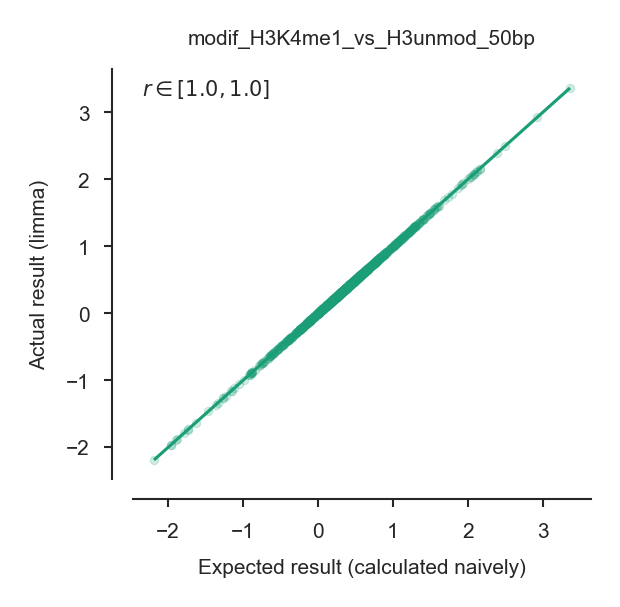

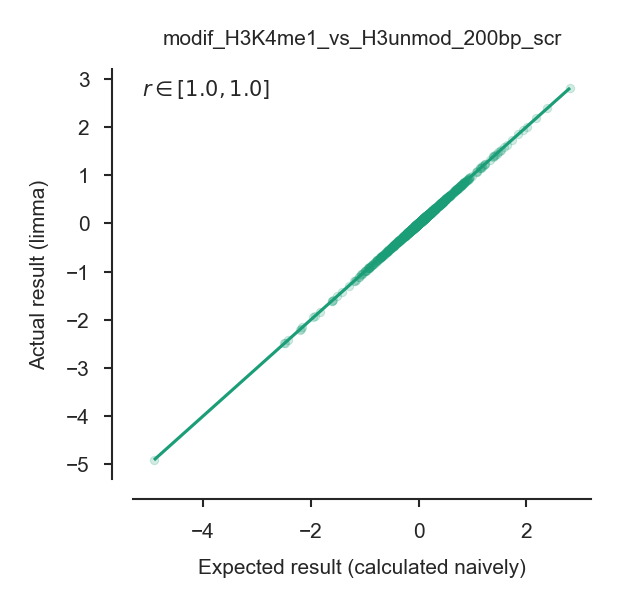

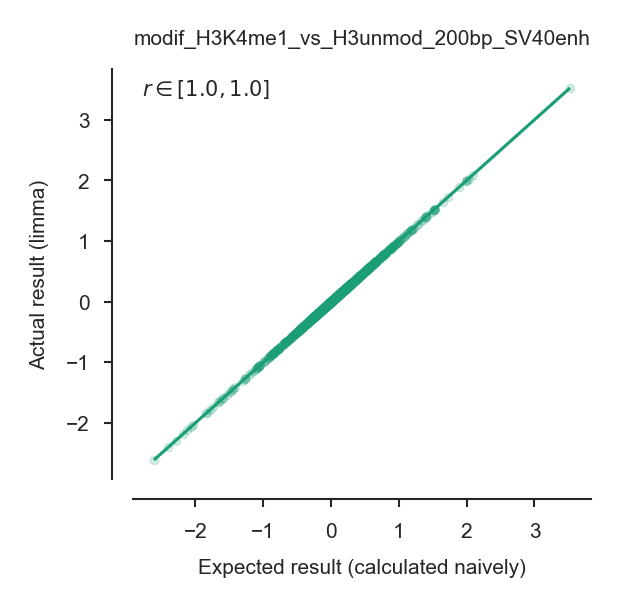

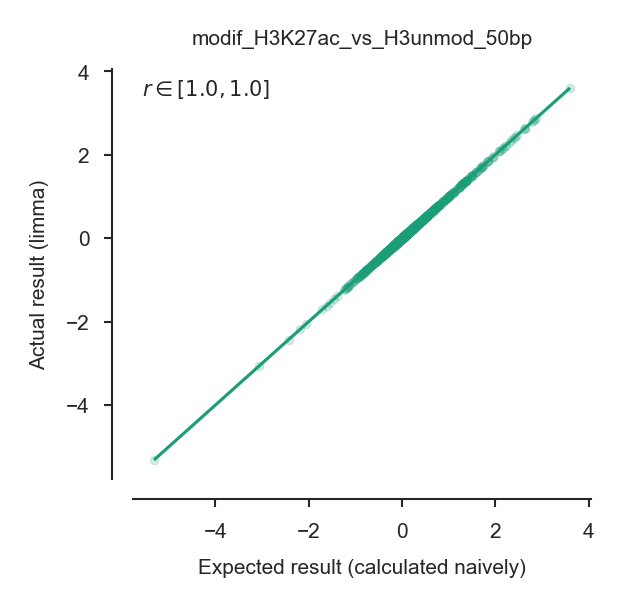

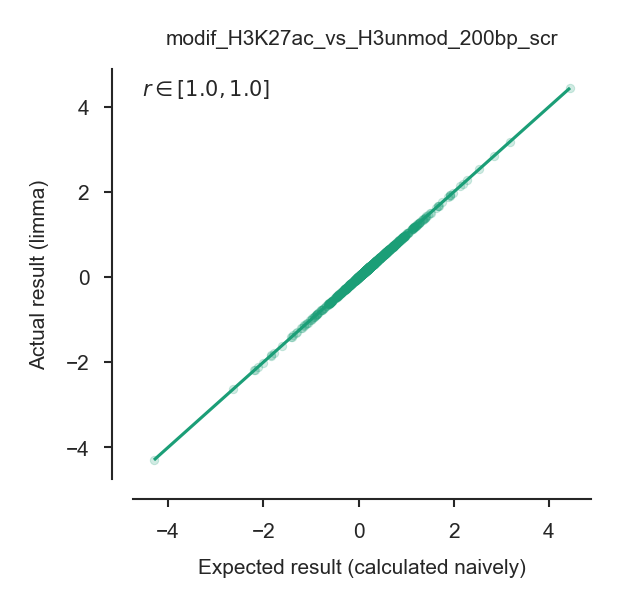

...

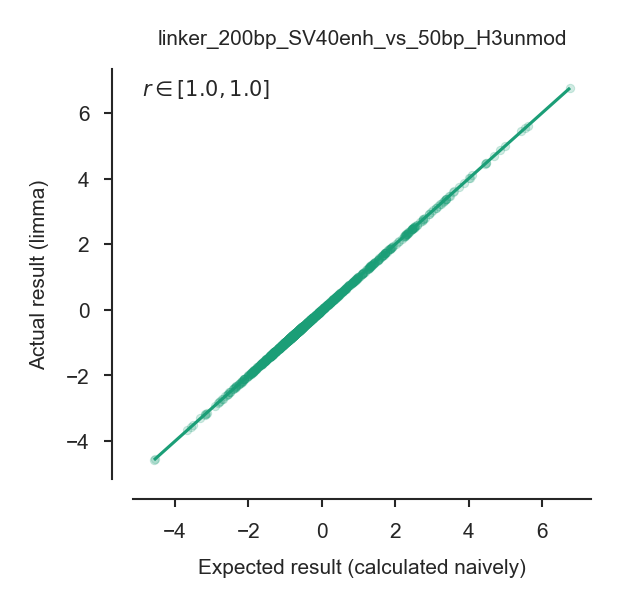

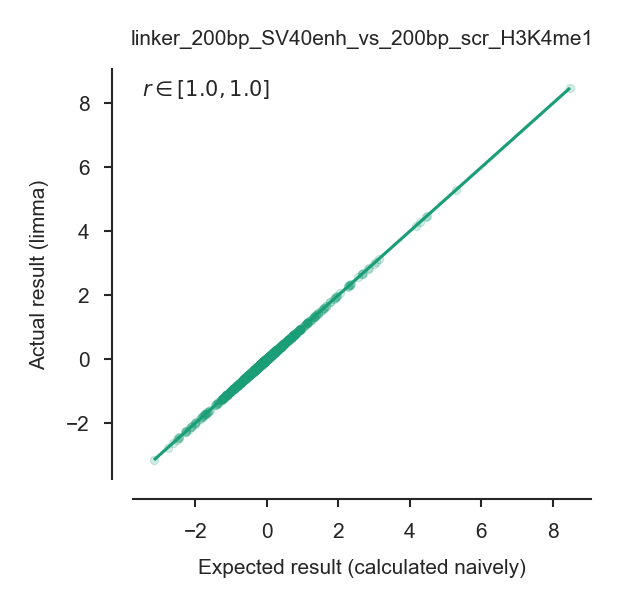

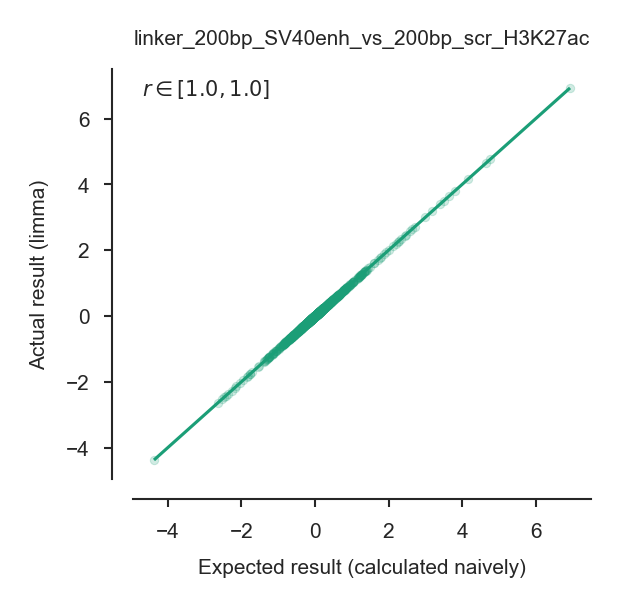

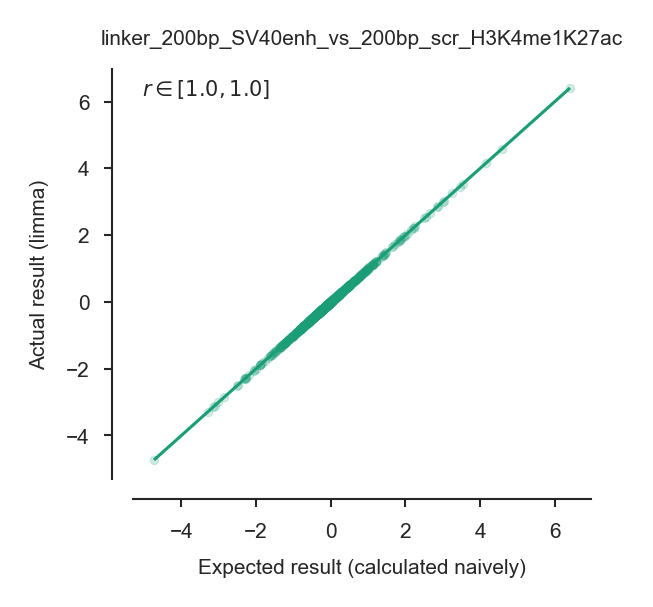

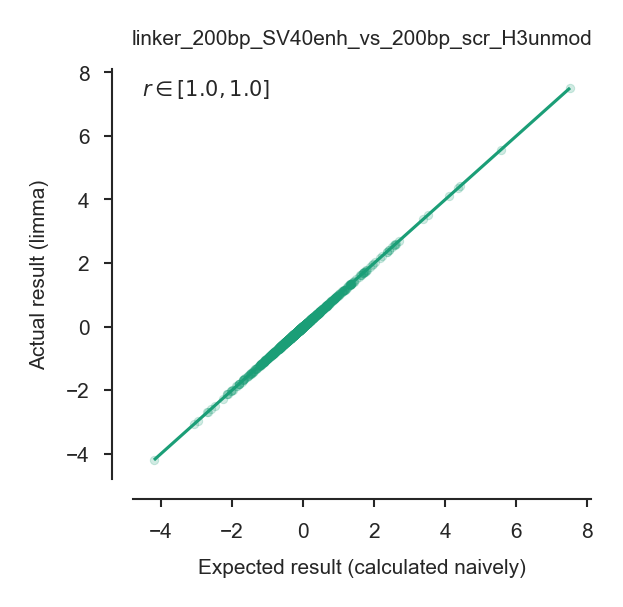

In [105]:
for column, expectation in expected_naively.items():
    fig = plt.figure()
    ax = plt.gca()
    
    _df = pd.DataFrame({'expectation': expectation, 'actual': results[column, 'logFC']})
    
    correlation = pg.corr(_df['expectation'], _df['actual'], method='pearson')
    assert np.abs(correlation.loc['pearson', 'r'] - 1) < 1e-6, '{}: Correlation should be perfect, got: {}'.format(column, correlation.loc['pearson', 'r']) # This should always be one
    correlation = correlation.loc['pearson', 'CI95%']
    
    sns.regplot(x='expectation', y='actual', scatter_kws=dict(alpha=0.2), data=_df)
    
    ax.text(0.02, 0.98, r'$r \in [{}, {}]$'.format(*correlation), transform=ax.transAxes, ha='left', va='top')
    ax.set_xlabel("Expected result (calculated naively)")
    ax.set_ylabel("Actual result (limma)")
    ax.set_title(column)
    sns.despine(ax=ax, offset=5)
    
    ax.grid(False)
    
    _fname = OUTPUT_DIRECTORY / f'04-modelling-sanity-checks-for-coefficient-interpretation-{column}.pdf'
    _caption = f"""
    Comparison of the {column} coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    """
    plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
    with open(str(_fname) + '.caption.md', 'w') as f:
        f.write(_caption)
        print(_caption)
    

In [106]:
results.swaplevel(axis=1)['significant'].sum()

modif_H3K27ac_vs_H3unmod_50bp                       50
modif_H3K27ac_vs_H3unmod_200bp_SV40enh               4
modif_H3K27ac_vs_H3unmod_200bp_scr                  14
modif_H3K4me1K27ac_vs_H3unmod_50bp                  31
modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh          3
modif_H3K4me1K27ac_vs_H3unmod_200bp_scr              9
modif_H3K4me1_vs_H3unmod_50bp                       11
modif_H3K4me1_vs_H3unmod_200bp_SV40enh               1
modif_H3K4me1_vs_H3unmod_200bp_scr                   0
linker_200bp_scr_vs_50bp_H3K27ac                   202
linker_200bp_scr_vs_50bp_H3K4me1K27ac              654
linker_200bp_scr_vs_50bp_H3K4me1                   849
linker_200bp_scr_vs_50bp_H3unmod                   299
linker_200bp_SV40enh_vs_50bp_H3K27ac               283
linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac          901
linker_200bp_SV40enh_vs_50bp_H3K4me1              1001
linker_200bp_SV40enh_vs_50bp_H3unmod               711
linker_200bp_SV40enh_vs_200bp_scr_H3K27ac           43
linker_200

### Imputation

Imputation of results

While the model behaves correctly for most proteins, we want to:

1. flag the following result estimates:
    - estimates which are based only on one data point
    - imputed estimates (see below)
2. impute certain fold change estimates, namely:
    - mark proteins detected in treatments, but not detected in both controls as "infinitely enriched" (logFC=+inf)
    - mark proteins detected in both controls, but not in treatmets as "infinitely excluded" (logFC=-inf)
    - in cases where logFC could not be estimated because one (but not both!) controls are missing, calculate the logFC only from the control that is detected.

In [107]:
def flag_and_or_impute(estimate, treatments, controls):
    
    # Count number of datapoints for treatment and control
    number_non_null_treatments = (~treatments.isnull()).sum(axis=1)
    number_non_null_controls = (~controls.isnull()).sum(axis=1)
    
    # First check if our estimate is based on a single datapoint
    # This is true if treatments have only one non-null value
                                                            
    based_on_single_datapoint = number_non_null_treatments == 1
    # Or the controls have only one non-null value
    based_on_single_datapoint |= number_non_null_controls == 1
    
    # Now let's see if we need to impute some of the estimates
    
    
    # Start with copying the estimates
    imputed_estimate = estimate.copy()
    
    # Find datapoints w/o estimates
    no_estimate = estimate.isnull()
    
    # Impute positive infinities
    imputed_estimate.loc[
        # Where we have no estimate, but treatment data and no control data
        no_estimate & (number_non_null_treatments > 0)  & (number_non_null_controls == 0),
    ] = np.inf
    
    # Impute negative infinities
    imputed_estimate.loc[
        # Where we have no estimate, no treatment data but some control data
        no_estimate & (number_non_null_treatments == 0)  & (number_non_null_controls > 0),
    ] = -np.inf
    
    # Impute estimates where we have some treatment and control data, but still no estimate
    # (this happens when only one of the controls give a value, for instance)
    imputable_entries = no_estimate & (number_non_null_treatments > 0)  & (number_non_null_controls > 0)
    
    # Here we are using the results from the "sanity checks above" - that the mean estimates are
    # the same as model estimates..
    imputed_estimate.loc[
        imputable_entries,
    ] = treatments.loc[imputable_entries].mean(axis=1) - controls.loc[imputable_entries].mean(axis=1)
    
    
    # We can get the list of imputed estimates by comparing the null estimates between the imputed and (real) column:
    
    is_imputed = (~imputed_estimate.isnull()) & (no_estimate)
    
    # assert that for all non-null estimates imputed estimate is the same (i.e. that we didn't override)
    assert_array_equal(imputed_estimate.loc[~no_estimate], estimate.loc[~no_estimate])
    
    
    return pd.DataFrame({
        'logFC_imputed': imputed_estimate,
        'logFC_is_imputed': is_imputed,
        'logFC_based_on_single_datapoint': based_on_single_datapoint, 
    })

In [108]:
results_flags_and_imputations = {}

for contrast, (treat, control) in naive_links.items():
    results_flags_and_imputations[contrast] = flag_and_or_impute(
        results[contrast, 'logFC'], 
        data_to_model_by_experiment_label(treat),
        data_to_model_by_experiment_label(control),
    )
    
results_flags_and_imputations = pd.concat(results_flags_and_imputations, axis=1)
results_flags_and_imputations

modif_H3K4me1_vs_H3unmod_50bp                   \
                        logFC_imputed logFC_is_imputed   
AATF                         0.495044            False   
ABCA13                       0.227906            False   
ABCC1                       -0.121271            False   
ABCF2                        0.236507            False   
ABLIM1                       0.485717            False   
...                               ...              ...   
ZNF687                           -inf             True   
ZNF740                       0.394503            False   
ZNF768                       0.459093            False   
ZRANB2                       0.524112            False   
ZSCAN29                      0.127082            False   

                                        modif_H3K4me1_vs_H3unmod_200bp_scr  \
        logFC_based_on_single_datapoint                      logFC_imputed   
AATF                              False                           0.015364   
ABCA13                            False                           0.150567   
ABCC1                             False                           0.661695   
ABCF2                             False                           0.059173   
ABLIM1                            False                          -0.080946   
...                                 ...                                ...   
ZNF687                             True                           0.280031   
ZNF740                            False                           0.299887   
ZNF768                            False                           0.591049   
ZRANB2                            False                           0.836156   
ZSCAN29                           False                           0.118105   

                                                          \
        logFC_is_imputed logFC_based_on_single_datapoint   
AATF               False                           False   
ABCA13             False                           False   
ABCC1              False                           False   
ABCF2              False                           False   
ABLIM1             False                           False   
...                  ...                             ...   
ZNF687             False                           False   
ZNF740             False                           False   
ZNF768             False                           False   
ZRANB2             False                           False   
ZSCAN29            False                           False   

        modif_H3K4me1_vs_H3unmod_200bp_SV40enh                   \
                                 logFC_imputed logFC_is_imputed   
AATF                                  0.771433            False   
ABCA13                                0.083860            False   
ABCC1                                 0.902382            False   
ABCF2                                 0.436958            False   
ABLIM1                               -0.261290            False   
...                                        ...              ...   
ZNF687                                0.753049            False   
ZNF740                               -0.081791            False   
ZNF768                               -0.233180            False   
ZRANB2                                0.997964            False   
ZSCAN29                               0.155971            False   

                                        modif_H3K27ac_vs_H3unmod_50bp  ...  \
        logFC_based_on_single_datapoint                 logFC_imputed  ...   
AATF                              False                     -0.217347  ...   
ABCA13                            False                     -0.034258  ...   
ABCC1                              True                     -0.705136  ...   
ABCF2                             False                      0.327733  ...   
ABLIM1                            False                     -0.041031  ...   
...                                 ...

In [109]:
for contrast in naive_links:
    n_imputed = results_flags_and_imputations[contrast, 'logFC_is_imputed'].sum()
    print(f'{contrast}: number imputed: {n_imputed}')

modif_H3K4me1_vs_H3unmod_50bp: number imputed: 25
modif_H3K4me1_vs_H3unmod_200bp_scr: number imputed: 10
modif_H3K4me1_vs_H3unmod_200bp_SV40enh: number imputed: 15
modif_H3K27ac_vs_H3unmod_50bp: number imputed: 20
modif_H3K27ac_vs_H3unmod_200bp_scr: number imputed: 10
modif_H3K27ac_vs_H3unmod_200bp_SV40enh: number imputed: 15
modif_H3K4me1K27ac_vs_H3unmod_50bp: number imputed: 18
modif_H3K4me1K27ac_vs_H3unmod_200bp_scr: number imputed: 10
modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh: number imputed: 14
linker_200bp_scr_vs_50bp_H3K4me1: number imputed: 36
linker_200bp_scr_vs_50bp_H3K27ac: number imputed: 25
linker_200bp_scr_vs_50bp_H3K4me1K27ac: number imputed: 25
linker_200bp_scr_vs_50bp_H3unmod: number imputed: 27
linker_200bp_SV40enh_vs_50bp_H3K4me1: number imputed: 34
linker_200bp_SV40enh_vs_50bp_H3K27ac: number imputed: 27
linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac: number imputed: 28
linker_200bp_SV40enh_vs_50bp_H3unmod: number imputed: 36
linker_200bp_SV40enh_vs_200bp_scr_H3K4me1: 

Add data comment columns

In [110]:
def comment_string(flags, column):
    
    if flags['logFC_is_imputed'] and flags['logFC_based_on_single_datapoint']:
        return f'logFC({column}) estimation failed and was imputed based on a single datapoint only'
    elif flags['logFC_is_imputed']:
        return f'logFC({column}) estimation failed and was imputed'
    elif flags['logFC_based_on_single_datapoint']:
        return f'logFC({column}) estimation was based on a single datapoint only'
    elif pd.isnull(flags['logFC_imputed']):
        return f'logFC({column}) estimation failed'
    

In [111]:
contrasts_matrix_as_df.columns

Index(['modif_H3K27ac_vs_H3unmod_50bp',
       'modif_H3K27ac_vs_H3unmod_200bp_SV40enh',
       'modif_H3K27ac_vs_H3unmod_200bp_scr',
       'modif_H3K4me1K27ac_vs_H3unmod_50bp',
       'modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh',
       'modif_H3K4me1K27ac_vs_H3unmod_200bp_scr',
       'modif_H3K4me1_vs_H3unmod_50bp',
       'modif_H3K4me1_vs_H3unmod_200bp_SV40enh',
       'modif_H3K4me1_vs_H3unmod_200bp_scr',
       'linker_200bp_scr_vs_50bp_H3K27ac',
       'linker_200bp_scr_vs_50bp_H3K4me1K27ac',
       'linker_200bp_scr_vs_50bp_H3K4me1', 'linker_200bp_scr_vs_50bp_H3unmod',
       'linker_200bp_SV40enh_vs_50bp_H3K27ac',
       'linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac',
       'linker_200bp_SV40enh_vs_50bp_H3K4me1',
       'linker_200bp_SV40enh_vs_50bp_H3unmod',
       'linker_200bp_SV40enh_vs_200bp_scr_H3K27ac',
       'linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac',
       'linker_200bp_SV40enh_vs_200bp_scr_H3K4me1',
       'linker_200bp_SV40enh_vs_200bp_scr_H3unmod'],
      

In [112]:
comments_results_flags = {
    col: results_flags_and_imputations[col].apply(comment_string, column=col, axis=1) for col in contrasts_matrix_as_df.columns
}

Let's check the imputation results for the representative null proteins below, a reminder of what the data to model for these proteins looks like:

In [113]:
data_to_model.loc[REPRESENTATIVE_NULLS]

Experiment_Linker_Replicate,H3unmod_50bp_repl1,H3K27ac_50bp_repl1,H3K27ac_200bp_scr_repl1,H3K27ac_200bp_SV40enh_repl1,H3K4me1K27ac_50bp_repl1,H3K4me1K27ac_200bp_scr_repl1,H3K4me1K27ac_200bp_SV40enh_repl1,H3unmod_200bp_scr_repl1,H3unmod_200bp_SV40enh_repl1,H3K4me1_50bp_repl1,...,H3K27ac_200bp_scr_repl3,H3K27ac_200bp_SV40enh_repl3,H3K4me1K27ac_50bp_repl3,H3K4me1K27ac_200bp_scr_repl3,H3K4me1K27ac_200bp_SV40enh_repl3,H3unmod_200bp_scr_repl3,H3unmod_200bp_SV40enh_repl3,H3K4me1_50bp_repl3,H3K4me1_200bp_scr_repl3,H3K4me1_200bp_SV40enh_repl3
Label,,,,,,,,,,,,,,,,,,,,,
CENPS,NaN,NaN,21.372100,21.415285,18.335685,21.303621,19.478388,20.698817,20.629481,NaN,...,21.323068,20.551310,NaN,20.528715,20.603407,21.074132,20.440847,NaN,20.740418,19.003831
BUD31,21.654082,21.542728,20.264482,19.751030,22.307763,20.317233,20.050396,21.100499,NaN,21.211540,...,NaN,NaN,21.960375,20.340533,NaN,20.806780,NaN,21.521943,21.318805,18.064755
ZBTB7A,NaN,21.145684,19.519787,21.217348,NaN,19.242313,20.589152,20.602297,NaN,NaN,...,21.462894,21.774779,NaN,20.215615,20.220027,20.074777,20.986653,19.002193,NaN,20.672752
ELK4,NaN,NaN,19.589273,19.250787,NaN,NaN,19.791237,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,20.538224,NaN,20.015441,NaN,NaN,20.250142
ATRX,21.319528,21.831177,18.173016,NaN,20.455818,NaN,NaN,15.682056,17.249456,19.154763,...,NaN,17.065224,21.468729,NaN,NaN,NaN,17.649991,NaN,NaN,18.876058


The corresponding mean estimates for the coefficients minus simple mean of controls (for comparison) where approrpiate

In [114]:
results_flags_and_imputations.loc[REPRESENTATIVE_NULLS].loc(axis=1)[:, 'logFC_imputed']

,modif_H3K4me1_vs_H3unmod_50bp,modif_H3K4me1_vs_H3unmod_200bp_scr,modif_H3K4me1_vs_H3unmod_200bp_SV40enh,modif_H3K27ac_vs_H3unmod_50bp,modif_H3K27ac_vs_H3unmod_200bp_scr,modif_H3K27ac_vs_H3unmod_200bp_SV40enh,modif_H3K4me1K27ac_vs_H3unmod_50bp,modif_H3K4me1K27ac_vs_H3unmod_200bp_scr,modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh,linker_200bp_scr_vs_50bp_H3K4me1,...,linker_200bp_scr_vs_50bp_H3K4me1K27ac,linker_200bp_scr_vs_50bp_H3unmod,linker_200bp_SV40enh_vs_50bp_H3K4me1,linker_200bp_SV40enh_vs_50bp_H3K27ac,linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac,linker_200bp_SV40enh_vs_50bp_H3unmod,linker_200bp_SV40enh_vs_200bp_scr_H3K4me1,linker_200bp_SV40enh_vs_200bp_scr_H3K27ac,linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac,linker_200bp_SV40enh_vs_200bp_scr_H3unmod
,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,...,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed
CENPS,NaN,0.455248,-0.763095,NaN,0.515703,0.867944,inf,0.155643,-0.447018,inf,...,2.541133,inf,inf,inf,1.974196,inf,-1.182619,0.387966,-0.566936,0.035725
BUD31,-0.139257,0.710188,inf,-0.223788,-0.338848,inf,0.535488,-0.265226,inf,-0.340512,...,-1.990671,-1.189957,-2.585758,-1.807359,-2.267269,-inf,-2.245246,-0.502342,-0.276598,-inf
ZBTB7A,inf,-0.547977,-0.205835,inf,0.557880,0.035517,NaN,-0.658034,-0.582064,0.578501,...,inf,inf,1.778625,-0.067356,inf,inf,1.200124,0.335619,0.933953,0.857983
ELK4,NaN,NaN,0.196338,NaN,inf,-0.055085,NaN,NaN,0.252189,NaN,...,NaN,NaN,inf,inf,inf,inf,inf,0.475741,inf,inf
ATRX,-1.875192,-inf,1.517151,0.882082,3.179237,0.945389,-0.274273,2.175071,-0.608478,-inf,...,-2.898554,-5.347899,-0.187888,-3.516923,-3.914436,-3.580231,inf,-0.466179,-1.015882,1.767668



## Output


At this point this notebook is finished, so it's time to collect the results and visualise

Let's start with a combined "comment column", which joins the filtering comment and the flag comments

In [115]:
full_comments = pd.DataFrame({'filter_comment': data_comment, 'norm_comment': comments_norm, **comments_results_flags})
full_comments

,filter_comment,norm_comment,modif_H3K27ac_vs_H3unmod_50bp,modif_H3K27ac_vs_H3unmod_200bp_SV40enh,modif_H3K27ac_vs_H3unmod_200bp_scr,modif_H3K4me1K27ac_vs_H3unmod_50bp,modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh,modif_H3K4me1K27ac_vs_H3unmod_200bp_scr,modif_H3K4me1_vs_H3unmod_50bp,modif_H3K4me1_vs_H3unmod_200bp_SV40enh,...,linker_200bp_scr_vs_50bp_H3K4me1,linker_200bp_scr_vs_50bp_H3unmod,linker_200bp_SV40enh_vs_50bp_H3K27ac,linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac,linker_200bp_SV40enh_vs_50bp_H3K4me1,linker_200bp_SV40enh_vs_50bp_H3unmod,linker_200bp_SV40enh_vs_200bp_scr_H3K27ac,linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac,linker_200bp_SV40enh_vs_200bp_scr_H3K4me1,linker_200bp_SV40enh_vs_200bp_scr_H3unmod
AATF,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ABCA13,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ABCC1,NaN,NaN,None,logFC(modif_H3K27ac_vs_H3unmod_200bp_SV40enh) ...,None,None,logFC(modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40...,None,None,logFC(modif_H3K4me1_vs_H3unmod_200bp_SV40enh) ...,...,None,None,logFC(linker_200bp_SV40enh_vs_50bp_H3K27ac) es...,None,logFC(linker_200bp_SV40enh_vs_50bp_H3K4me1) es...,logFC(linker_200bp_SV40enh_vs_50bp_H3unmod) es...,logFC(linker_200bp_SV40enh_vs_200bp_scr_H3K27a...,None,logFC(linker_200bp_SV40enh_vs_200bp_scr_H3K4me...,logFC(linker_200bp_SV40enh_vs_200bp_scr_H3unmo...
ABCF1,Insufficient number of non-null values,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ABCF2,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF687,NaN,NaN,logFC(modif_H3K27ac_vs_H3unmod_50bp) estimatio...,None,None,logFC(modif_H3K4me1K27ac_vs_H3unmod_50bp) esti...,None,None,logFC(modif_H3K4me1_vs_H3unmod_50bp) estimatio...,None,...,logFC(linker_200bp_scr_vs_50bp_H3K4me1) estima...,logFC(linker_200bp_scr_vs_50bp_H3unmod) estima...,None,logFC(linker_200bp_SV40enh_vs_50bp_H3K4me1K27a...,logFC(linker_200bp_SV40enh_vs_50bp_H3K4me1) es...,logFC(linker_200bp_SV40enh_vs_50bp_H3unmod) es...,None,None,None,None
ZNF740,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ZNF768,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ZRANB2,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


Use a separator of ';'

In [116]:
full_comments = full_comments.apply(lambda x: '; '.join(x.dropna()), axis=1)
full_comments

AATF                                                        
ABCA13                                                      
ABCC1      logFC(modif_H3K27ac_vs_H3unmod_200bp_SV40enh) ...
ABCF1                 Insufficient number of non-null values
ABCF2                                                       
                                 ...                        
ZNF687     logFC(modif_H3K27ac_vs_H3unmod_50bp) estimatio...
ZNF740                                                      
ZNF768                                                      
ZRANB2                                                      
ZSCAN29                                                     
Length: 1630, dtype: object

In [117]:
full_comments.value_counts()

Now gather all the data that we would need to save:

In [118]:
_comments = pd.DataFrame(full_comments.copy())
_comments.columns = pd.MultiIndex.from_tuples([('comment', 'comment')])

_coef_estimates = coef_estimates_design.copy()
_coef_estimates.columns = pd.MultiIndex.from_tuples([('coefficient_estimates', c) for c in _coef_estimates.columns])

_norm_data = data_numeric_log2_normalised.copy()
_norm_data.columns = pd.MultiIndex.from_tuples([('normalised_data', c) for c in _norm_data.columns])

_norm_data_to_reference = data_numeric_log2_normalised_reference_normalised.copy()
_norm_data_to_reference.columns = pd.MultiIndex.from_tuples([('normalised_data_to_reference_experiment', c) for c in _norm_data_to_reference.columns])


In [119]:
full_results = _norm_data.join(_norm_data_to_reference).join(_comments).join(results).join(_coef_estimates).join(results_flags_and_imputations)
full_results

normalised_data                                             \
        H3unmod_50bp_repl1 H3K27ac_50bp_repl1 H3K27ac_200bp_scr_repl1   
Label                                                                   
MYH9             31.754240          31.704148               30.699328   
SPTAN1           30.270718          30.362967               29.358251   
PRKDC            30.268905          30.101944               29.330507   
ACTB             34.841999          34.764251               33.694883   
SPTBN1           30.319057          30.779997               29.689298   
...                    ...                ...                     ...   
NFKBIL1          20.699282          20.677369               19.793881   
NOS1AP           20.854906          21.138037               20.510152   
MBOAT7           21.941052          20.595254               19.181655   
KANK2                  NaN                NaN                     NaN   
ASPM                   NaN          18.666952               19.818109   

                                                             \
        H3K27ac_200bp_SV40enh_repl1 H3K4me1K27ac_50bp_repl1   
Label                                                         
MYH9                      31.097092               31.335658   
SPTAN1                    29.605484               29.922334   
PRKDC                     29.567720               29.583057   
ACTB                      33.817718               34.207474   
SPTBN1                    29.826720               30.134797   
...                             ...                     ...   
NFKBIL1                   19.309033               20.501966   
NOS1AP                    19.614006               20.069806   
MBOAT7                    19.083634               19.362528   
KANK2                           NaN                     NaN   
ASPM                      19.446299               19.667391   

                                                                       \
        H3K4me1K27ac_200bp_scr_repl1 H3K4me1K27ac_200bp_SV40enh_repl1   
Label                                                                   
MYH9                       30.714646                        30.591026   
SPTAN1                     29.255336                        29.090222   
PRKDC                      29.114652                        28.996455   
ACTB                       33.573242                        33.572981   
SPTBN1                     29.771905                        29.756562   
...                              ...                              ...   
NFKBIL1                    19.725630                        19.367988   
NOS1AP                     19.912508                              NaN   
MBOAT7                     19.131905                              NaN   
KANK2                            NaN                              NaN   
ASPM                       20.525366                        19.242909   

                                                             \
        H3unmod_200bp_scr_repl1 H3unmod_200bp_SV40enh_repl1   
Label                                                         
MYH9                  30.740545                   30.218027   
SPTAN1                29.218077                   29.098555   
PRKDC                 28.973287                   29.335126   
ACTB                  33.588246                   33.531476   
SPTBN1                28.852904                   28.822525   
...                         ...                         ...   
NFKBIL1               19.800509                   19.398837   
NOS1AP                20.652443                   19.217136   
MBOAT7                      NaN                         NaN   
KANK2                       NaN                         NaN   
ASPM                  17.463628                         NaN   

                            ... linker_200bp_SV40enh_vs_200bp_scr_H3K4me1  \
        H3K4me1_50bp_repl1  ...           logFC_based_on_single_datapoint   
Label                       ...              

For storage, remove multi-index:

In [120]:
full_results_no_multiindex = full_results.copy()
full_results_no_multiindex.columns = ['___'.join(c) for c in full_results.columns]

In [121]:
full_results_no_multiindex.to_csv(OUTPUT_DIRECTORY / f'07-output-full_results.{DATASET}.csv')

In [122]:
headers['Linker'].unique()

array(['50bp', '200bp_scr', '200bp_SV40enh'], dtype=object)

## Visualisation

In [123]:
results

modif_H3K27ac_vs_H3unmod_50bp                                         \
                                logFC          t       P.Value     adj.P.Val   
TFE3                         2.837710  10.121397  8.489378e-11  1.248179e-07   
USF1                         2.404360   9.839492  1.573004e-10  1.248179e-07   
BHLHE40                      1.936090   8.702045  2.104063e-09  1.113049e-06   
USF2                         2.082324   8.196130  7.043905e-09  2.794669e-06   
MAX                          1.966780   7.082318  1.131437e-07  3.591181e-05   
...                               ...        ...           ...           ...   
GTF2H1                            NaN        NaN           NaN           NaN   
DNAJC11                           NaN        NaN           NaN           NaN   
SFMBT2                            NaN        NaN           NaN           NaN   
RPP14                             NaN        NaN           NaN           NaN   
HASPIN                            NaN        NaN           NaN           NaN   

                                                              \
                 B significant significant_with_large_log2fc   
TFE3     14.544175        True                          True   
USF1     13.971306        True                          True   
BHLHE40  11.541003        True                          True   
USF2     10.398493        True                          True   
MAX       7.754205        True                          True   
...            ...         ...                           ...   
GTF2H1         NaN       False                         False   
DNAJC11        NaN       False                         False   
SFMBT2         NaN       False                         False   
RPP14          NaN       False                         False   
HASPIN         NaN       False                         False   

        modif_H3K27ac_vs_H3unmod_200bp_SV40enh                      ...  \
                                         logFC         t   P.Value  ...   
TFE3                                  0.828642  2.955556  0.006316  ...   
USF1                                  0.805468  3.296261  0.002694  ...   
BHLHE40                               0.276770  1.243984  0.223952  ...   
USF2                                  0.891198  3.507799  0.001564  ...   
MAX                                   0.921505  3.318312  0.002547  ...   
...                                        ...       ...       ...  ...   
GTF2H1                               -0.000305 -0.000495  0.999611  ...   
DNAJC11                                    NaN       NaN       NaN  ...   
SFMBT2                                1.557325  1.961470  0.070574  ...   
RPP14                                 0.462721  0.826392  0.418036  ...   
HASPIN                                     NaN       NaN       NaN  ...   

        linker_200bp_SV40enh_vs_200bp_scr_H3K4me1              \
                                                B significant   
TFE3                                    -4.856445       False   
USF1                                    -6.107235       False   
BHLHE40                                 -6.343264       False   
USF2                                    -5.252630       False   
MAX                                     -6.768597       False   
...                                           ...         ...   
GTF2H1                                  -6.628480       False   
DNAJC11                                 -5.889001       False   
SFMBT2                                  -6.781051       False   
RPP14                                   -6.727006       False   
HASPIN                                  -5.969548       False   

                                       \
        significant_with_large_log2fc   
TFE3                            False   
USF1                            False   
BHLHE40                         False   
USF2                            False   
MAX                             False   
...                      

In [124]:
import textwrap

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


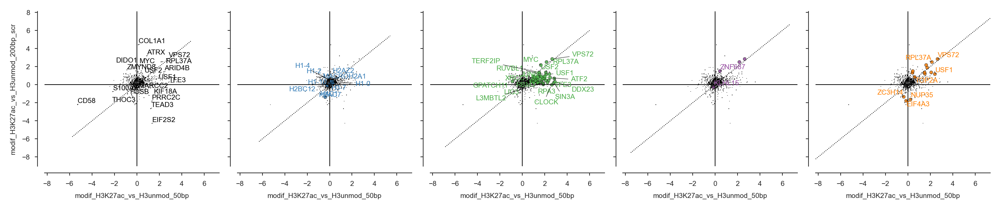

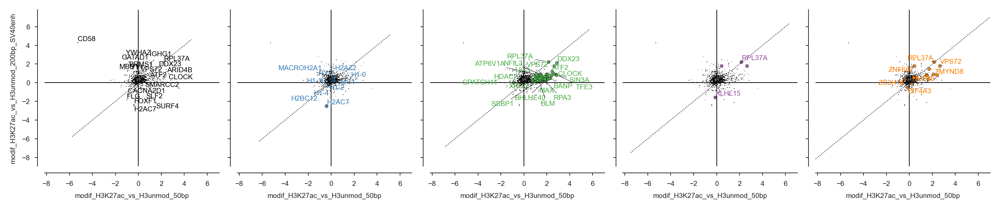

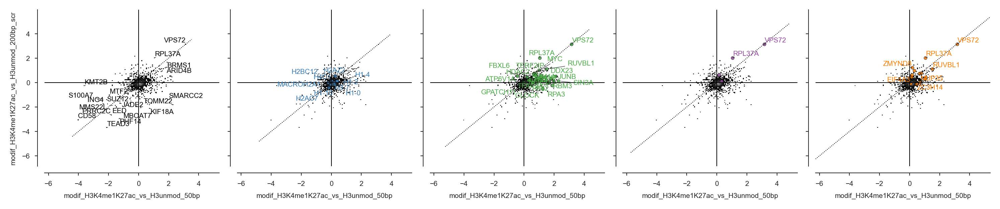

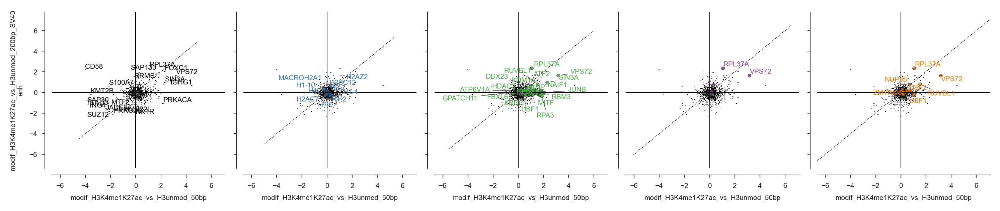

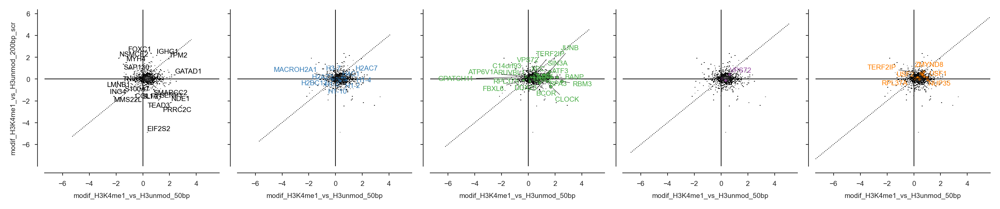

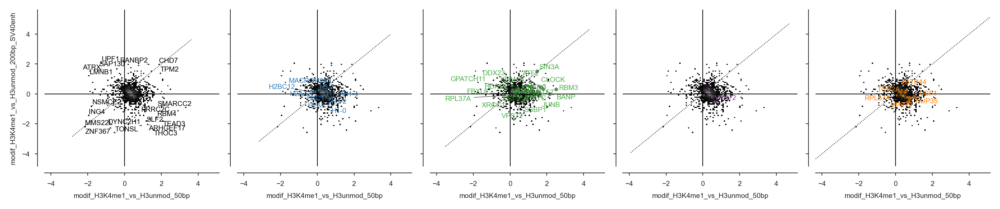

In [125]:
from sklearn.ensemble import IsolationForest
from adjustText import adjust_text
import itertools

if DATASET == 'long-linkers-prom':
    combinations =  [
        ('Promoter_PTMs', '200bp_scr'),
        ('Promoter_PTMs', '200bp_SV40prom')
    ] 
    
elif DATASET == 'long-linkers-enh':
    
    combinations = list(itertools.product(['H3K27ac', 'H3K4me1K27ac', 'H3K4me1'], ['200bp_scr', '200bp_SV40enh']))
else:    
    combinations = list(itertools.product(['H3K27me3', 'H3K9me3'], ['35bp', '40bp', '45bp', '55bp']))


for experiment, linker in combinations:

    fig = plt.figure(figsize=(50*FIVE_MM_IN_INCH, 10*FIVE_MM_IN_INCH), constrained_layout=True)

    axes = fig.subplots(nrows=1, ncols=5, sharex=True, sharey=True)

    _x = (f'modif_{experiment}_vs_{ref_experiment}_{ref_linker}', 'logFC')
    _y = (f'modif_{experiment}_vs_{ref_experiment}_{linker}', 'logFC')
    _df = full_results.dropna(subset=[_x, _y])
    _approx_nlabels = 20

    for ax, col, color in zip(axes, [None] + ['normalisation_proteins'] + list(contrasts_matrix_as_df.columns), sns.color_palette('Set1')):

        sns.histplot(
            x=_x, 
            y=_y, 
            data=_df,
            cmap=sns.blend_palette(['#000000','#969696'], as_cmap=True),
            ax=ax,
        )

        if col is None:
            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(_df), 1e-5, 0.5))

            outliers = if_.fit_predict(_df[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=_df.index)

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color='black'))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)
        elif col == 'normalisation_proteins':


            ax.scatter(
                _df.loc[HISTONES, _x],
                _df.loc[HISTONES, _y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

            texts = []
            for ix in HISTONES:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        else:
            subdf = _df[_df[col, 'significant'].fillna(False)]

            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(subdf), 1e-5, 0.5))
            outliers = if_.fit_predict(subdf[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=subdf.index)

            ax.scatter(
                subdf[_x],
                subdf[_y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

#             ax.legend(title="Significant")

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        ax.grid(False)

        ax.axvline(0, color='black', linestyle='-', linewidth=0.5)
        ax.axhline(0, color='black', linestyle='-', linewidth=0.5)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()

        min_ = np.min([xlim, ylim])
        max_ = np.max([xlim, ylim])

        ax.plot([min_, max_], [min_, max_], linestyle=':', color='k')
        ax.set_xlim(*xlim, *ylim)
        ax.set_xlabel('\n'.join(textwrap.wrap(_x[0], 40)))
        ax.set_ylabel('\n'.join(textwrap.wrap(_y[0], 40)))

        sns.despine(offset=5, ax=ax)

    _fname = OUTPUT_DIRECTORY / f'09-scatterplot-full-results_modif_logfc_{experiment}_{linker}.pdf'
    _caption = f"""
    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR {FDR_THRESHOLD}, BH correction).
    Labels are displayed for a handful of outlier proteins.
    """
    plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
    with open(str(_fname) + '.caption.md', 'w') as f:
        f.write(_caption)
        print(_caption)

Linker datasets:

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


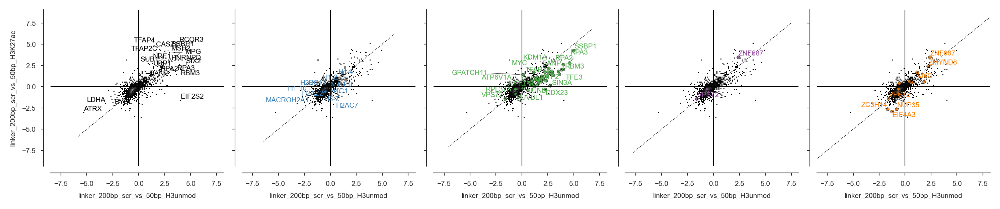

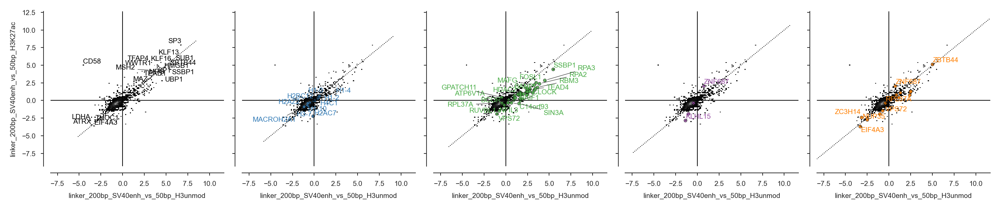

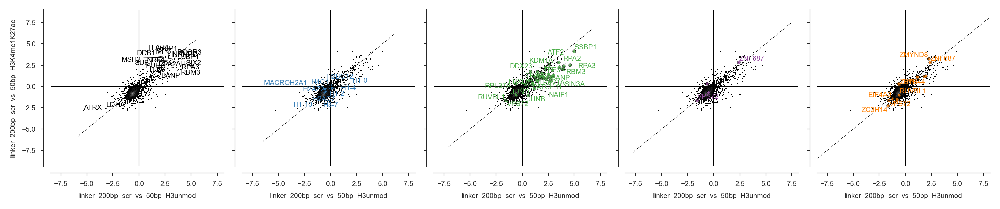

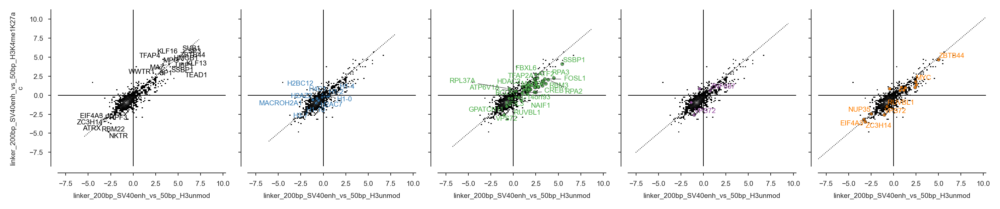

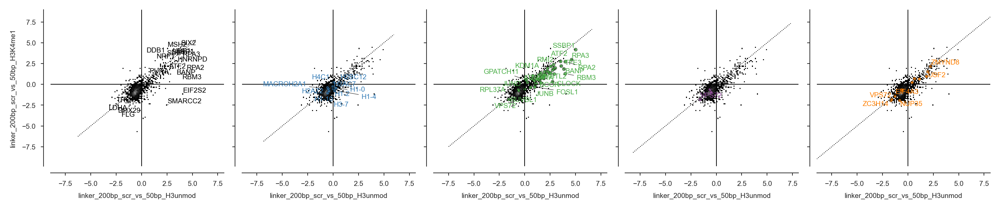

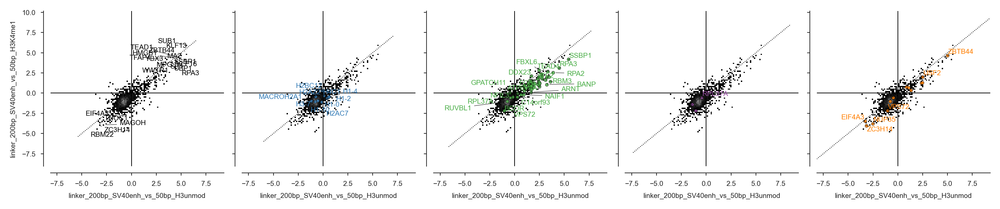

In [126]:
from sklearn.ensemble import IsolationForest
from adjustText import adjust_text
import itertools

if DATASET == 'long-linkers-prom':
    combinations =  [
        ('Promoter_PTMs', '200bp_scr'),
        ('Promoter_PTMs', '200bp_SV40prom'),
        # ('unmodH3_unmodH4', '200bp_scr'),
        # ('unmodH3_unmodH4', '200bp_SV40prom'),
    ] 
    
elif DATASET == 'long-linkers-enh':
    
    combinations = list(itertools.product(['H3K27ac', 'H3K4me1K27ac', 'H3K4me1'], ['200bp_scr', '200bp_SV40enh']))
else:    
    combinations = list(itertools.product(['H3K27me3', 'H3K9me3'], ['35bp', '40bp', '45bp', '55bp']))


for experiment, linker in combinations:

    fig = plt.figure(figsize=(50*FIVE_MM_IN_INCH, 10*FIVE_MM_IN_INCH), constrained_layout=True)

    axes = fig.subplots(nrows=1, ncols=5, sharex=True, sharey=True)

    _x = (f'linker_{linker}_vs_{ref_linker}_{ref_experiment}', 'logFC')
    _y = (f'linker_{linker}_vs_{ref_linker}_{experiment}', 'logFC')
    _df = full_results.dropna(subset=[_x, _y])
    _approx_nlabels = 20

    for ax, col, color in zip(axes, [None] + ['normalisation_proteins'] + list(contrasts_matrix_as_df.columns), sns.color_palette('Set1')):

        sns.histplot(
            x=_x, 
            y=_y, 
            data=_df,
            cmap=sns.blend_palette(['#000000','#969696'], as_cmap=True),
            ax=ax,
        )

        if col is None:
            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(_df), 1e-5, 0.5))

            outliers = if_.fit_predict(_df[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=_df.index)

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color='black'))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)
        elif col == 'normalisation_proteins':


            ax.scatter(
                _df.loc[HISTONES, _x],
                _df.loc[HISTONES, _y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

            texts = []
            for ix in HISTONES:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        else:
            subdf = _df[_df[col, 'significant'].fillna(False)]

            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(subdf), 1e-5, 0.5))
            outliers = if_.fit_predict(subdf[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=subdf.index)

            ax.scatter(
                subdf[_x],
                subdf[_y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

#             ax.legend(title="Significant")

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        ax.grid(False)

        ax.axvline(0, color='black', linestyle='-', linewidth=0.5)
        ax.axhline(0, color='black', linestyle='-', linewidth=0.5)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()

        min_ = np.min([xlim, ylim])
        max_ = np.max([xlim, ylim])

        ax.plot([min_, max_], [min_, max_], linestyle=':', color='k')
        ax.set_xlim(*xlim, *ylim)
        ax.set_xlabel('\n'.join(textwrap.wrap(_x[0], 40)))
        ax.set_ylabel('\n'.join(textwrap.wrap(_y[0], 40)))

        sns.despine(offset=5, ax=ax)

    _fname = OUTPUT_DIRECTORY / f'09-scatterplot-full-results_modif_linker_{experiment}_{linker}.pdf'
    _caption = f"""
    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR {FDR_THRESHOLD}, BH correction).
    Labels are displayed for a handful of outlier proteins.
    """
    plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
    with open(str(_fname) + '.caption.md', 'w') as f:
        f.write(_caption)
        print(_caption)

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


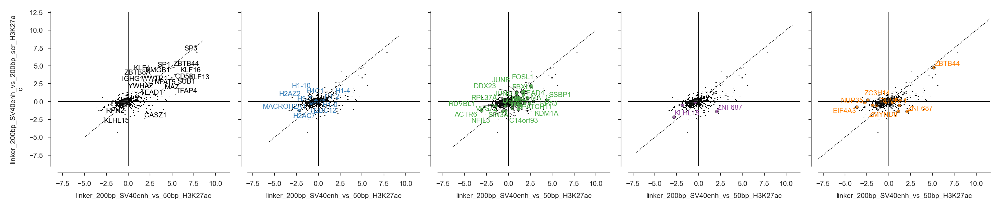

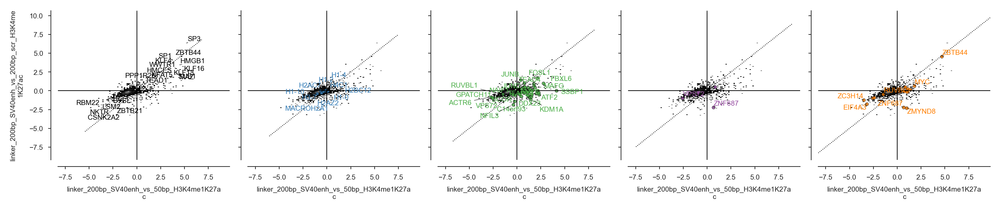

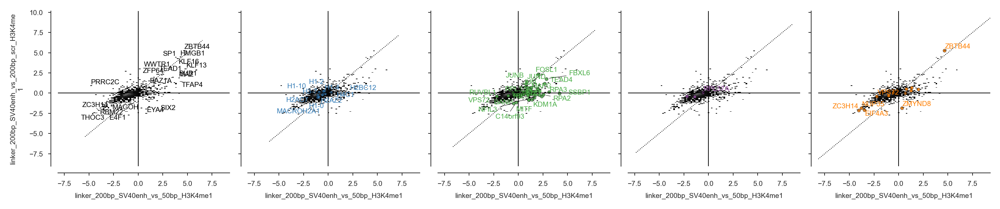

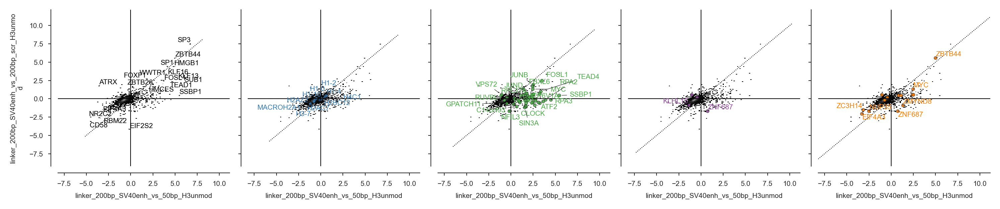

In [127]:
from sklearn.ensemble import IsolationForest
from adjustText import adjust_text
import itertools

if DATASET == 'long-linkers-prom':
    combinations =  [
        ('Promoter_PTMs', '200bp_SV40prom'),
        ('unmodH3_unmodH4', '200bp_SV40prom'),
    ] 
    
elif DATASET == 'long-linkers-enh':
    combinations =  list(itertools.product(['H3K27ac', 'H3K4me1K27ac', 'H3K4me1', 'H3unmod'], ['200bp_SV40enh']))
    # combinations = list(itertools.product(['H3K27ac', 'H3K4me1K27ac', 'H3K4me1'], ['50bp', '200bp_SV40enh']))
else:
    combinations=[]
    # combinations = list(itertools.product(['H3K27me3', 'H3K9me3'], ['35bp', '40bp', '45bp', '55bp']))


for experiment, linker in combinations:

    fig = plt.figure(figsize=(50*FIVE_MM_IN_INCH, 10*FIVE_MM_IN_INCH), constrained_layout=True)

    axes = fig.subplots(nrows=1, ncols=5, sharex=True, sharey=True)

    _x = (f'linker_{linker}_vs_{ref_linker}_{experiment}', 'logFC')
    _y = (f'linker_{linker}_vs_200bp_scr_{experiment}', 'logFC')
    _df = full_results.dropna(subset=[_x, _y])
    _approx_nlabels = 20

    for ax, col, color in zip(axes, [None] + ['normalisation_proteins'] + list(contrasts_matrix_as_df.columns), sns.color_palette('Set1')):

        sns.histplot(
            x=_x, 
            y=_y, 
            data=_df,
            cmap=sns.blend_palette(['#000000','#969696'], as_cmap=True),
            ax=ax,
        )

        if col is None:
            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(_df), 1e-5, 0.5))

            outliers = if_.fit_predict(_df[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=_df.index)

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color='black'))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)
        elif col == 'normalisation_proteins':


            ax.scatter(
                _df.loc[HISTONES, _x],
                _df.loc[HISTONES, _y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

            texts = []
            for ix in HISTONES:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        else:
            subdf = _df[_df[col, 'significant'].fillna(False)]

            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(subdf), 1e-5, 0.5))
            outliers = if_.fit_predict(subdf[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=subdf.index)

            ax.scatter(
                subdf[_x],
                subdf[_y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

#             ax.legend(title="Significant")

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        ax.grid(False)

        ax.axvline(0, color='black', linestyle='-', linewidth=0.5)
        ax.axhline(0, color='black', linestyle='-', linewidth=0.5)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()

        min_ = np.min([xlim, ylim])
        max_ = np.max([xlim, ylim])

        ax.plot([min_, max_], [min_, max_], linestyle=':', color='k')
        ax.set_xlim(*xlim, *ylim)
        ax.set_xlabel('\n'.join(textwrap.wrap(_x[0], 40)))
        ax.set_ylabel('\n'.join(textwrap.wrap(_y[0], 40)))

        sns.despine(offset=5, ax=ax)

    _fname = OUTPUT_DIRECTORY / f'09-scatterplot-full-results_modif_linker_{experiment}_{linker}.pdf'
    _caption = f"""
    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR {FDR_THRESHOLD}, BH correction).
    Labels are displayed for a handful of outlier proteins.
    """
    plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
    with open(str(_fname) + '.caption.md', 'w') as f:
        f.write(_caption)
        print(_caption)